# Separate runs by HKLE due to size limits

# Positions rounded to 10,000

In [1]:
data="TCGA/focused.10000.T.csv.gz"

In [2]:
hkle='SVA_E'

['HERVK113', 'SVA_A', 'SVA_B', 'SVA_C', 'SVA_D', 'SVA_E', 'SVA_F']

Number of insertions detected needed to call insertion present

In [3]:
threshold=3   # 1

In [4]:
import numpy as np
np.__version__

'1.20.3'

In [5]:
import pandas as pd
pd.__version__

'1.2.4'

In [6]:
import matplotlib
matplotlib.__version__

'3.4.2'

In [7]:
import matplotlib.pyplot as plt

In [8]:
# Adjust plot size
#options(repr.plot.width=16, repr.plot.height=6)

# For some reason, if this is in the same cell as the import command, it doesn't work.
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [9]:
import scipy
scipy.__version__

'1.6.3'

In [10]:
from scipy import stats

In [11]:
import seaborn as sns
sns.__version__

'0.11.1'

In [12]:
from datetime import datetime

In [13]:
import sklearn
sklearn.__version__

'0.24.2'

In [14]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [15]:
default_max_columns=pd.get_option('display.max_columns')

In [16]:
default_max_rows=pd.get_option('display.max_rows')

In [17]:
default_precision=pd.get_option('display.precision')

In [18]:
pd.set_option('display.precision', 2)

In [19]:
#default_threshold=np.get_printoptions()['threshold']

In [20]:
#np.set_printoptions(threshold=10000000)

# Read Metadata 1

In [21]:
mt1=pd.read_csv("TCGA/metadata.cart.TCGA.GBM-LGG.WGS.bam.2020-07-17.csv",header=None,
 names=['submitter','days_to_death','gender','disease_type','center_name'])

In [22]:
mt1.shape

(127, 5)

In [23]:
mt1.rename(columns={"submitter": "subject"},inplace=True)
mt1.rename(columns={"gender": "gender1"},inplace=True)

In [24]:
mt1.head()

,subject,days_to_death,gender1,disease_type,center_name
0,02-2483,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
1,02-2485,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
2,06-0125,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
3,06-0152,375.0,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
4,06-0157,97.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard


In [25]:
list(mt1)

['subject', 'days_to_death', 'gender1', 'disease_type', 'center_name']

# Read Metadata 2

In [26]:
mt2=pd.read_csv("TCGA/TCGA.Glioma.metadata.tsv",sep="\t")

In [27]:
mt2.shape

(1114, 18)

In [28]:
mt2.head()

,case_submitter_id,project_id,primary_diagnosis,race,ethnicity,gender,RE_names,IDH,x1p19q,TERT,IDH_1p19q_status,WHO_groups,Triple_group,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status
0,TCGA-02-0001,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,44.0,11.76,1.0
1,TCGA-02-0003,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,50.0,4.73,1.0
2,TCGA-02-0004,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,NaN,NaN,IDH-WT:1p19q-NA,NaN,IDH-WT:1p19q-NA:TERT-NA,MD Anderson Cancer Center,NaN,59.0,11.33,1.0
3,TCGA-02-0006,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,56.0,18.33,1.0
4,TCGA-02-0007,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,40.0,23.16,1.0


In [29]:
list(mt2)

['case_submitter_id',
 'project_id',
 'primary_diagnosis',
 'race',
 'ethnicity',
 'gender',
 'RE_names',
 'IDH',
 'x1p19q',
 'TERT',
 'IDH_1p19q_status',
 'WHO_groups',
 'Triple_group',
 'Tissue_sample_location',
 'MGMT',
 'Age',
 'Survival_months',
 'Vital_status']

In [30]:
mt2['subject']=mt2['case_submitter_id'].astype(str).str[5:12]

In [31]:
mt2[['subject','case_submitter_id']].head()

,subject,case_submitter_id
0,02-0001,TCGA-02-0001
1,02-0003,TCGA-02-0003
2,02-0004,TCGA-02-0004
3,02-0006,TCGA-02-0006
4,02-0007,TCGA-02-0007


In [32]:
mt2.drop('case_submitter_id',axis='columns',inplace=True)
mt2.rename(columns={"gender": "gender2"},inplace=True)

In [33]:
list(mt2)

['project_id',
 'primary_diagnosis',
 'race',
 'ethnicity',
 'gender2',
 'RE_names',
 'IDH',
 'x1p19q',
 'TERT',
 'IDH_1p19q_status',
 'WHO_groups',
 'Triple_group',
 'Tissue_sample_location',
 'MGMT',
 'Age',
 'Survival_months',
 'Vital_status',
 'subject']

# Merge Metadata

In [34]:
#meta=mt2.merge(mt1,left_on='subject2',right_on='subject1',suffixes=["_mt2","_mt1"],how='inner')
meta=mt2.merge(mt1,on='subject',suffixes=["_mt2","_mt1"],how='inner')

In [35]:
del mt1
del mt2

In [36]:
meta.head()

,project_id,primary_diagnosis,race,ethnicity,gender2,RE_names,IDH,x1p19q,TERT,IDH_1p19q_status,...,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status,subject,days_to_death,gender1,disease_type,center_name
0,TCGA-GBM,Glioblastoma,asian,not hispanic or latino,male,02-2483-01A-01R-1849-01+1,Mutant,non-codel,WT,IDH-Mutant:1p19q-non-codel,...,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,02-2483,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
1,TCGA-GBM,Glioblastoma,black or african american,not hispanic or latino,male,02-2485-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,MD Anderson Cancer Center,Unmethylated,53.0,15.44,0.0,02-2485,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
2,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,06-0125-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,Henry Ford Hospital,Methylated,63.0,47.57,1.0,06-0125,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
3,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,...,Henry Ford Hospital,NaN,68.0,12.32,1.0,06-0152,375.0,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
4,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,06-0157-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,Henry Ford Hospital,NaN,63.0,3.19,1.0,06-0157,97.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard


In [37]:
meta.drop(meta[(meta['subject']=='CS-6186') & (meta['center_name']=='Harvard Medical School')].index,inplace=True)

In [38]:
meta.drop(meta[(meta['subject']=='DU-5872') & (meta['center_name']=='Harvard Medical School')].index,inplace=True)

In [39]:
meta.columns

Index(['project_id', 'primary_diagnosis', 'race', 'ethnicity', 'gender2',
       'RE_names', 'IDH', 'x1p19q', 'TERT', 'IDH_1p19q_status', 'WHO_groups',
       'Triple_group', 'Tissue_sample_location', 'MGMT', 'Age',
       'Survival_months', 'Vital_status', 'subject', 'days_to_death',
       'gender1', 'disease_type', 'center_name'],
      dtype='object')

In [40]:
meta['primary_diagnosis'].value_counts()

Glioblastoma                     35
Oligodendroglioma, NOS           33
Astrocytoma, anaplastic          24
Mixed glioma                     16
Astrocytoma, NOS                  9
Oligodendroglioma, anaplastic     8
Name: primary_diagnosis, dtype: int64

In [41]:
meta['TERT'].value_counts()

Mutant    68
WT        54
Name: TERT, dtype: int64

In [42]:
meta['IDH'].value_counts()

Mutant    74
WT        50
Name: IDH, dtype: int64

In [43]:
meta['x1p19q'].value_counts()

non-codel    102
codel         23
Name: x1p19q, dtype: int64

In [44]:
meta['disease_type'].value_counts()

Brain Lower Grade Glioma    90
Glioblastoma Multiforme     35
Name: disease_type, dtype: int64

In [45]:
meta['gender1'].value_counts()

male      72
female    53
Name: gender1, dtype: int64

In [46]:
meta['race'].value_counts()

white                        114
black or african american      7
not reported                   3
asian                          1
Name: race, dtype: int64

In [47]:
meta['ethnicity'].value_counts()

not hispanic or latino    108
not reported               11
hispanic or latino          6
Name: ethnicity, dtype: int64

In [48]:
meta['IDH_1p19q_status'].value_counts()

IDH-Mutant:1p19q-non-codel    51
IDH-WT:1p19q-non-codel        50
IDH-Mutant:1p19q-codel        23
IDH-NA:1p19q-non-codel         1
Name: IDH_1p19q_status, dtype: int64

In [49]:
meta['WHO_groups'].value_counts()

glioblastoma:IDH-WT:1p19q-non-codel             29
oligodendroglioma:IDH-Mutant:1p19q-codel        23
astrocytoma:IDH-Mutant:1p19q-non-codel          18
astrocytoma:IDH-WT:1p19q-non-codel              13
oligodendroglioma:IDH-Mutant:1p19q-non-codel    13
oligoastrocytoma:IDH-Mutant:1p19q-non-codel     11
glioblastoma:IDH-Mutant:1p19q-non-codel          5
oligodendroglioma:IDH-WT:1p19q-non-codel         4
oligoastrocytoma:IDH-WT:1p19q-non-codel          4
Name: WHO_groups, dtype: int64

In [50]:
meta['Triple_group'].value_counts()

IDH-Mutant:1p19q-non-codel:TERT-WT        49
IDH-WT:1p19q-non-codel:TERT-Mutant        44
IDH-Mutant:1p19q-codel:TERT-Mutant        22
IDH-WT:1p19q-non-codel:TERT-WT             4
IDH-WT:1p19q-non-codel:TERT-NA             2
IDH-Mutant:1p19q-non-codel:TERT-NA         1
IDH-Mutant:1p19q-codel:TERT-WT             1
IDH-Mutant:1p19q-non-codel:TERT-Mutant     1
IDH-NA:1p19q-non-codel:TERT-Mutant         1
Name: Triple_group, dtype: int64

In [51]:
meta['MGMT'].value_counts()

Methylated      87
Unmethylated    27
Name: MGMT, dtype: int64

In [52]:
meta['center_name'].value_counts()

Broad Institute of MIT and Harvard    75
Harvard Medical School                50
Name: center_name, dtype: int64

## We need a multi-level index to merge with df later so adding an empty index level

In [53]:
meta.columns=[meta.columns,[''] * len(meta.columns)]

In [54]:
#meta.columns.names=['chromosome','position']

In [55]:
meta.columns

MultiIndex([(            'project_id', ''),
            (     'primary_diagnosis', ''),
            (                  'race', ''),
            (             'ethnicity', ''),
            (               'gender2', ''),
            (              'RE_names', ''),
            (                   'IDH', ''),
            (                'x1p19q', ''),
            (                  'TERT', ''),
            (      'IDH_1p19q_status', ''),
            (            'WHO_groups', ''),
            (          'Triple_group', ''),
            ('Tissue_sample_location', ''),
            (                  'MGMT', ''),
            (                   'Age', ''),
            (       'Survival_months', ''),
            (          'Vital_status', ''),
            (               'subject', ''),
            (         'days_to_death', ''),
            (               'gender1', ''),
            (          'disease_type', ''),
            (           'center_name', '')],
           )

# Read raw data and cleanup

In [56]:
#df=pd.read_csv("focused.csv.gz",header=[0,1,2,3],index_col=[0,1])
#df.columns.names=['sample','pup','hkle','q']
#df=df.T
df=pd.read_csv(data,header=[0,1],index_col=[0,1,2,3])

df.reset_index(inplace=True)
df.head()


chromosome       sample     pup      hkle mapq    chr1                  \
position                                       1040000 1190000 1300000   
0           02-2483-01A  paired  HERVK113  Q20       0       0       0   
1           02-2483-01A  paired     SVA_A  Q20       0       0       0   
2           02-2483-01A  paired     SVA_B  Q20       0       0       0   
3           02-2483-01A  paired     SVA_C  Q20       0       0       0   
4           02-2483-01A  paired     SVA_D  Q20       0       0       0   

chromosome                          ...     chrY                             \
position   1400000 1410000 1580000  ... 17180000 18940000 19530000 19690000   
0                4       1       4  ...        0        0        0        2   
1                0       0       0  ...        0        0        0        0   
2                0       0       0  ...        0        0        0        0   
3                0       0       0  ...        0        0        0        0   
4                0       0       0  ...        0        0        0        0   

chromosome                                                        
position   19700000 20550000 20970000 21040000 21210000 21630000  
0                 0        0        0        0        0        0  
1                 0        0        0        0        0        0  
2                 0        0        0        0        0        0  
3                 0        0        0        0        0        0  
4                 0        0        0        0        0        0  

[5 rows x 14541 columns]

In [57]:
df['subject']=df['sample'].str[0:7]
df['subject']

0       02-2483
1       02-2483
2       02-2483
3       02-2483
4       02-2483
         ...   
1913    TQ-A8XE
1914    TQ-A8XE
1915    TQ-A8XE
1916    TQ-A8XE
1917    TQ-A8XE
Name: subject, Length: 1918, dtype: object

In [58]:
df.columns

MultiIndex([( 'sample',         ''),
            (    'pup',         ''),
            (   'hkle',         ''),
            (   'mapq',         ''),
            (   'chr1',  '1040000'),
            (   'chr1',  '1190000'),
            (   'chr1',  '1300000'),
            (   'chr1',  '1400000'),
            (   'chr1',  '1410000'),
            (   'chr1',  '1580000'),
            ...
            (   'chrY', '18940000'),
            (   'chrY', '19530000'),
            (   'chrY', '19690000'),
            (   'chrY', '19700000'),
            (   'chrY', '20550000'),
            (   'chrY', '20970000'),
            (   'chrY', '21040000'),
            (   'chrY', '21210000'),
            (   'chrY', '21630000'),
            ('subject',         '')],
           names=['chromosome', 'position'], length=14542)

In [59]:
df.head()

chromosome       sample     pup      hkle mapq    chr1                  \
position                                       1040000 1190000 1300000   
0           02-2483-01A  paired  HERVK113  Q20       0       0       0   
1           02-2483-01A  paired     SVA_A  Q20       0       0       0   
2           02-2483-01A  paired     SVA_B  Q20       0       0       0   
3           02-2483-01A  paired     SVA_C  Q20       0       0       0   
4           02-2483-01A  paired     SVA_D  Q20       0       0       0   

chromosome                          ...     chrY                             \
position   1400000 1410000 1580000  ... 18940000 19530000 19690000 19700000   
0                4       1       4  ...        0        0        2        0   
1                0       0       0  ...        0        0        0        0   
2                0       0       0  ...        0        0        0        0   
3                0       0       0  ...        0        0        0        0   
4                0       0       0  ...        0        0        0        0   

chromosome                                               subject  
position   20550000 20970000 21040000 21210000 21630000           
0                 0        0        0        0        0  02-2483  
1                 0        0        0        0        0  02-2483  
2                 0        0        0        0        0  02-2483  
3                 0        0        0        0        0  02-2483  
4                 0        0        0        0        0  02-2483  

[5 rows x 14542 columns]

In [60]:
df.set_index(['subject','sample','pup','hkle','mapq'],inplace=True)

In [61]:
df.head()

chromosome                                  chr1                          \
position                                 1040000 1190000 1300000 1400000   
subject sample      pup    hkle     mapq                                   
02-2483 02-2483-01A paired HERVK113 Q20        0       0       0       4   
                           SVA_A    Q20        0       0       0       0   
                           SVA_B    Q20        0       0       0       0   
                           SVA_C    Q20        0       0       0       0   
                           SVA_D    Q20        0       0       0       0   

chromosome                                                                \
position                                 1410000 1580000 2210000 2510000   
subject sample      pup    hkle     mapq                                   
02-2483 02-2483-01A paired HERVK113 Q20        1       4       0       0   
                           SVA_A    Q20        0       0       0       0   
                           SVA_B    Q20        0       0       0       0   
                           SVA_C    Q20        0       0       0       0   
                           SVA_D    Q20        0       0       0       0   

chromosome                                                ...     chrY  \
position                                 2580000 3120000  ... 17180000   
subject sample      pup    hkle     mapq                  ...            
02-2483 02-2483-01A paired HERVK113 Q20        0       0  ...        0   
                           SVA_A    Q20        0       0  ...        0   
                           SVA_B    Q20        0       0  ...        0   
                           SVA_C    Q20        0       0  ...        0   
                           SVA_D    Q20        0       0  ...        0   

chromosome                                                                    \
position                                 18940000 19530000 19690000 19700000   
subject sample      pup    hkle     mapq                                       
02-2483 02-2483-01A paired HERVK113 Q20         0        0        2        0   
                           SVA_A    Q20         0        0        0        0   
                           SVA_B    Q20         0        0        0        0   
                           SVA_C    Q20         0        0        0        0   
                           SVA_D    Q20         0        0        0        0   

chromosome                                                                    \
position                                 20550000 20970000 21040000 21210000   
subject sample      pup    hkle     mapq                                       
02-2483 02-2483-01A paired HERVK113 Q20         0        0        0        0   
                           SVA_A    Q20         0        0        0        0   
                           SVA_B    Q20         0        0        0        0   
                           SVA_C    Q20         0        0        0        0   
                           SVA_D    Q20         0        0        0        0   

chromosome                                         
position                                 21630000  
subject sample      pup    hkle     mapq           
02-2483 02-2483-01A paired HERVK113 Q20         0  
                           SVA_A    Q20         0  
                           SVA_B    Q20         0  
                           SVA_C    Q20         0  
                           SVA_D    Q20         0  

[5 rows x 14537 columns]

In [62]:
df.shape

(1918, 14537)

## Remove "pup" and "q" as they are useless in this dataset.

In [63]:
df=df.droplevel('pup',axis='index').droplevel('mapq',axis='index')

In [64]:
df.head()

chromosome                      chr1                                          \
position                     1040000 1190000 1300000 1400000 1410000 1580000   
subject sample      hkle                                                       
02-2483 02-2483-01A HERVK113       0       0       0       4       1       4   
                    SVA_A          0       0       0       0       0       0   
                    SVA_B          0       0       0       0       0       0   
                    SVA_C          0       0       0       0       0       0   
                    SVA_D          0       0       0       0       0       0   

chromosome                                                    ...     chrY  \
position                     2210000 2510000 2580000 3120000  ... 17180000   
subject sample      hkle                                      ...            
02-2483 02-2483-01A HERVK113       0       0       0       0  ...        0   
                    SVA_A          0       0       0       0  ...        0   
                    SVA_B          0       0       0       0  ...        0   
                    SVA_C          0       0       0       0  ...        0   
                    SVA_D          0       0       0       0  ...        0   

chromosome                                                                 \
position                     18940000 19530000 19690000 19700000 20550000   
subject sample      hkle                                                    
02-2483 02-2483-01A HERVK113        0        0        2        0        0   
                    SVA_A           0        0        0        0        0   
                    SVA_B           0        0        0        0        0   
                    SVA_C           0        0        0        0        0   
                    SVA_D           0        0        0        0        0   

chromosome                                                        
position                     20970000 21040000 21210000 21630000  
subject sample      hkle                                          
02-2483 02-2483-01A HERVK113        0        0        0        0  
                    SVA_A           0        0        0        0  
                    SVA_B           0        0        0        0  
                    SVA_C           0        0        0        0  
                    SVA_D           0        0        0        0  

[5 rows x 14537 columns]

In [65]:
df.shape

(1918, 14537)

## Drop recurrent tumor (-02?)

In [66]:
df.loc[df.index.get_level_values('sample').str.contains("-02.$")].index

MultiIndex([('06-0125', '06-0125-02A', 'HERVK113'),
            ('06-0125', '06-0125-02A',    'SVA_A'),
            ('06-0125', '06-0125-02A',    'SVA_B'),
            ('06-0125', '06-0125-02A',    'SVA_C'),
            ('06-0125', '06-0125-02A',    'SVA_D'),
            ('06-0125', '06-0125-02A',    'SVA_E'),
            ('06-0125', '06-0125-02A',    'SVA_F'),
            ('06-0152', '06-0152-02A', 'HERVK113'),
            ('06-0152', '06-0152-02A',    'SVA_A'),
            ('06-0152', '06-0152-02A',    'SVA_B'),
            ...
            ('TQ-A7RV', 'TQ-A7RV-02A',    'SVA_D'),
            ('TQ-A7RV', 'TQ-A7RV-02A',    'SVA_E'),
            ('TQ-A7RV', 'TQ-A7RV-02A',    'SVA_F'),
            ('TQ-A8XE', 'TQ-A8XE-02A', 'HERVK113'),
            ('TQ-A8XE', 'TQ-A8XE-02A',    'SVA_A'),
            ('TQ-A8XE', 'TQ-A8XE-02A',    'SVA_B'),
            ('TQ-A8XE', 'TQ-A8XE-02A',    'SVA_C'),
            ('TQ-A8XE', 'TQ-A8XE-02A',    'SVA_D'),
            ('TQ-A8XE', 'TQ-A8XE-02A',    'SVA_E

In [67]:
df.drop(df.loc[df.index.get_level_values('sample').str.contains("-02.$")].index,axis='index',inplace=True)

In [68]:
df.loc[df.index.get_level_values('sample').str.contains("-02.$")].index

MultiIndex([], names=['subject', 'sample', 'hkle'])

## Drop solid normal (-11?) (I've seen a couple)

In [69]:
df.loc[df.index.get_level_values('sample').str.contains("-11.$")].index

MultiIndex([('FG-5963', 'FG-5963-11A', 'HERVK113'),
            ('FG-5963', 'FG-5963-11A',    'SVA_A'),
            ('FG-5963', 'FG-5963-11A',    'SVA_B'),
            ('FG-5963', 'FG-5963-11A',    'SVA_C'),
            ('FG-5963', 'FG-5963-11A',    'SVA_D'),
            ('FG-5963', 'FG-5963-11A',    'SVA_E'),
            ('FG-5963', 'FG-5963-11A',    'SVA_F')],
           names=['subject', 'sample', 'hkle'])

In [70]:
df.drop(df.loc[df.index.get_level_values('sample').str.contains("-11.$")].index,axis='index',inplace=True)

In [71]:
df.loc[df.index.get_level_values('sample').str.contains("-11.$")].index

MultiIndex([], names=['subject', 'sample', 'hkle'])

## Drop solitary tumor / normal ( not sure how to do this programmatically )

* FG-5963-01A
* CS-5390-10A

In [72]:
df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index

MultiIndex([('FG-5963', 'FG-5963-01A', 'HERVK113'),
            ('FG-5963', 'FG-5963-01A',    'SVA_A'),
            ('FG-5963', 'FG-5963-01A',    'SVA_B'),
            ('FG-5963', 'FG-5963-01A',    'SVA_C'),
            ('FG-5963', 'FG-5963-01A',    'SVA_D'),
            ('FG-5963', 'FG-5963-01A',    'SVA_E'),
            ('FG-5963', 'FG-5963-01A',    'SVA_F')],
           names=['subject', 'sample', 'hkle'])

In [73]:
df.drop(df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index,axis='index',inplace=True)

In [74]:
df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index

MultiIndex([], names=['subject', 'sample', 'hkle'])

In [75]:
df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index

MultiIndex([('CS-5390', 'CS-5390-10A', 'HERVK113'),
            ('CS-5390', 'CS-5390-10A',    'SVA_A'),
            ('CS-5390', 'CS-5390-10A',    'SVA_B'),
            ('CS-5390', 'CS-5390-10A',    'SVA_C'),
            ('CS-5390', 'CS-5390-10A',    'SVA_D'),
            ('CS-5390', 'CS-5390-10A',    'SVA_E'),
            ('CS-5390', 'CS-5390-10A',    'SVA_F')],
           names=['subject', 'sample', 'hkle'])

In [76]:
df.drop(df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index,axis='index',inplace=True)

In [77]:
df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index

MultiIndex([], names=['subject', 'sample', 'hkle'])

# Match earlier HERVK113 notebook counts
* CS-5390-10A - 553
* FG-5963-01A - 68
* CS-6186-01A - 1100
* CS-6186-10A - 950
* DU-5872-01A - 1108
* DU-5872-10A - 776
* 02-2483-01A - 568
* 02-2483-10A - 557
* 02-2485-01A - 587
* 02-2485-10A - 498
* 06-0125-01A - 734

In [78]:
df[df[df.columns]>0].count(axis='columns')['CS-6186','CS-6186-01A']

hkle
HERVK113     895
SVA_A       1836
SVA_B       1835
SVA_C       1850
SVA_D       1871
SVA_E       1851
SVA_F       1548
dtype: int64

In [79]:
df[df[df.columns]>0].count(axis='columns')['CS-6186','CS-6186-10A']

hkle
HERVK113     786
SVA_A       1663
SVA_B       1621
SVA_C       1604
SVA_D       1615
SVA_E       1585
SVA_F       1340
dtype: int64

In [80]:
df[df[df.columns]>0].count(axis='columns')['DU-5872','DU-5872-01A']

hkle
HERVK113     892
SVA_A       2168
SVA_B       2174
SVA_C       2140
SVA_D       2150
SVA_E       2139
SVA_F       1883
dtype: int64

In [81]:
df[df[df.columns]>0].count(axis='columns')['DU-5872','DU-5872-10A']

hkle
HERVK113     639
SVA_A       1669
SVA_B       1672
SVA_C       1641
SVA_D       1649
SVA_E       1628
SVA_F       1360
dtype: int64

## Keep only Broad and drop Harvard Medical School

### Harvard's samples were really low coverage?

In [82]:
meta[meta['center_name'] == 'Broad Institute of MIT and Harvard']['subject'].unique()


array(['02-2483', '02-2485', '06-0125', '06-0152', '06-0157', '06-0171',
       '06-0190', '06-0210', '06-0211', '06-0214', '06-0221', '06-0686',
       '06-0744', '06-0745', '06-2557', '06-2570', '06-5411', '06-5415',
       '14-1034', '14-1402', '14-1823', '14-2554', '15-1444', '19-1389',
       '19-2620', '19-2624', '19-2629', '19-5960', '26-5132', '26-5135',
       '27-1831', '27-2523', '27-2528', '32-1970', '41-5651', 'CS-5390',
       'CS-5395', 'CS-6186', 'CS-6665', 'CS-6668', 'CS-6669', 'DB-5278',
       'DH-A669', 'DU-5870', 'DU-5872', 'DU-5874', 'DU-6397', 'DU-6401',
       'DU-6404', 'DU-6407', 'DU-7009', 'DU-7013', 'DU-7301', 'DU-7304',
       'E1-5318', 'E1-5319', 'EZ-7264', 'FG-5964', 'FG-5965', 'FG-7643',
       'FG-8182', 'FG-A4MT', 'HT-7602', 'HT-7689', 'HT-7695', 'HT-8104',
       'HT-A5R7', 'HT-A61B', 'HW-7486', 'HW-7487', 'IK-7675', 'TM-A7CF',
       'TQ-A7RK', 'TQ-A7RV', 'TQ-A8XE'], dtype=object)

In [83]:
df.index.get_level_values('subject')


Index(['02-2483', '02-2483', '02-2483', '02-2483', '02-2483', '02-2483',
       '02-2483', '02-2483', '02-2483', '02-2483',
       ...
       'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE',
       'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE'],
      dtype='object', name='subject', length=1708)

In [84]:
df.index.get_level_values('subject').isin(
    meta[meta['center_name'] == 'Broad Institute of MIT and Harvard']['subject'].unique())


array([ True,  True,  True, ...,  True,  True,  True])

In [85]:
df=df[df.index.get_level_values('subject').isin(
    meta[meta['center_name'] == 'Broad Institute of MIT and Harvard']['subject'].unique())]
df.head()


chromosome                      chr1                                          \
position                     1040000 1190000 1300000 1400000 1410000 1580000   
subject sample      hkle                                                       
02-2483 02-2483-01A HERVK113       0       0       0       4       1       4   
                    SVA_A          0       0       0       0       0       0   
                    SVA_B          0       0       0       0       0       0   
                    SVA_C          0       0       0       0       0       0   
                    SVA_D          0       0       0       0       0       0   

chromosome                                                    ...     chrY  \
position                     2210000 2510000 2580000 3120000  ... 17180000   
subject sample      hkle                                      ...            
02-2483 02-2483-01A HERVK113       0       0       0       0  ...        0   
                    SVA_A          0       0       0       0  ...        0   
                    SVA_B          0       0       0       0  ...        0   
                    SVA_C          0       0       0       0  ...        0   
                    SVA_D          0       0       0       0  ...        0   

chromosome                                                                 \
position                     18940000 19530000 19690000 19700000 20550000   
subject sample      hkle                                                    
02-2483 02-2483-01A HERVK113        0        0        2        0        0   
                    SVA_A           0        0        0        0        0   
                    SVA_B           0        0        0        0        0   
                    SVA_C           0        0        0        0        0   
                    SVA_D           0        0        0        0        0   

chromosome                                                        
position                     20970000 21040000 21210000 21630000  
subject sample      hkle                                          
02-2483 02-2483-01A HERVK113        0        0        0        0  
                    SVA_A           0        0        0        0  
                    SVA_B           0        0        0        0  
                    SVA_C           0        0        0        0  
                    SVA_D           0        0        0        0  

[5 rows x 14537 columns]

In [86]:
df.shape

(1022, 14537)

# New technique. Separate the tumor and normal counts.
### Remove the sample column
### DO NOT RESHAPE

In [87]:
n=df.copy()    # NORMAL
t=df.copy()    # TUMOR

In [88]:
n.drop(n.loc[n.index.get_level_values('sample').str.contains("-01.$")].index,axis='index',inplace=True)
t.drop(t.loc[t.index.get_level_values('sample').str.contains("-10.$")].index,axis='index',inplace=True)

In [89]:
n=n.droplevel('sample',axis='index')
t=t.droplevel('sample',axis='index')

In [90]:
n.head()

chromosome          chr1                                                  \
position         1040000 1190000 1300000 1400000 1410000 1580000 2210000   
subject hkle                                                               
02-2483 HERVK113       0       0       0       2       3       3       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   

chromosome                                ...     chrY                    \
position         2510000 2580000 3120000  ... 17180000 18940000 19530000   
subject hkle                              ...                              
02-2483 HERVK113       0       0       0  ...        0        0        0   
        SVA_A          0       0       0  ...        0        0        0   
        SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   

chromosome                                                              \
position         19690000 19700000 20550000 20970000 21040000 21210000   
subject hkle                                                             
02-2483 HERVK113        1        1        0        0        0        0   
        SVA_A           0        0        0        0        0        0   
        SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   

chromosome                 
position         21630000  
subject hkle               
02-2483 HERVK113        0  
        SVA_A           0  
        SVA_B           0  
        SVA_C           0  
        SVA_D           0  

[5 rows x 14537 columns]

In [91]:
t.head()

chromosome          chr1                                                  \
position         1040000 1190000 1300000 1400000 1410000 1580000 2210000   
subject hkle                                                               
02-2483 HERVK113       0       0       0       4       1       4       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   

chromosome                                ...     chrY                    \
position         2510000 2580000 3120000  ... 17180000 18940000 19530000   
subject hkle                              ...                              
02-2483 HERVK113       0       0       0  ...        0        0        0   
        SVA_A          0       0       0  ...        0        0        0   
        SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   

chromosome                                                              \
position         19690000 19700000 20550000 20970000 21040000 21210000   
subject hkle                                                             
02-2483 HERVK113        2        0        0        0        0        0   
        SVA_A           0        0        0        0        0        0   
        SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   

chromosome                 
position         21630000  
subject hkle               
02-2483 HERVK113        0  
        SVA_A           0  
        SVA_B           0  
        SVA_C           0  
        SVA_D           0  

[5 rows x 14537 columns]

In [92]:
n_index=n.index
t_index=t.index

### Compare the indexes. An empty array shows that the indexes are the same. Yay.

In [93]:
n_index[n_index != t_index]

MultiIndex([], names=['subject', 'hkle'])

In [94]:
#ngtet=(n>=threshold)
#tgtet=(t>=threshold)
#
#compdf=((((ngtet)^(tgtet))&(tgtet)).replace([False,True],[0,1]) - 
#        (((ngtet)^(tgtet))&(ngtet)).replace([False,True],[0,1]))

# Tumor only. Could have filtered earlier but here is good too.

In [95]:
#compdf=(t>=threshold).replace([False,True],[0,1])

# Normal only. Could have filtered earlier but here is good too.

In [96]:
compdf=(n>=threshold).replace([False,True],[0,1])

In [97]:
compdf

chromosome          chr1                                                  \
position         1040000 1190000 1300000 1400000 1410000 1580000 2210000   
subject hkle                                                               
02-2483 HERVK113       0       0       0       0       1       1       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   
...                  ...     ...     ...     ...     ...     ...     ...   
TQ-A8XE SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   
        SVA_E          0       0       0       0       0       0       0   
        SVA_F          0       0       0       0       0       0       0   

chromosome                                ...     chrY                    \
position         2510000 2580000 3120000  ... 17180000 18940000 19530000   
subject hkle                              ...                              
02-2483 HERVK113       0       0       0  ...        0        0        0   
        SVA_A          0       0       0  ...        0        0        0   
        SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   
...                  ...     ...     ...  ...      ...      ...      ...   
TQ-A8XE SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   
        SVA_E          0       0       0  ...        0        0        0   
        SVA_F          0       0       0  ...        0        0        0   

chromosome                                                              \
position         19690000 19700000 20550000 20970000 21040000 21210000   
subject hkle                                                             
02-2483 HERVK113        0        0        0        0        0        0   
        SVA_A           0        0        0        0        0        0   
        SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   
...                   ...      ...      ...      ...      ...      ...   
TQ-A8XE SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   
        SVA_E           0        0        0        0        0        0   
        SVA_F           0        0        0        0        0        0   

chromosome                 
position         21630000  
subject hkle               
02-2483 HERVK113        0  
        SVA_A           0  
        SVA_B           0  
        SVA_C           0  
        SVA_D           0  
...                   ...  
TQ-A8XE SVA_B           0  
        SVA_C           0  
        SVA_D           0  
        SVA_E           0  
        SVA_F           0  

[511 rows x 14537 columns]

In [98]:
compdf.head()

chromosome          chr1                                                  \
position         1040000 1190000 1300000 1400000 1410000 1580000 2210000   
subject hkle                                                               
02-2483 HERVK113       0       0       0       0       1       1       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   

chromosome                                ...     chrY                    \
position         2510000 2580000 3120000  ... 17180000 18940000 19530000   
subject hkle                              ...                              
02-2483 HERVK113       0       0       0  ...        0        0        0   
        SVA_A          0       0       0  ...        0        0        0   
        SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   

chromosome                                                              \
position         19690000 19700000 20550000 20970000 21040000 21210000   
subject hkle                                                             
02-2483 HERVK113        0        0        0        0        0        0   
        SVA_A           0        0        0        0        0        0   
        SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   

chromosome                 
position         21630000  
subject hkle               
02-2483 HERVK113        0  
        SVA_A           0  
        SVA_B           0  
        SVA_C           0  
        SVA_D           0  

[5 rows x 14537 columns]

In [99]:
compdf.shape

(511, 14537)

### Keep only positions with any sample with something other than 0

In [100]:
compdf=compdf.loc[:, (compdf != 0).any(axis=0)]

In [101]:
compdf.shape

(511, 3287)

In [102]:
compdf

chromosome          chr1                                                  \
position         1400000 1410000 1580000 6300000 6710000 7600000 7950000   
subject hkle                                                               
02-2483 HERVK113       0       1       1       0       0       0       0   
        SVA_A          0       0       0       0       1       1       0   
        SVA_B          0       0       0       0       1       0       0   
        SVA_C          0       0       0       0       1       0       0   
        SVA_D          0       0       0       0       1       0       0   
...                  ...     ...     ...     ...     ...     ...     ...   
TQ-A8XE SVA_B          0       0       0       1       1       0       0   
        SVA_C          0       0       0       1       1       0       0   
        SVA_D          0       0       0       1       1       0       0   
        SVA_E          0       0       0       1       1       0       0   
        SVA_F          0       0       0       0       0       0       0   

chromosome                                ...    chrY                  \
position         8500000 8910000 9000000  ... 7170000 7180000 8910000   
subject hkle                              ...                           
02-2483 HERVK113       0       0       0  ...       1       0       0   
        SVA_A          0       0       0  ...       0       1       0   
        SVA_B          0       0       0  ...       0       1       0   
        SVA_C          0       0       0  ...       0       0       0   
        SVA_D          0       0       0  ...       0       0       0   
...                  ...     ...     ...  ...     ...     ...     ...   
TQ-A8XE SVA_B          0       0       0  ...       0       0       0   
        SVA_C          0       0       0  ...       0       0       0   
        SVA_D          0       0       0  ...       0       0       0   
        SVA_E          0       0       0  ...       0       0       0   
        SVA_F          0       0       0  ...       0       0       0   

chromosome                                                              \
position         12350000 12450000 12460000 12870000 13100000 19690000   
subject hkle                                                             
02-2483 HERVK113        0        0        0        0        0        0   
        SVA_A           0        0        0        1        0        0   
        SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   
...                   ...      ...      ...      ...      ...      ...   
TQ-A8XE SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   
        SVA_E           0        0        0        0        0        0   
        SVA_F           0        0        0        0        0        0   

chromosome                 
position         19700000  
subject hkle               
02-2483 HERVK113        0  
        SVA_A           0  
        SVA_B           0  
        SVA_C           0  
        SVA_D           0  
...                   ...  
TQ-A8XE SVA_B           0  
        SVA_C           0  
        SVA_D           0  
        SVA_E           0  
        SVA_F           0  

[511 rows x 3287 columns]

### Get the chromosome columns for analysis after merging with the metadata

In [103]:
chromosome_columns=compdf.columns[compdf.columns.get_level_values('chromosome').str.contains("^chr")]
chromosome_columns

MultiIndex([('chr1',  '1400000'),
            ('chr1',  '1410000'),
            ('chr1',  '1580000'),
            ('chr1',  '6300000'),
            ('chr1',  '6710000'),
            ('chr1',  '7600000'),
            ('chr1',  '7950000'),
            ('chr1',  '8500000'),
            ('chr1',  '8910000'),
            ('chr1',  '9000000'),
            ...
            ('chrY',  '7170000'),
            ('chrY',  '7180000'),
            ('chrY',  '8910000'),
            ('chrY', '12350000'),
            ('chrY', '12450000'),
            ('chrY', '12460000'),
            ('chrY', '12870000'),
            ('chrY', '13100000'),
            ('chrY', '19690000'),
            ('chrY', '19700000')],
           names=['chromosome', 'position'], length=3287)

### Merge with the metadata for later grouping

In [104]:
compdf.reset_index(inplace=True)
compdf=compdf.merge(meta,on='subject')
compdf.set_index(['subject','hkle'],inplace=True)
compdf.head()

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/pandas/core/generic.py:4153: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


chromosome          chr1                                                  \
position         1400000 1410000 1580000 6300000 6710000 7600000 7950000   
subject hkle                                                               
02-2483 HERVK113       0       1       1       0       0       0       0   
        SVA_A          0       0       0       0       1       1       0   
        SVA_B          0       0       0       0       1       0       0   
        SVA_C          0       0       0       0       1       0       0   
        SVA_D          0       0       0       0       1       0       0   

chromosome                                ...  \
position         8500000 8910000 9000000  ...   
subject hkle                              ...   
02-2483 HERVK113       0       0       0  ...   
        SVA_A          0       0       0  ...   
        SVA_B          0       0       0  ...   
        SVA_C          0       0       0  ...   
        SVA_D          0       0       0  ...   

chromosome                              Triple_group  \
position                                               
subject hkle                                           
02-2483 HERVK113  IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_A     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_B     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_C     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_D     IDH-Mutant:1p19q-non-codel:TERT-WT   

chromosome           Tissue_sample_location        MGMT   Age Survival_months  \
position                                                                        
subject hkle                                                                    
02-2483 HERVK113  MD Anderson Cancer Center  Methylated  43.0           15.31   
        SVA_A     MD Anderson Cancer Center  Methylated  43.0           15.31   
        SVA_B     MD Anderson Cancer Center  Methylated  43.0           15.31   
        SVA_C     MD Anderson Cancer Center  Methylated  43.0           15.31   
        SVA_D     MD Anderson Cancer Center  Methylated  43.0           15.31   

chromosome       Vital_status days_to_death gender1             disease_type  \
position                                                                       
subject hkle                                                                   
02-2483 HERVK113          0.0           NaN    male  Glioblastoma Multiforme   
        SVA_A             0.0           NaN    male  Glioblastoma Multiforme   
        SVA_B             0.0           NaN    male  Glioblastoma Multiforme   
        SVA_C             0.0           NaN    male  Glioblastoma Multiforme   
        SVA_D             0.0           NaN    male  Glioblastoma Multiforme   

chromosome                               center_name  
position                                              
subject hkle                                          
02-2483 HERVK113  Broad Institute of MIT and Harvard  
        SVA_A     Broad Institute of MIT and Harvard  
        SVA_B     Broad Institute of MIT and Harvard  
        SVA_C     Broad Institute of MIT and Harvard  
        SVA_D     Broad Institute of MIT and Harvard  

[5 rows x 3308 columns]

In [105]:
def ttests_boxplots_and_heatmaps(localdf,columns,group_column,box_p=0.05,heat_p=0.15):
    select_p_values=[]
    groups=localdf[group_column].unique().tolist()
    print("T-Testing")
    for col in columns:
        if ( col not in localdf.columns ):
            continue
        for group in groups:
            others = groups.copy()
            others.remove(group)
            for other in others:
                t,p = stats.ttest_ind(
                    localdf[localdf[group_column]==group][col],
                    localdf[localdf[group_column]==other][col])
                #if(p<0.1):
                #    print(col,group,other,t,p)
                if(( p > 0 ) and ( p < heat_p )):
                    select_p_values.append([abs(t),p,col])

    pdf = pd.DataFrame(select_p_values, columns=['t','p','col'])                        
    pdf=pdf.drop_duplicates().sort_values('p')
    print("Boxplotting")
    for index, row in pdf.iterrows():
        if(( row['p'] > 0 ) and ( row['p'] < box_p )):
            print(" p : "+str(row['p'])+"  ( t : "+str(row['t'])+" ) :  "+str(row['col']))
            
            localdf.boxplot(column=row['col'],by=[group_column])
            plt.title(str(row['col']))
            plt.xticks(rotation=75,ha='right')
            plt.show()                            

    print("Clustermapping")

    selected=['subject',group_column]
    selected=np.append(selected,pdf['col'])
    selected=np.unique(selected)
    print(selected)
    
    #['Lab kit' 'NR_029609.1' 'trimmer' 'diag' 'idh' 'sample' 'subject']
    #['IDH_1p19q_status' 'chrY 7711000' 'subject']
    if len(selected) > 3: #7:
        tmp=localdf[selected].copy()
        tmp.set_index(['subject',group_column],inplace=True)

        #tmp-=tmp.min() # This may almost always be 0 now.
#        tmp/=tmp.max() # given that there should be no NAs now, coule let clustermap do this
        # ...
        #standard_scale int or None, optional
        #Either 0 (rows) or 1 (columns).
        #Whether or not to standardize that dimension, meaning for each row or column,
        #subtract the minimum and divide each by its maximum.
        # how would that deal with 0s or empty cells

        tmp=tmp.fillna(0) # Somehow, some scaled values become NaN so keep this

        tmp.reset_index(inplace=True)

        tmp=tmp.sort_values([group_column])
        tmp.set_index(['subject'],inplace=True)

        diagnoses=tmp.pop(group_column)
        tmp=tmp.T

        network_pal = sns.cubehelix_palette(len(diagnoses.unique()),
                            light=.9, dark=.1, reverse=True,
                            start=1, rot=-2)
        #print(network_pal)
        network_pal
        #print('lut')
        network_lut = dict(zip(diagnoses.unique(), network_pal))
        #print(network_lut)
        #print('labels')
        # Convert the palette to vectors that will be drawn on the side of the matrix
        network_labels = diagnoses
        #print(network_labels)
        network_colors = pd.Series(network_labels, index=tmp.columns).map(network_lut)                
        #print('colors')
        #print(network_colors)

#        print(tmp)

        g=sns.clustermap(tmp,col_cluster=False,figsize=(15,20),cmap="Spectral",
                         col_colors=network_colors,xticklabels=True)
        g.fig.suptitle("Clustermap 1 : " + group_column)
        plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

        # Draw the legend bar for the classes                 
        for label in network_labels.unique():
            g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                    label=label, linewidth=0)
        g.ax_col_dendrogram.legend(loc="center", ncol=4)

        # Adjust the postion of the main colorbar for the heatmap
        #g.cax.set_position([.97, .2, .03, .45])
        g.cax.set_position([0, .15, .005, .6])
        plt.show()

        g=sns.clustermap(tmp,figsize=(15,20),cmap="Spectral",
                         col_colors=network_colors,xticklabels=True)
        g.fig.suptitle("Clustermap 2 : " + group_column)
        plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

        # Draw the legend bar for the classes                 
        for label in network_labels.unique():
            g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                    label=label, linewidth=0)
        g.ax_col_dendrogram.legend(loc="center", ncol=4)

        # Adjust the postion of the main colorbar for the heatmap
        # [dist from left,dist from bottom?,width?,height?]
        g.cax.set_position([0, .15, .005, .6])
        plt.show()  
        


        pcadf=localdf[selected].copy()

        #pcadf=tmp[(tmp["Lab kit"]==labkit) & (tmp["trimmer"]==trimmer) & tmp['diag'].isin(diags)].copy()
        #pcadf=pcadf.drop('trimmer',axis='columns')
        #pcadf=pcadf.drop('Lab kit',axis='columns')
        pcadf.set_index(['subject',group_column],inplace=True)
        elements=pcadf.columns
        pcadf.reset_index(inplace=True)
        scaler = StandardScaler()
        scaler.fit(pcadf[elements])
        scaled_data = scaler.transform(pcadf[elements])
        #scaled_data[0]
        
        #ValueError: n_components=8 must be between 0 and min(n_samples, n_features)=2 with svd_solver='full'
        n=min([len(pcadf),len(pcadf.columns)-2,8])
        pca = PCA(n_components=n)
        
        pca.fit(scaled_data)
        x_pca = pca.transform(scaled_data)
        
        # for color
        groups=pcadf[group_column].unique().tolist()
        pcadf['group_index']=pcadf[group_column].apply(lambda x: groups.index(x))
        
        fig = plt.figure(figsize = (18,8))
        ax = fig.add_subplot(1,1,1) 
        ax.set_xlabel('Principal Component 1', fontsize = 15)
        ax.set_ylabel('Principal Component 2', fontsize = 15)
        ax.set_title(''+str(n)+' component PCA '+group_column, fontsize = 20)

        colors = ['r','g','b','c','m','y','k']
        for target, color in zip(groups,colors):
            indicesToKeep = pcadf[group_column] == target
            ax.scatter(x_pca[indicesToKeep, 0], x_pca[indicesToKeep, 1], c = color, s = 50)
        ax.legend(groups)
        ax.grid()
        #plt.title(group_column)
        plt.show()

    else:
        print("Not enough data to produce cluster maps")
        

In [106]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210601 17:24:37'

### Flatten the multi-level column names

In [107]:
compdf.columns= [' '.join(col).strip() for col in compdf.columns.values]
compdf.head()

chr1 1400000  chr1 1410000  chr1 1580000  chr1 6300000  \
subject hkle                                                               
02-2483 HERVK113             0             1             1             0   
        SVA_A                0             0             0             0   
        SVA_B                0             0             0             0   
        SVA_C                0             0             0             0   
        SVA_D                0             0             0             0   

                  chr1 6710000  chr1 7600000  chr1 7950000  chr1 8500000  \
subject hkle                                                               
02-2483 HERVK113             0             0             0             0   
        SVA_A                1             1             0             0   
        SVA_B                1             0             0             0   
        SVA_C                1             0             0             0   
        SVA_D                1             0             0             0   

                  chr1 8910000  chr1 9000000  ...  \
subject hkle                                  ...   
02-2483 HERVK113             0             0  ...   
        SVA_A                0             0  ...   
        SVA_B                0             0  ...   
        SVA_C                0             0  ...   
        SVA_D                0             0  ...   

                                        Triple_group  \
subject hkle                                           
02-2483 HERVK113  IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_A     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_B     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_C     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_D     IDH-Mutant:1p19q-non-codel:TERT-WT   

                     Tissue_sample_location        MGMT   Age  \
subject hkle                                                    
02-2483 HERVK113  MD Anderson Cancer Center  Methylated  43.0   
        SVA_A     MD Anderson Cancer Center  Methylated  43.0   
        SVA_B     MD Anderson Cancer Center  Methylated  43.0   
        SVA_C     MD Anderson Cancer Center  Methylated  43.0   
        SVA_D     MD Anderson Cancer Center  Methylated  43.0   

                  Survival_months  Vital_status  days_to_death  gender1  \
subject hkle                                                              
02-2483 HERVK113            15.31           0.0            NaN     male   
        SVA_A               15.31           0.0            NaN     male   
        SVA_B               15.31           0.0            NaN     male   
        SVA_C               15.31           0.0            NaN     male   
        SVA_D               15.31           0.0            NaN     male   

                             disease_type                         center_name  
subject hkle                                                                   
02-2483 HERVK113  Glioblastoma Multiforme  Broad Institute of MIT and Harvard  
        SVA_A     Glioblastoma Multiforme  Broad Institute of MIT and Harvard  
        SVA_B     Glioblastoma Multiforme  Broad Institute of MIT and Harvard  
        SVA_C     Glioblastoma Multiforme  Broad Institute of MIT and Harvard  
        SVA_D     Glioblastoma Multiforme  Broad Institute of MIT and Harvard  

[5 rows x 3308 columns]

### Reset Index

In [108]:
compdf.reset_index(inplace=True)
compdf.head()

,subject,hkle,chr1 1400000,chr1 1410000,chr1 1580000,chr1 6300000,chr1 6710000,chr1 7600000,chr1 7950000,chr1 8500000,...,Triple_group,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status,days_to_death,gender1,disease_type,center_name
0,02-2483,HERVK113,0,1,1,0,0,0,0,0,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
1,02-2483,SVA_A,0,0,0,0,1,1,0,0,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
2,02-2483,SVA_B,0,0,0,0,1,0,0,0,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
3,02-2483,SVA_C,0,0,0,0,1,0,0,0,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
4,02-2483,SVA_D,0,0,0,0,1,0,0,0,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard


In [109]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210601 17:24:37'

primary_diagnosis
T-Testing
Boxplotting
 p : 2.948014870353662e-15  ( t : 12.708265027138834 ) :  chr4 41040000


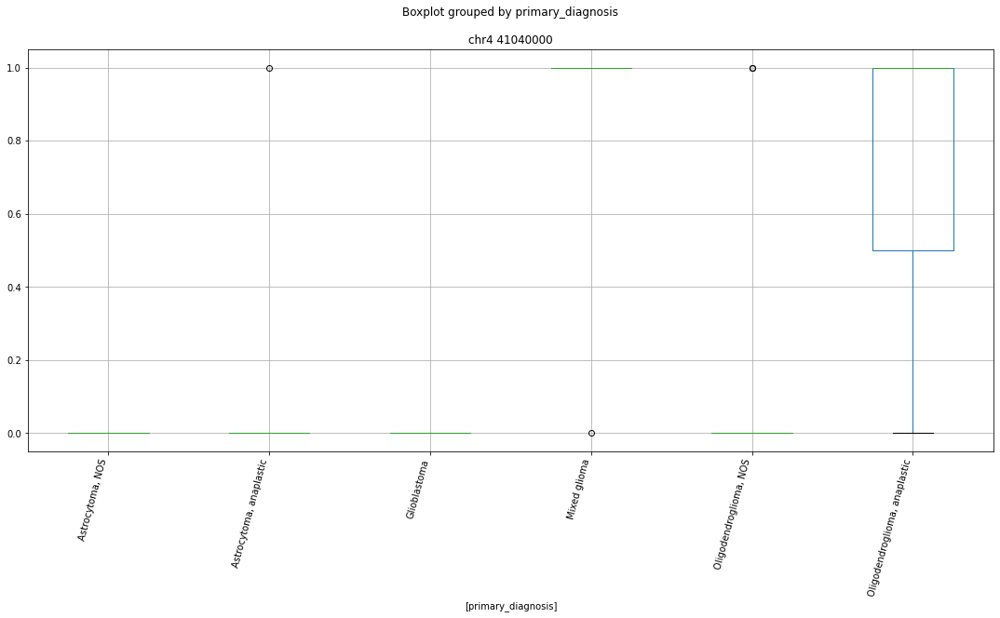

 p : 2.948014870353662e-15  ( t : 12.708265027138834 ) :  chr21 45260000


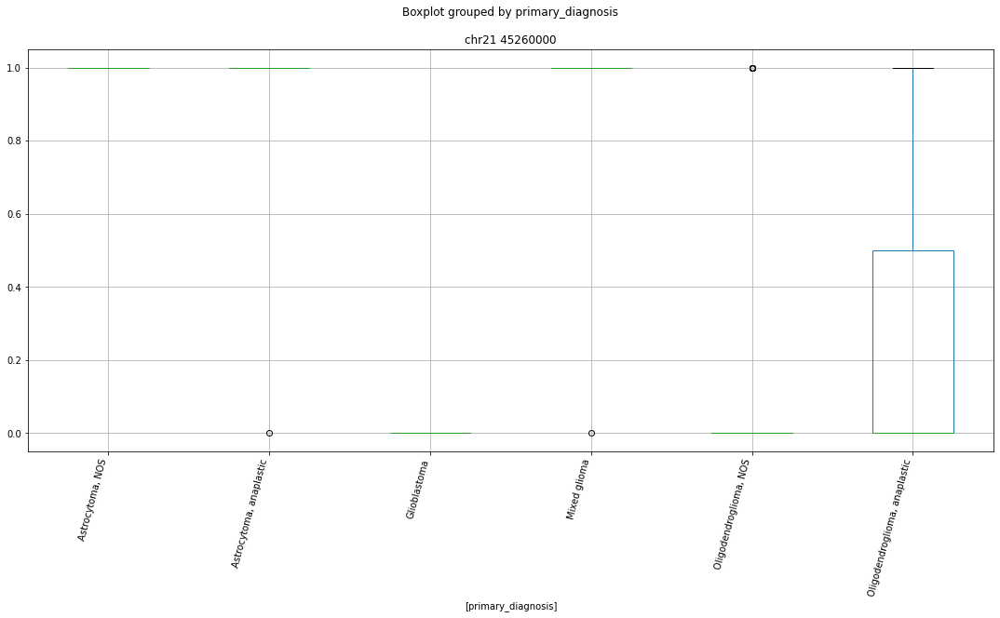

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr1 99850000


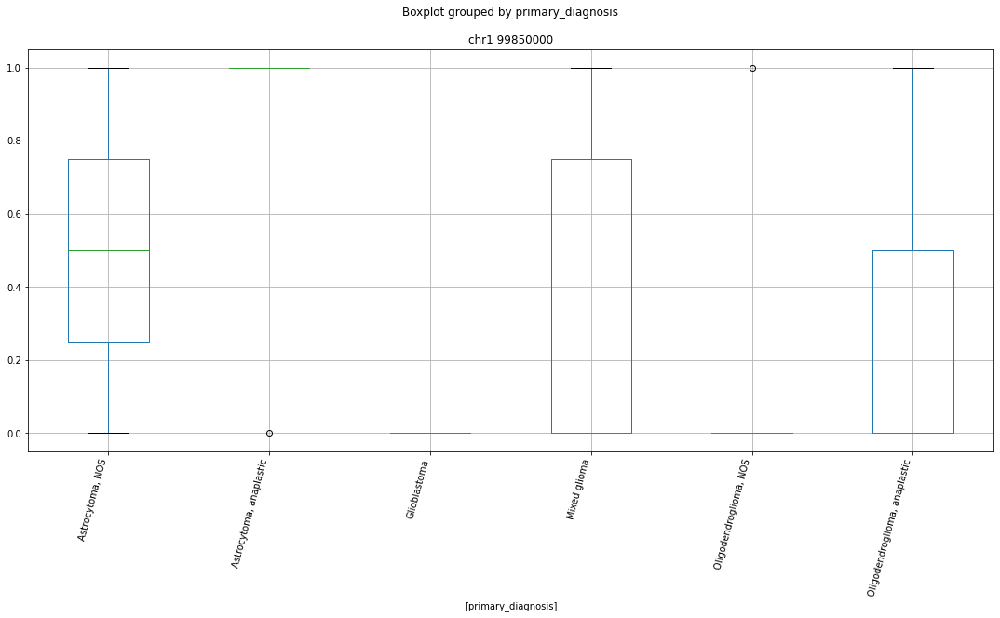

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr22 19080000


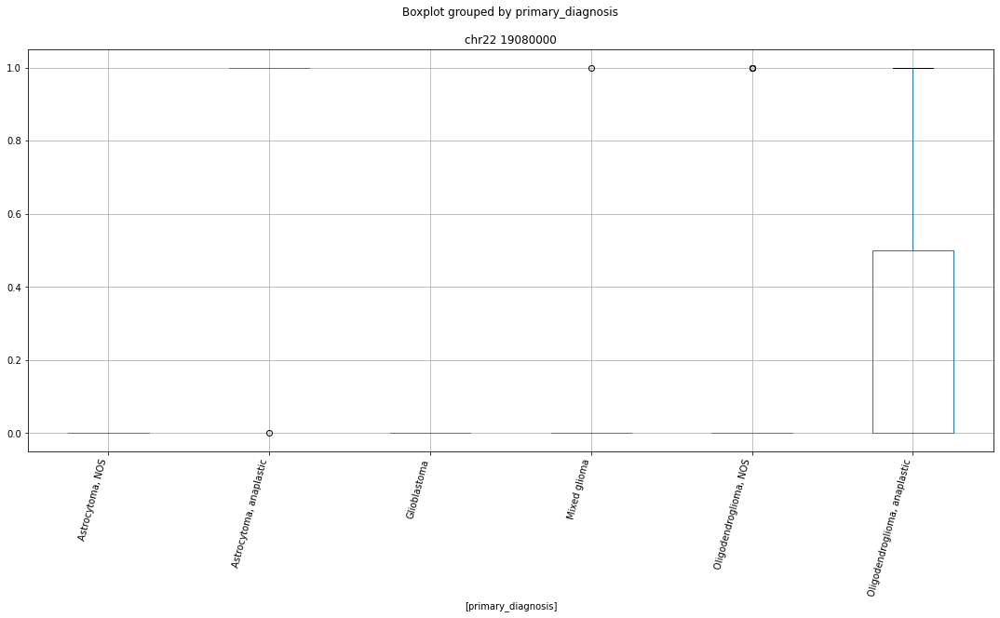

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr17 27030000


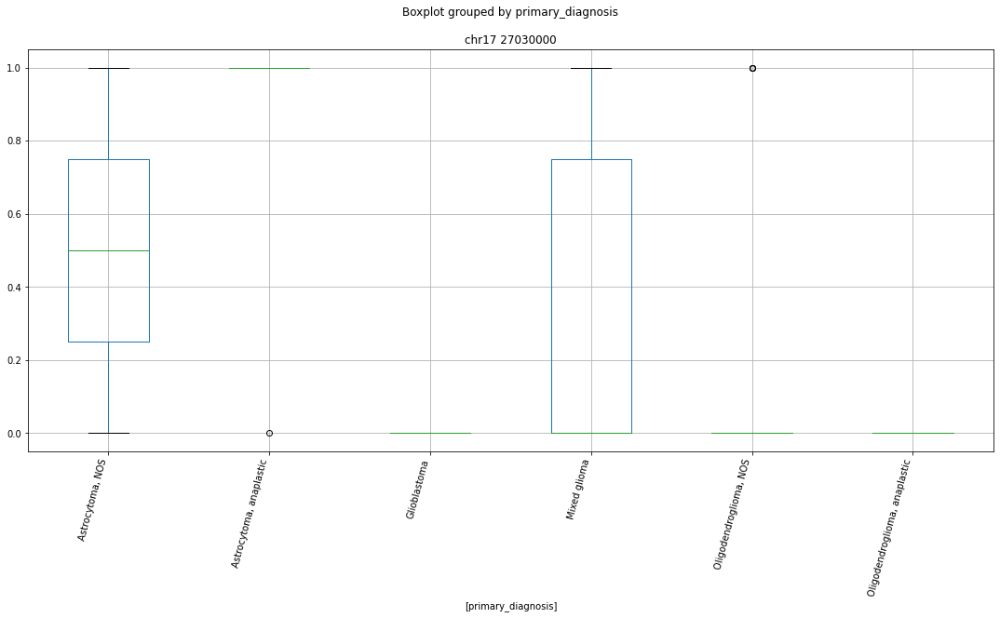

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr2 27540000


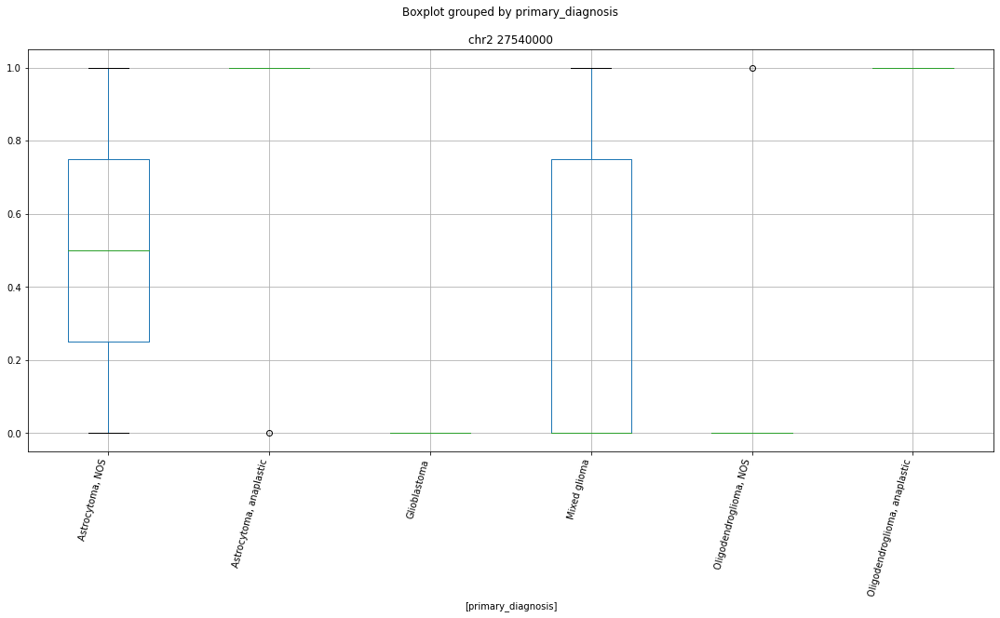

 p : 1.2735213637763784e-13  ( t : 11.358945418727963 ) :  chr2 160440000


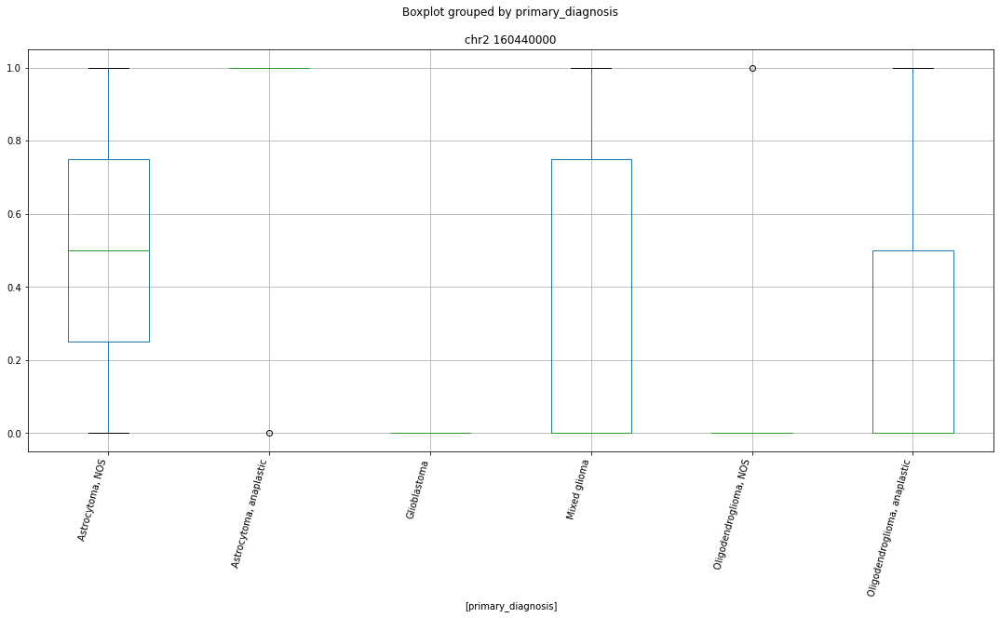

 p : 1.2735213637763784e-13  ( t : 11.358945418727963 ) :  chr16 67710000


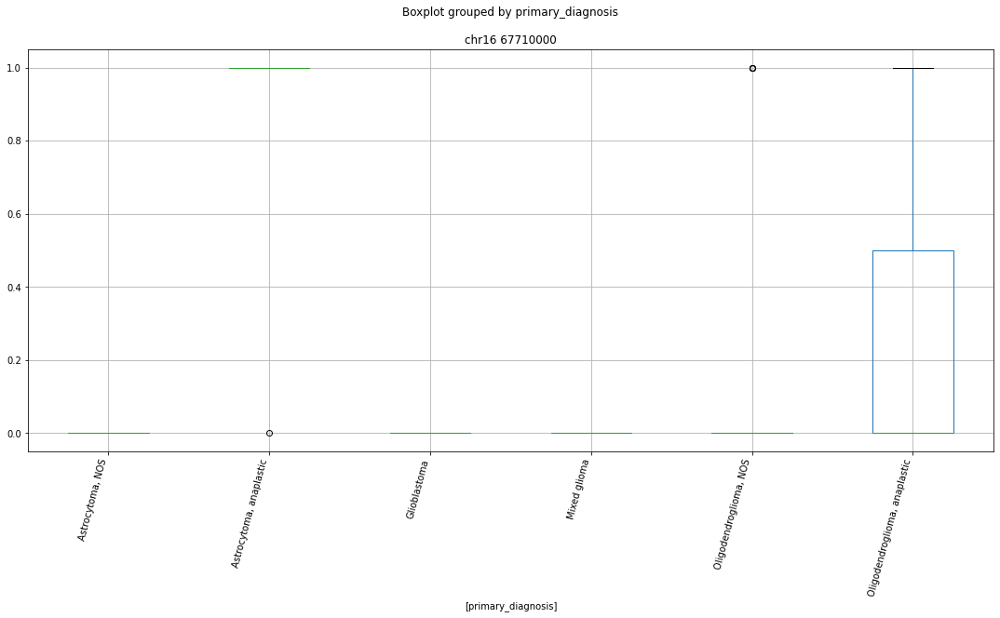

 p : 1.2735213637763784e-13  ( t : 11.358945418727963 ) :  chr21 45260000


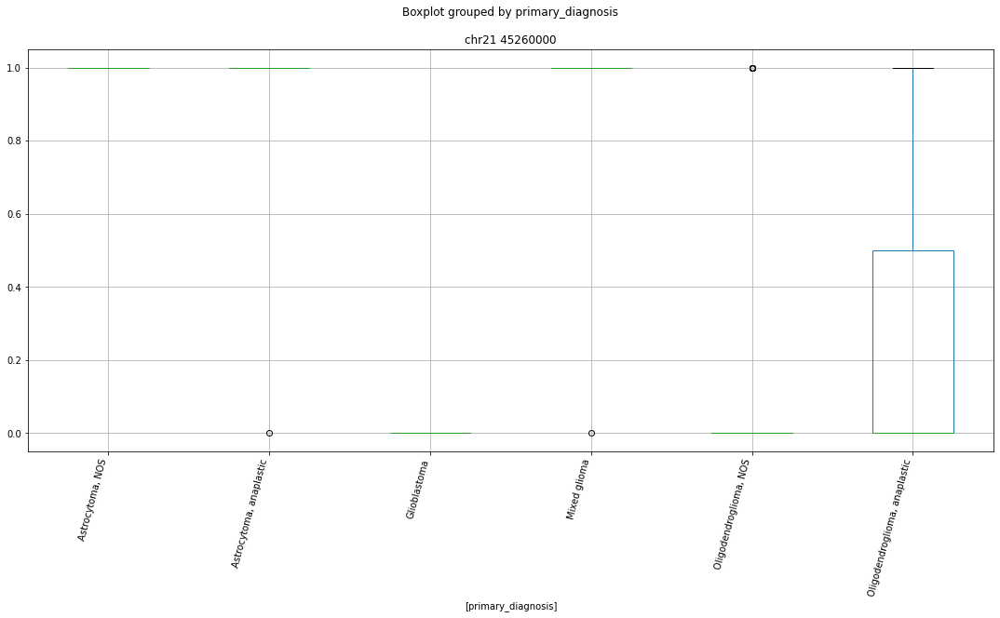

 p : 4.1989394128576286e-13  ( t : 9.441281900124896 ) :  chr17 27270000


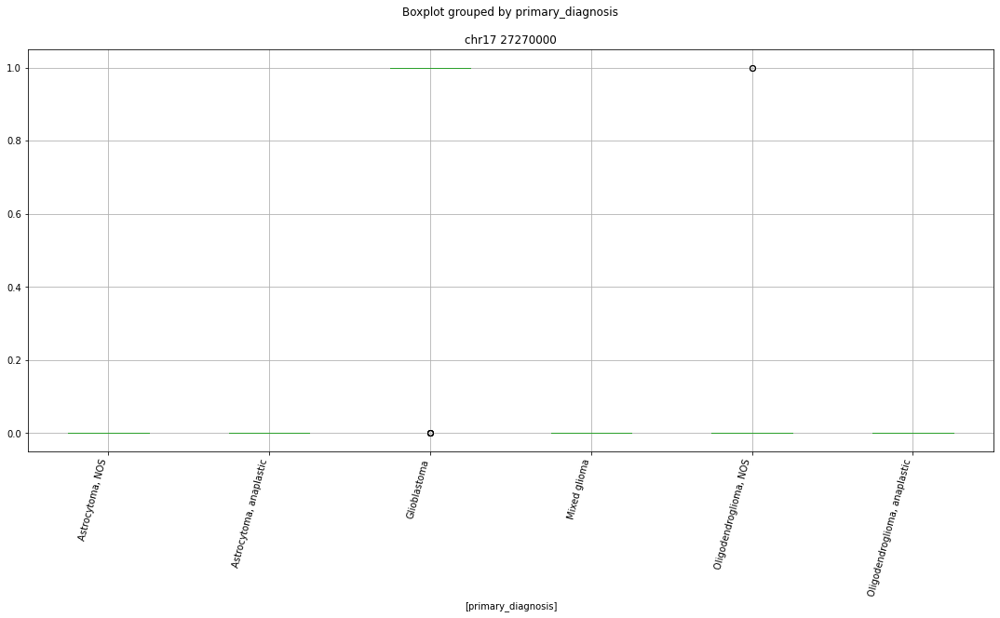

 p : 1.9864071913231304e-11  ( t : 9.677223188944682 ) :  chr11 61940000


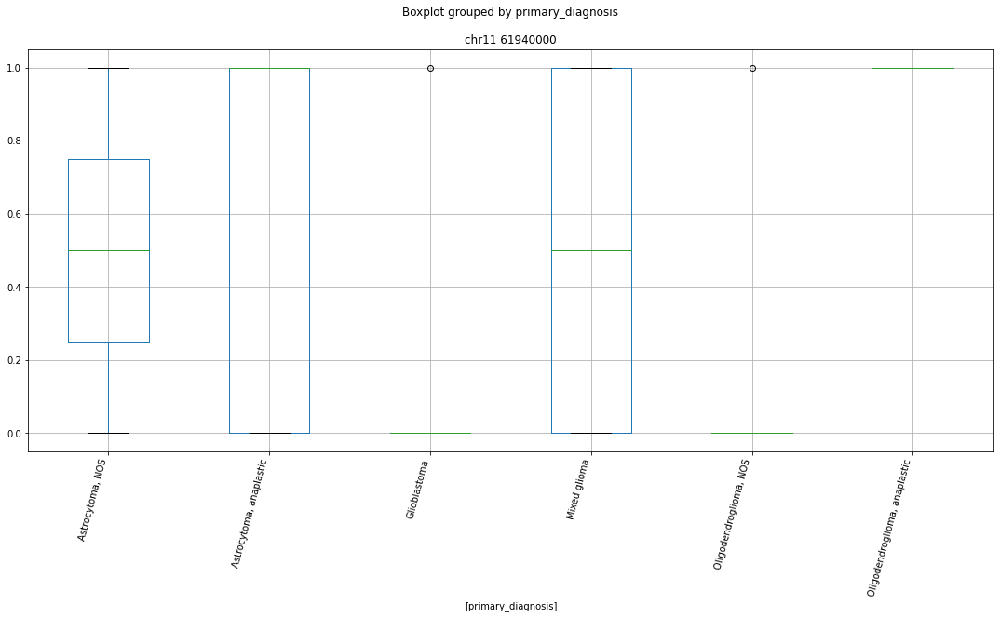

Clustermapping
['chr1 10420000' 'chr1 106410000' 'chr1 108160000' ... 'chrY 4290000'
 'primary_diagnosis' 'subject']


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


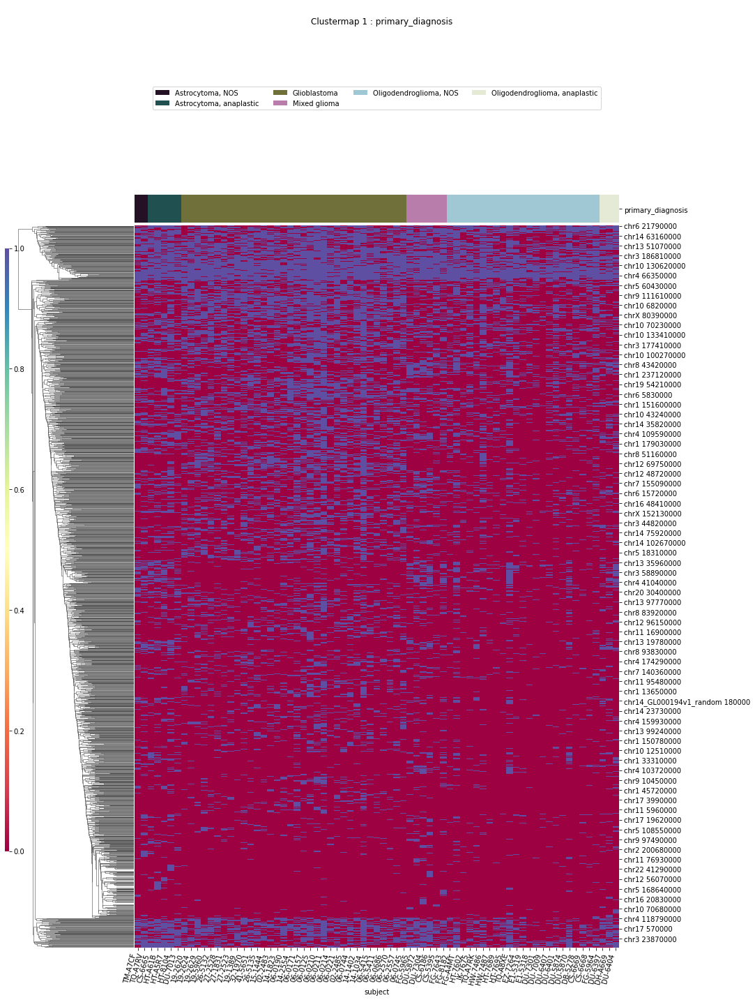

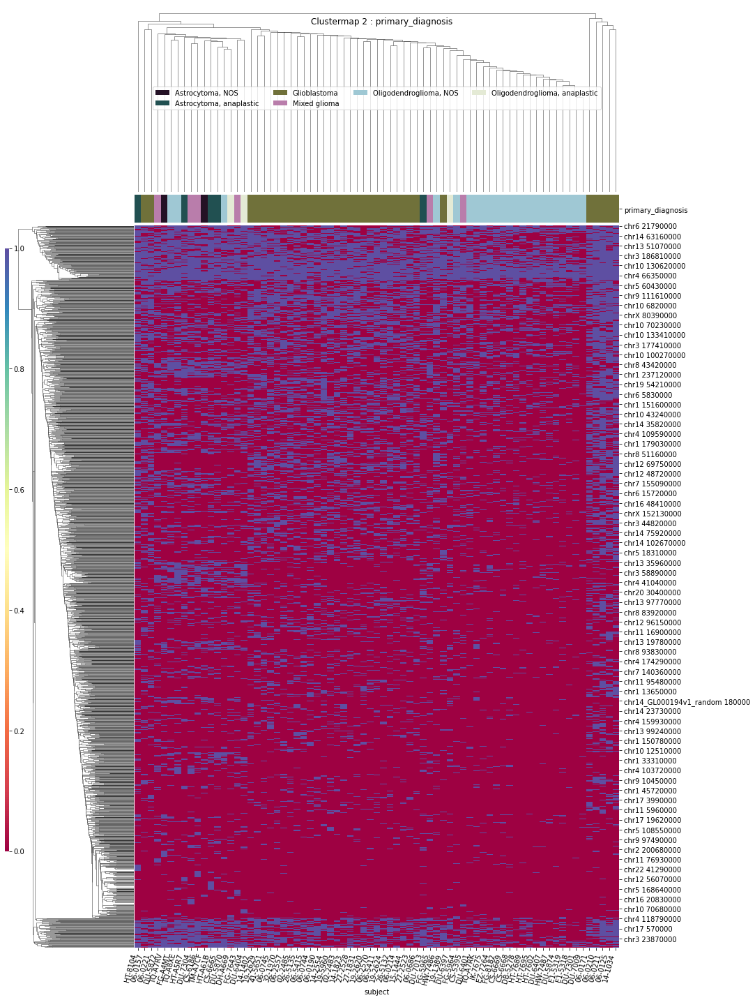

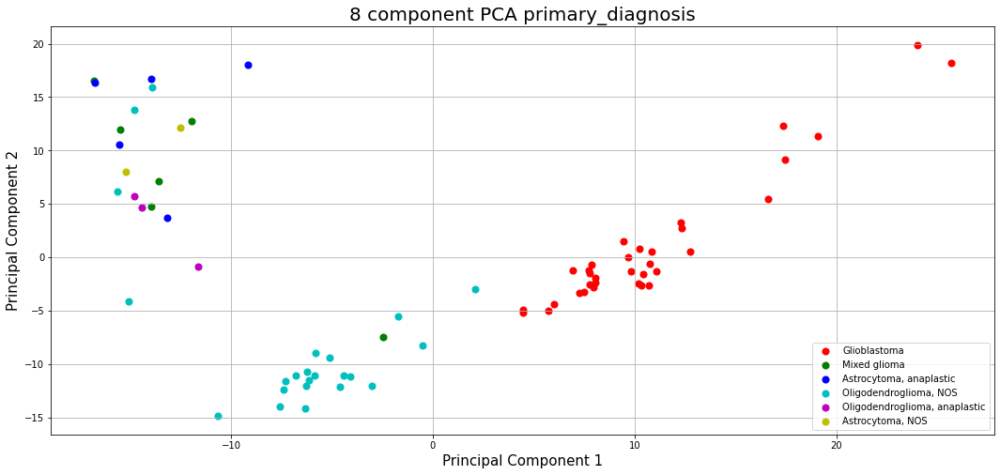

IDH
T-Testing
Boxplotting
Clustermapping
['IDH' 'chr1 109170000' 'chr1 111230000' 'chr1 111600000' 'chr1 11240000'
 'chr1 112640000' 'chr1 112720000' 'chr1 11300000' 'chr1 113060000'
 'chr1 114790000' 'chr1 13330000' 'chr1 13390000' 'chr1 145760000'
 'chr1 147230000' 'chr1 151650000' 'chr1 151760000' 'chr1 152140000'
 'chr1 153570000' 'chr1 153580000' 'chr1 160530000' 'chr1 160930000'
 'chr1 161030000' 'chr1 161420000' 'chr1 161610000' 'chr1 162450000'
 'chr1 163540000' 'chr1 167030000' 'chr1 173610000' 'chr1 179030000'
 'chr1 179040000' 'chr1 180710000' 'chr1 181950000' 'chr1 182440000'
 'chr1 192850000' 'chr1 202730000' 'chr1 212720000' 'chr1 213150000'
 'chr1 220460000' 'chr1 22150000' 'chr1 224350000' 'chr1 231120000'
 'chr1 23250000' 'chr1 235310000' 'chr1 237670000' 'chr1 247220000'
 'chr1 26800000' 'chr1 27060000' 'chr1 27280000' 'chr1 36240000'
 'chr1 39910000' 'chr1 39990000' 'chr1 50380000' 'chr1 52860000'
 'chr1 77860000' 'chr1 7950000' 'chr1 86210000' 'chr1 86900000'
 'chr1

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


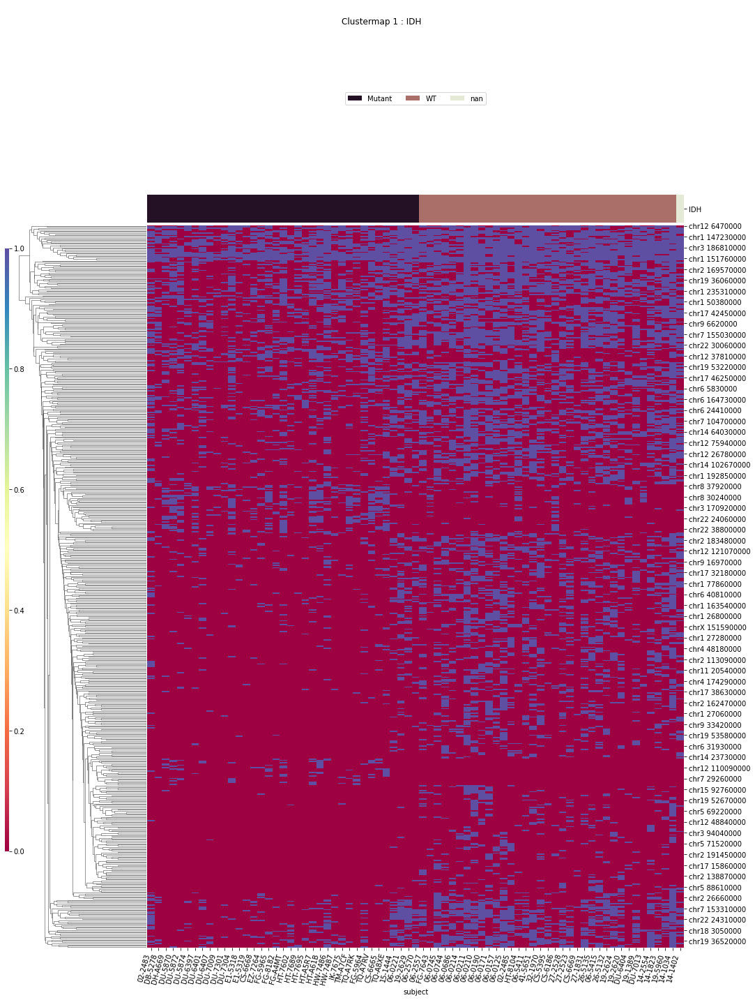

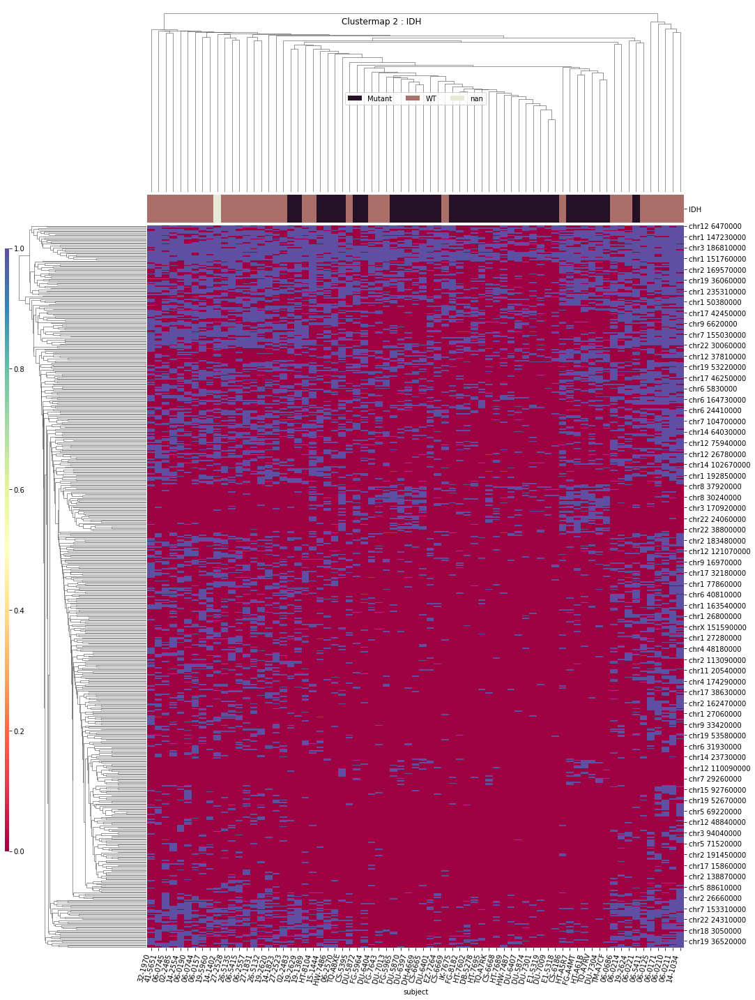

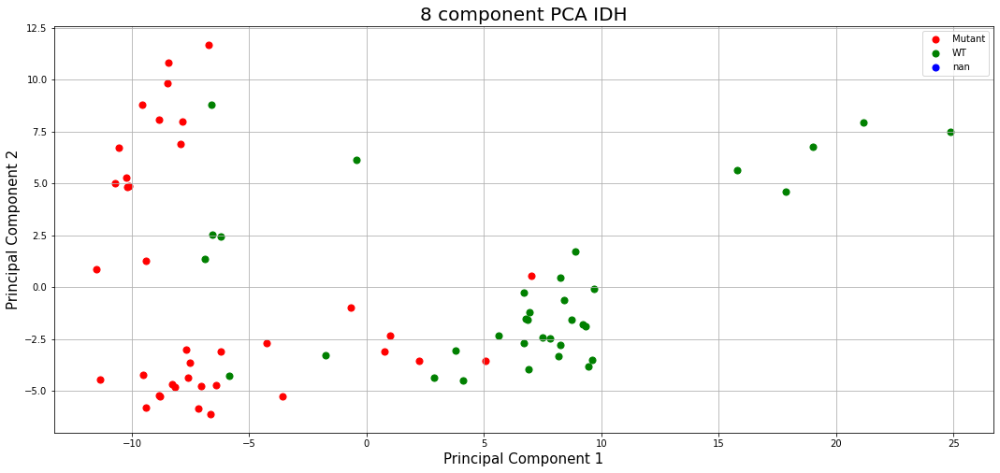

x1p19q
T-Testing
Boxplotting
Clustermapping
['chr1 10020000' 'chr1 108510000' 'chr1 11240000' 'chr1 112720000'
 'chr1 11300000' 'chr1 114790000' 'chr1 114800000' 'chr1 117300000'
 'chr1 12040000' 'chr1 12900000' 'chr1 145760000' 'chr1 151600000'
 'chr1 151650000' 'chr1 152140000' 'chr1 153570000' 'chr1 159440000'
 'chr1 160930000' 'chr1 161280000' 'chr1 161610000' 'chr1 162450000'
 'chr1 163540000' 'chr1 167030000' 'chr1 179030000' 'chr1 179040000'
 'chr1 189220000' 'chr1 202190000' 'chr1 213150000' 'chr1 219540000'
 'chr1 22150000' 'chr1 222480000' 'chr1 229930000' 'chr1 231120000'
 'chr1 232330000' 'chr1 235310000' 'chr1 237670000' 'chr1 245770000'
 'chr1 247220000' 'chr1 248670000' 'chr1 27280000' 'chr1 36240000'
 'chr1 37890000' 'chr1 43500000' 'chr1 48170000' 'chr1 50380000'
 'chr1 52180000' 'chr1 65140000' 'chr1 77860000' 'chr10 102030000'
 'chr10 119790000' 'chr10 2800000' 'chr10 34970000' 'chr10 42130000'
 'chr10 43420000' 'chr10 45510000' 'chr10 51390000' 'chr10 59740000'
 'ch

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


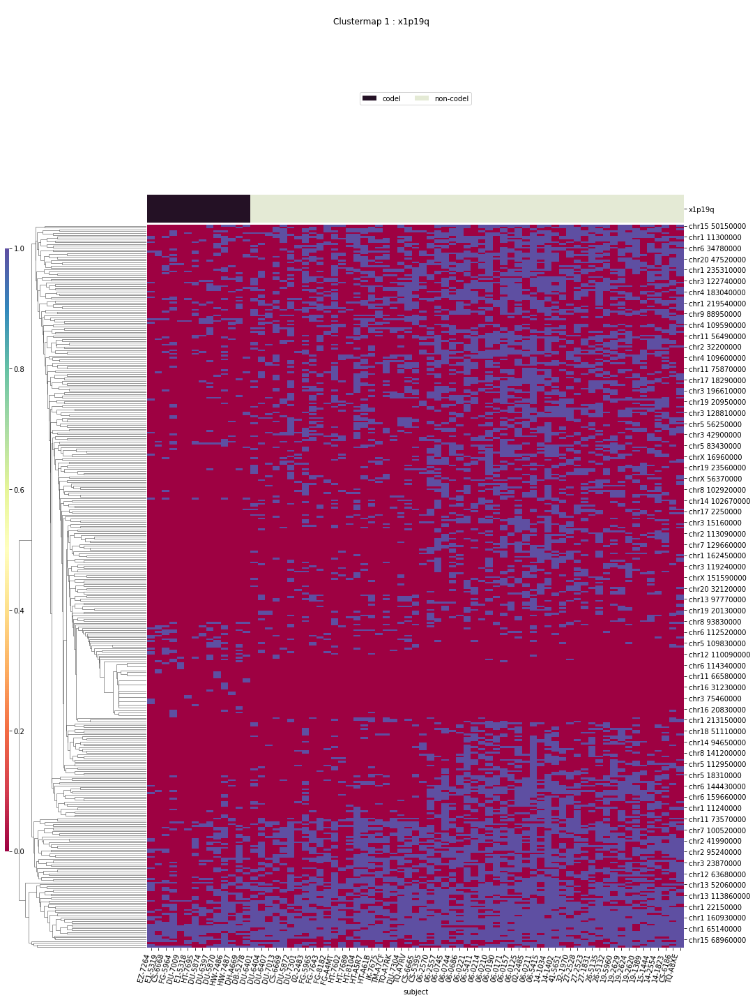

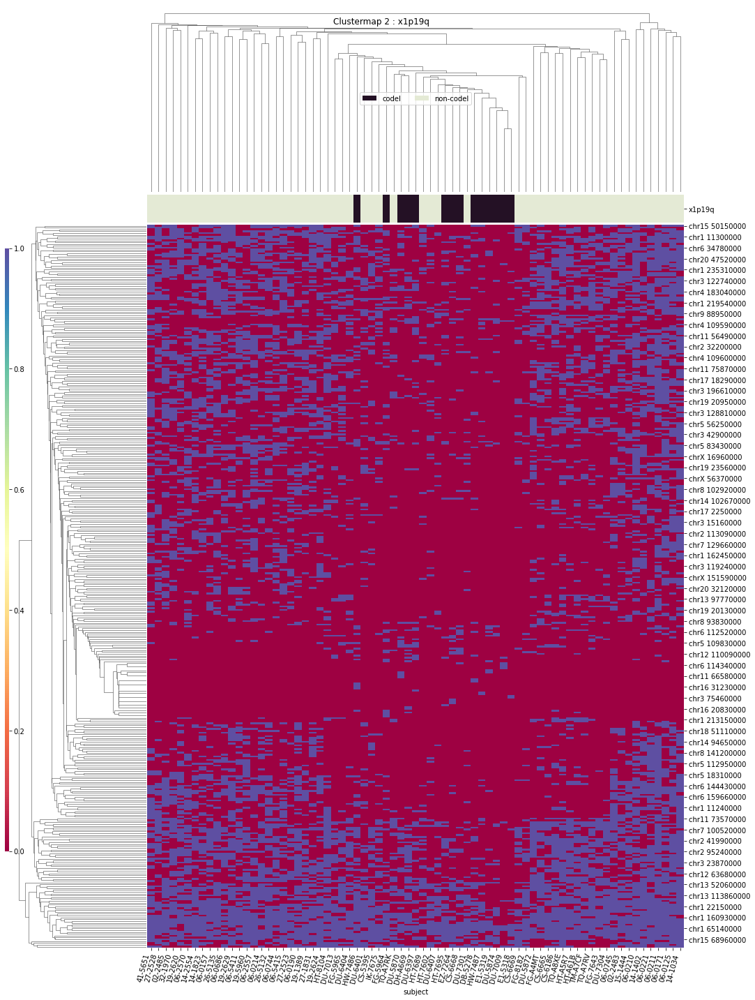

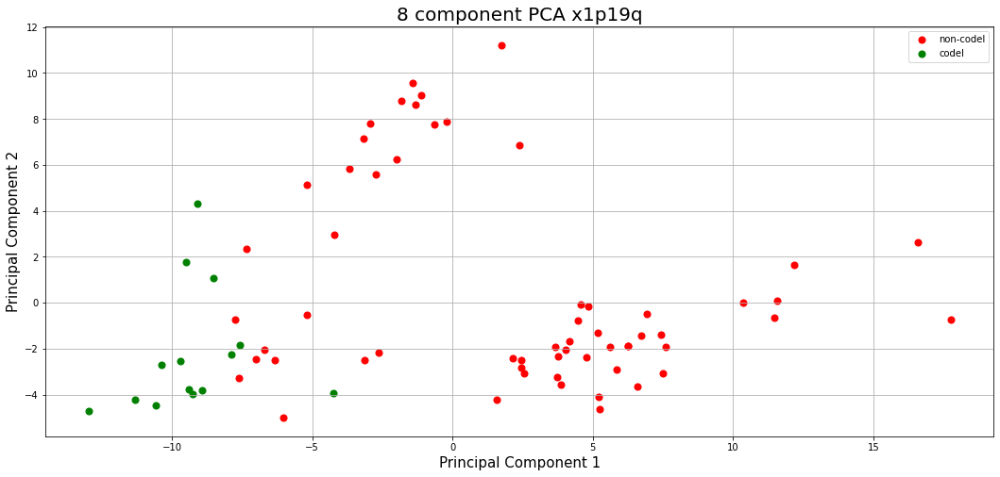

TERT
T-Testing
Boxplotting
Clustermapping
['TERT' 'chr1 108490000' 'chr1 108510000' 'chr1 108530000'
 'chr1 108670000' 'chr1 109170000' 'chr1 111230000' 'chr1 112640000'
 'chr1 112720000' 'chr1 113060000' 'chr1 152140000' 'chr1 153570000'
 'chr1 153580000' 'chr1 154280000' 'chr1 160530000' 'chr1 161420000'
 'chr1 161610000' 'chr1 162450000' 'chr1 192850000' 'chr1 197400000'
 'chr1 202730000' 'chr1 209120000' 'chr1 213150000' 'chr1 22150000'
 'chr1 222480000' 'chr1 227130000' 'chr1 237120000' 'chr1 248670000'
 'chr1 26800000' 'chr1 31170000' 'chr1 39990000' 'chr1 43500000'
 'chr1 48190000' 'chr1 52740000' 'chr1 6300000' 'chr1 77860000'
 'chr1 86210000' 'chr1 92020000' 'chr1 96460000' 'chr1 96470000'
 'chr1 99070000' 'chr1 99500000' 'chr1 99850000' 'chr10 102030000'
 'chr10 114780000' 'chr10 118790000' 'chr10 119180000' 'chr10 12220000'
 'chr10 122200000' 'chr10 12510000' 'chr10 42900000' 'chr10 43440000'
 'chr10 43460000' 'chr10 45250000' 'chr10 63810000' 'chr10 70630000'
 'chr10 718600

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


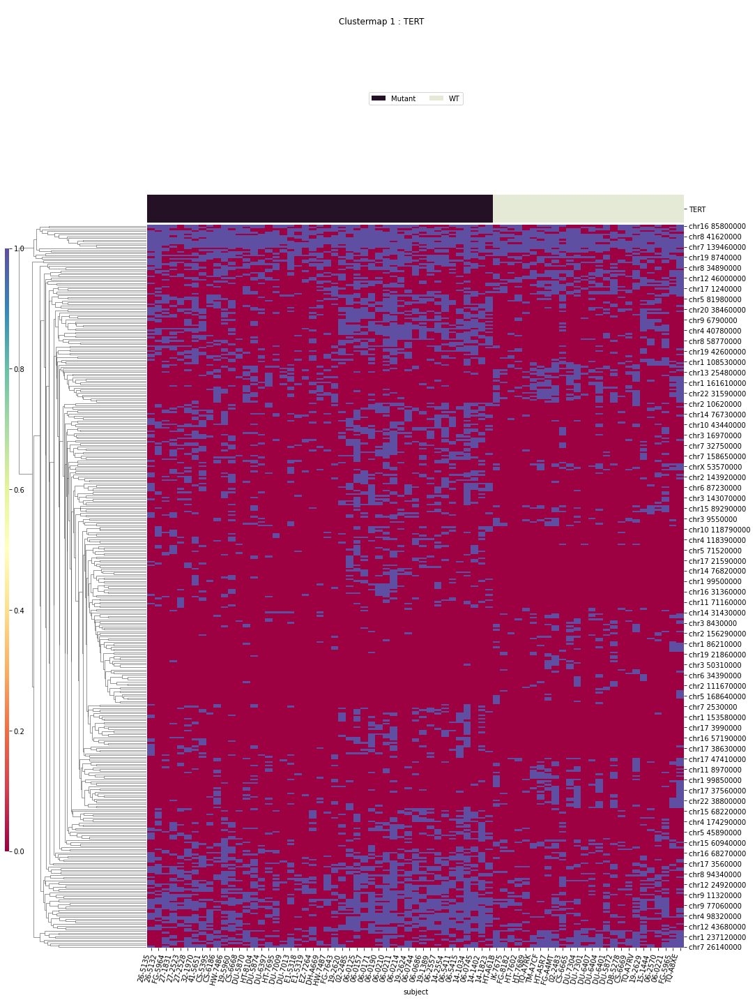

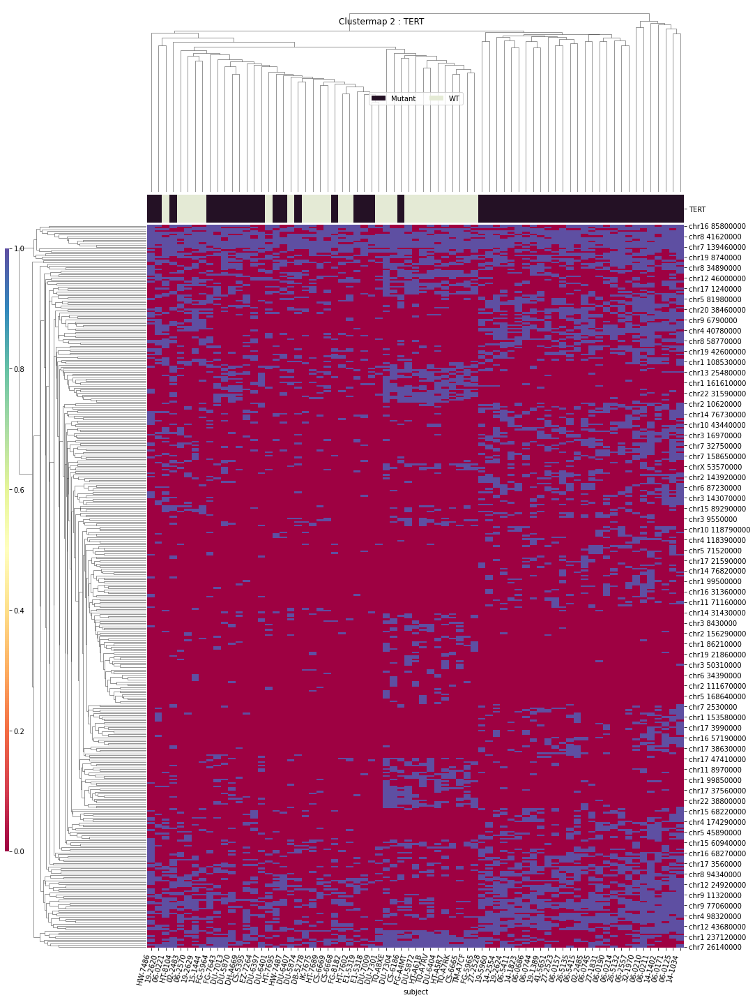

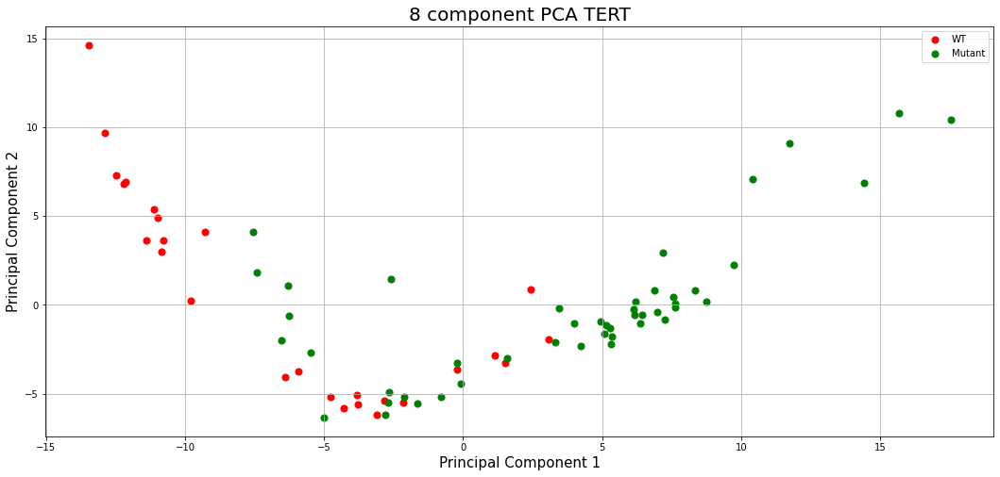

disease_type
T-Testing
Boxplotting
 p : 3.873045396608156e-20  ( t : 12.811611525258288 ) :  chr17 27270000


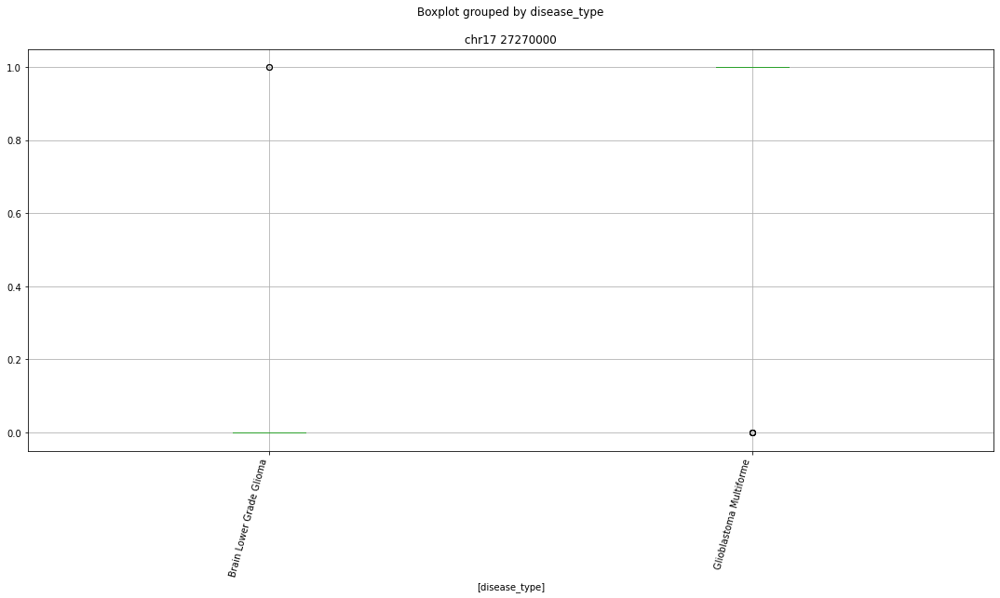

 p : 8.142958192937578e-14  ( t : 9.249267360961449 ) :  chr4 40780000


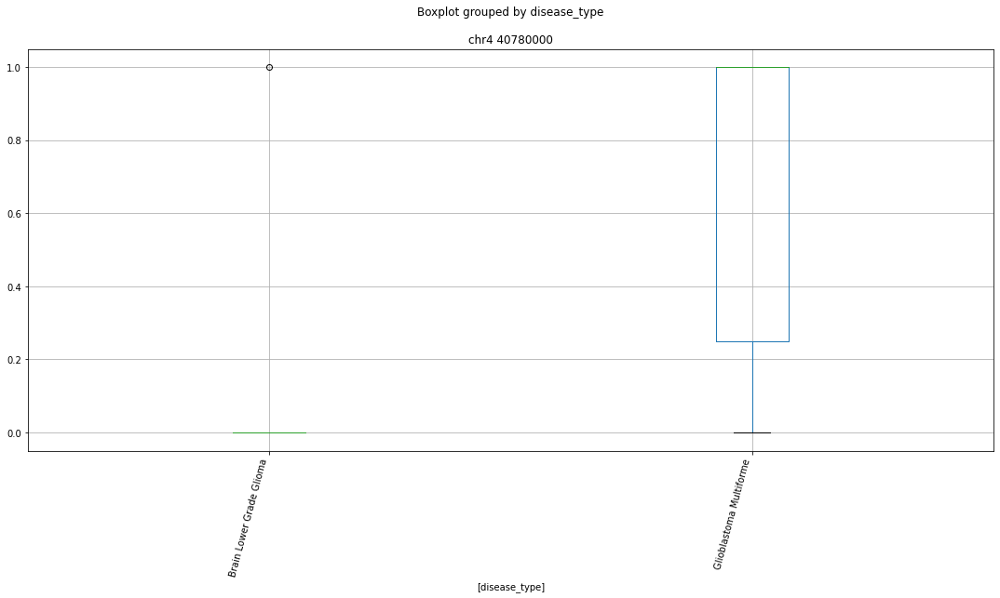

 p : 3.5067033030961863e-13  ( t : 8.905691017720823 ) :  chr9 129660000


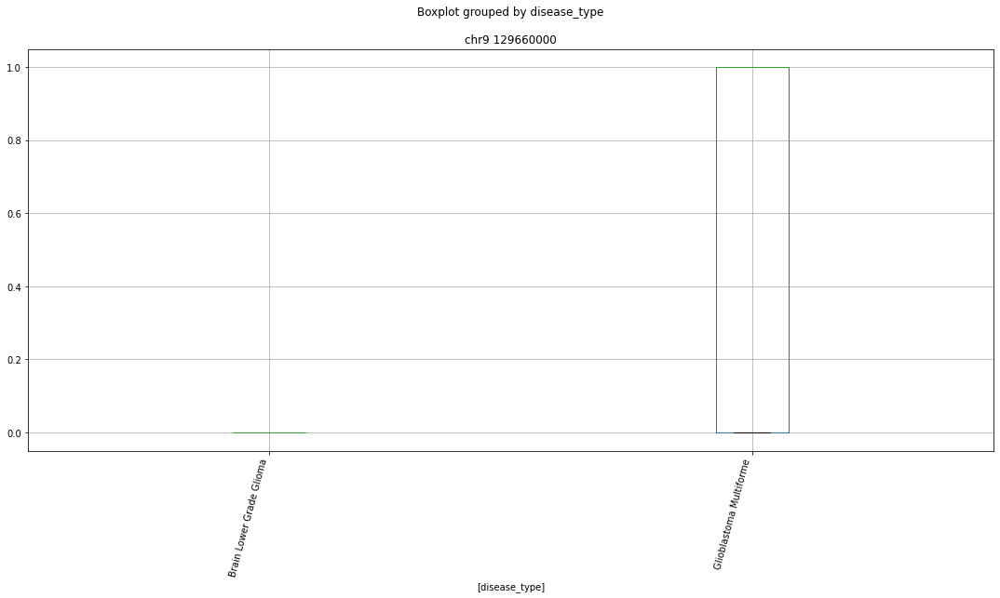

 p : 8.036008806778001e-11  ( t : 7.632015516631033 ) :  chr7 155030000


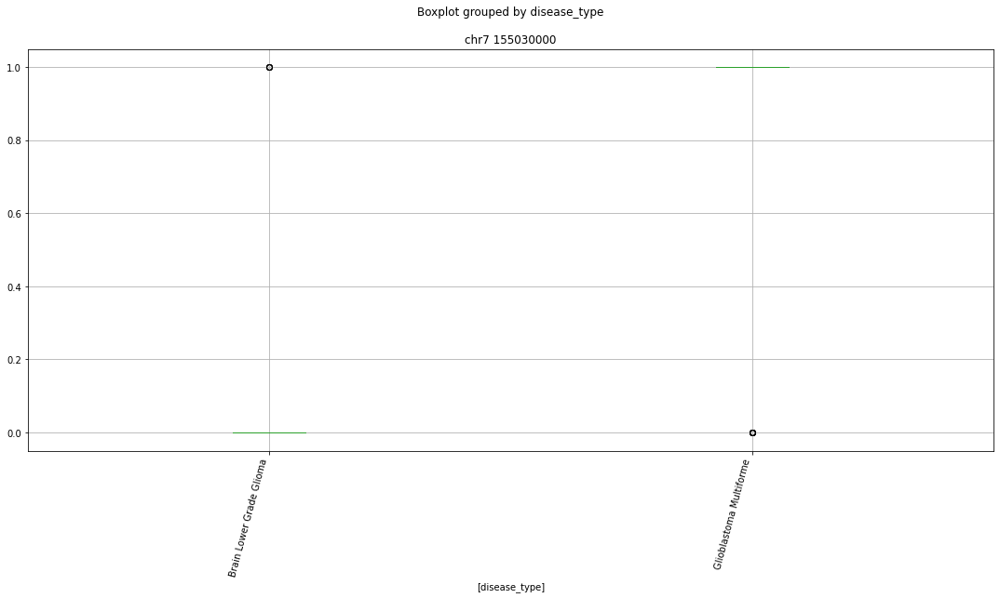

Clustermapping
['chr1 108150000' 'chr1 108490000' 'chr1 108530000' ... 'chrY 12350000'
 'disease_type' 'subject']


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


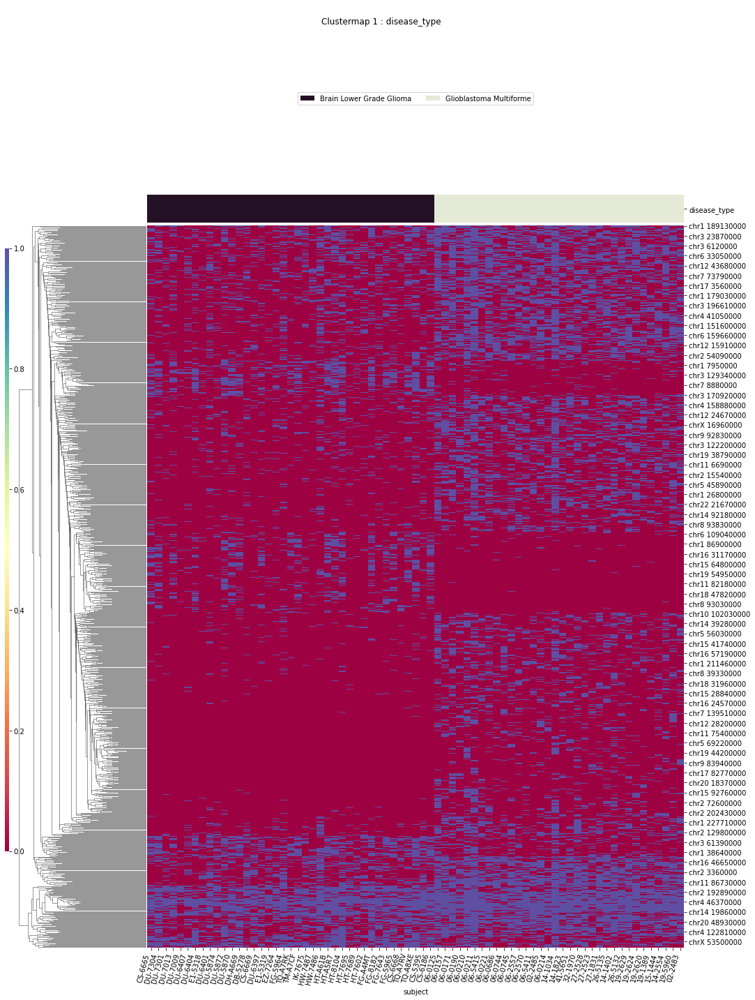

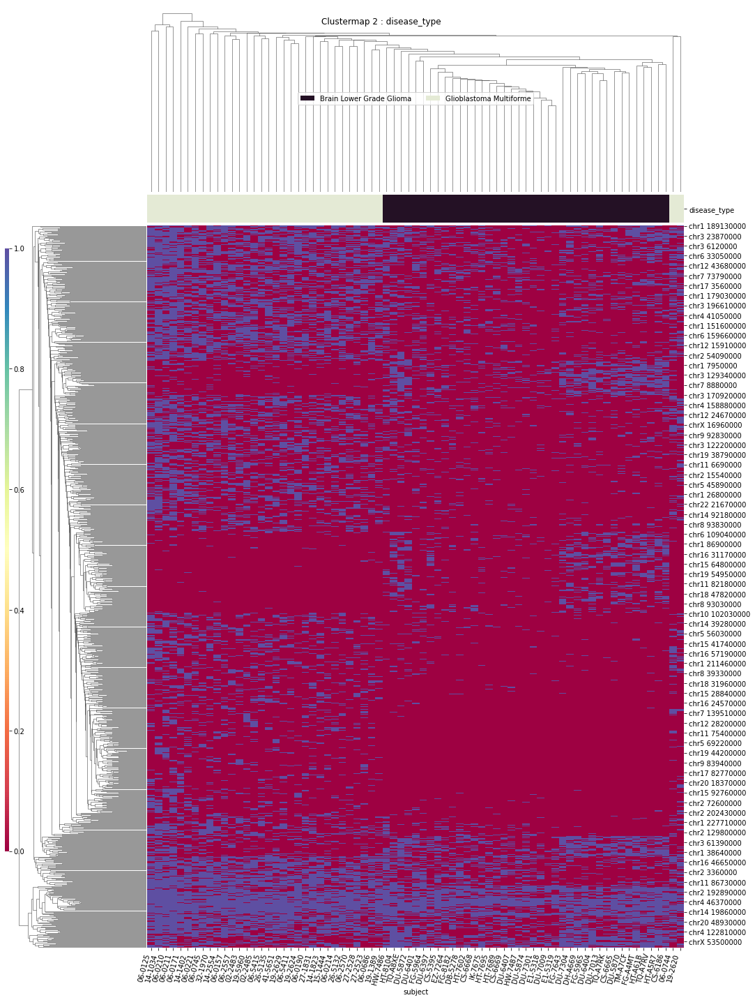

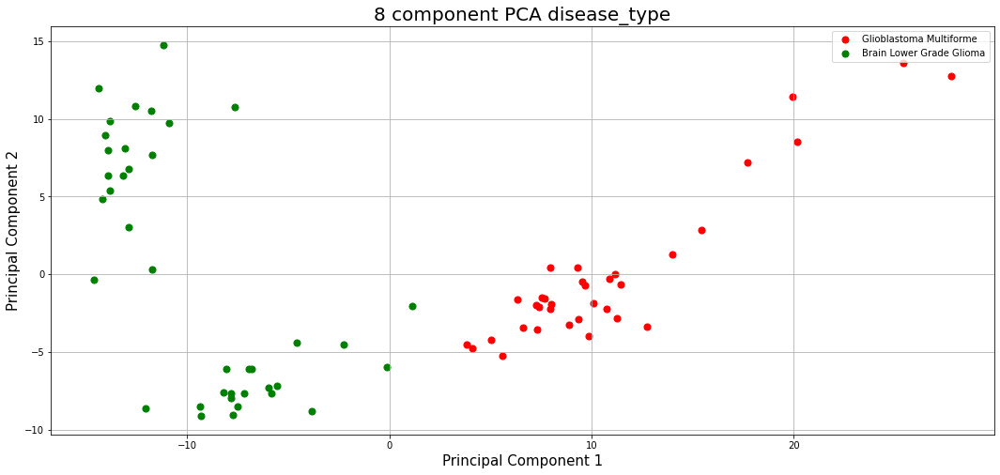

IDH_1p19q_status
T-Testing


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['IDH_1p19q_status' 'chr1 10020000' 'chr1 108510000' 'chr1 108670000'
 'chr1 109170000' 'chr1 111230000' 'chr1 11240000' 'chr1 112640000'
 'chr1 112720000' 'chr1 11300000' 'chr1 113060000' 'chr1 114790000'
 'chr1 114800000' 'chr1 117300000' 'chr1 12040000' 'chr1 12900000'
 'chr1 13390000' 'chr1 145760000' 'chr1 147230000' 'chr1 151600000'
 'chr1 151650000' 'chr1 151760000' 'chr1 152140000' 'chr1 153570000'
 'chr1 153580000' 'chr1 154280000' 'chr1 160530000' 'chr1 160930000'
 'chr1 161030000' 'chr1 161280000' 'chr1 161420000' 'chr1 161610000'
 'chr1 162450000' 'chr1 163540000' 'chr1 167030000' 'chr1 179030000'
 'chr1 179040000' 'chr1 189220000' 'chr1 192850000' 'chr1 202190000'
 'chr1 202730000' 'chr1 203840000' 'chr1 213150000' 'chr1 21380000'
 'chr1 219540000' 'chr1 220460000' 'chr1 22150000' 'chr1 222480000'
 'chr1 224350000' 'chr1 227130000' 'chr1 229930000' 'chr1 231120000'
 'chr1 235310000' 'chr1 237120000' 'chr1 237670000' 'chr1 245770000'
 'chr1 247220

 'chrX 75400000' 'chrX 77280000' 'chrX 87460000' 'chrY 12870000' 'subject']


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


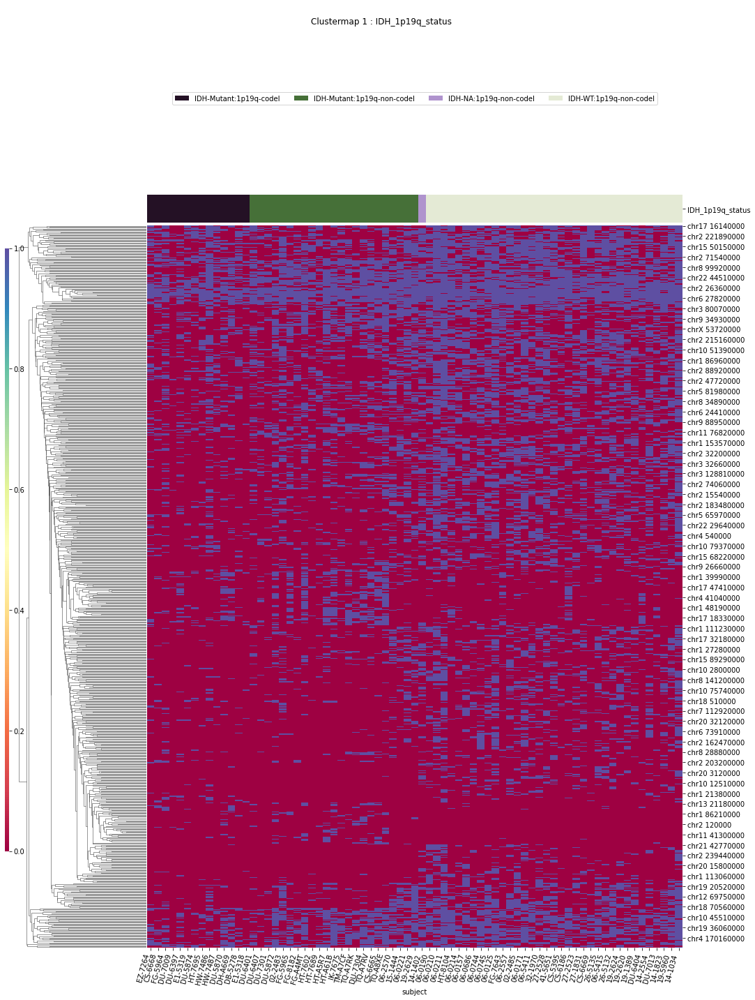

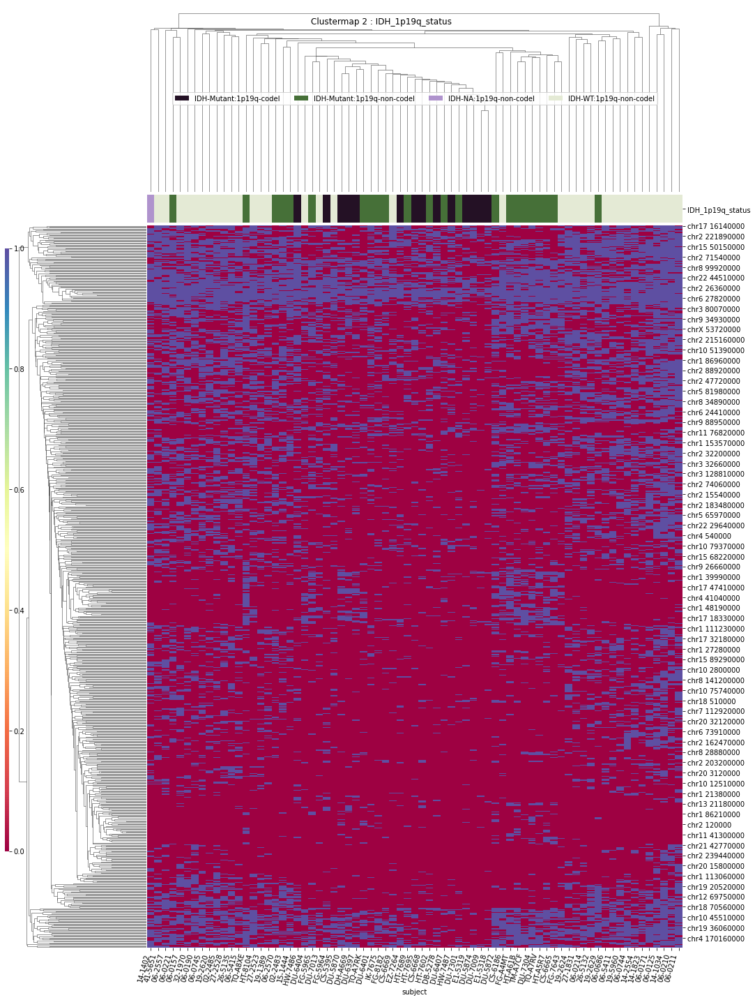

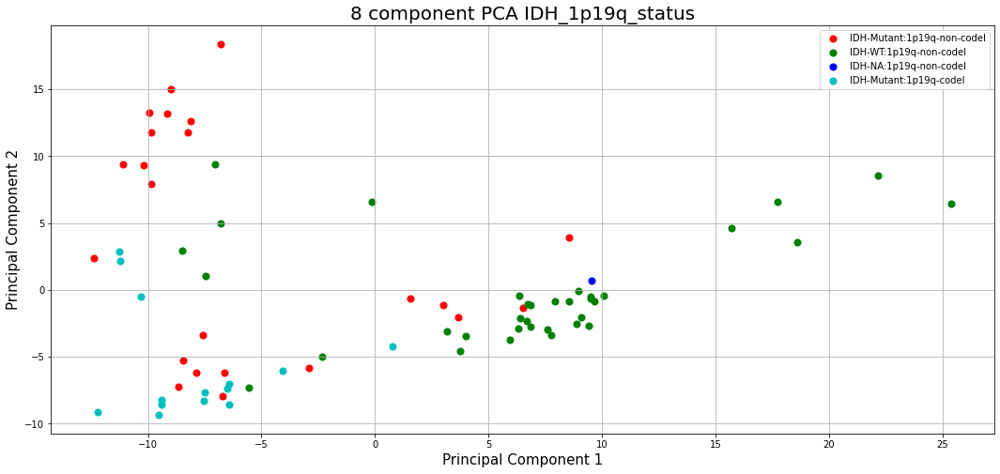

WHO_groups
T-Testing
Boxplotting
 p : 6.278055973426837e-16  ( t : 14.282856857085699 ) :  chr20 30840000


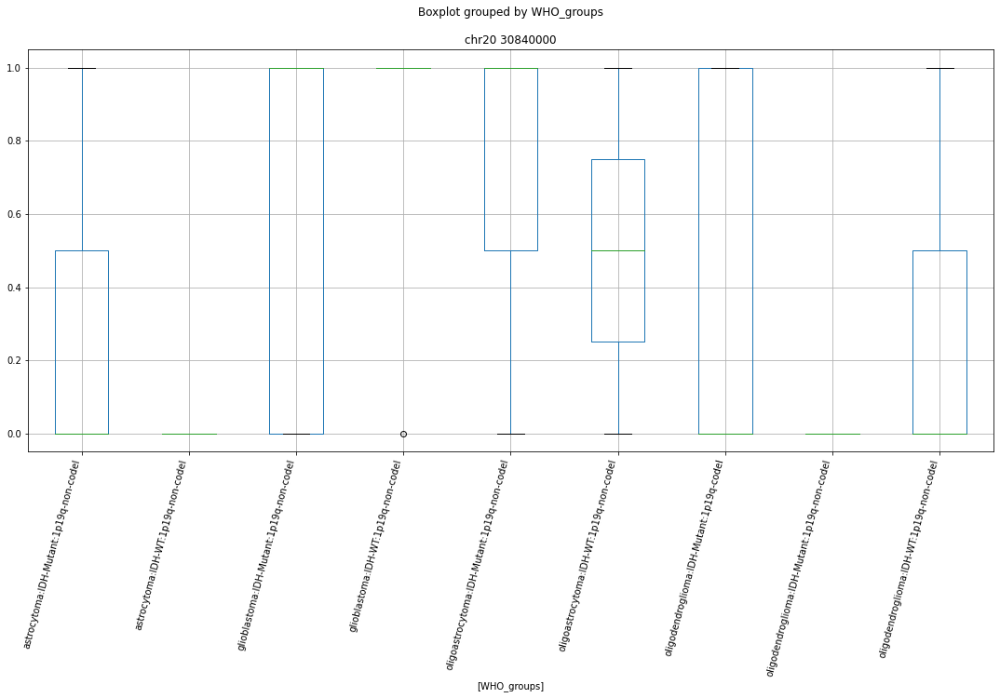

Clustermapping
['WHO_groups' 'chr1 10020000' 'chr1 10420000' ... 'chrY 12350000'
 'chrY 12870000' 'subject']


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


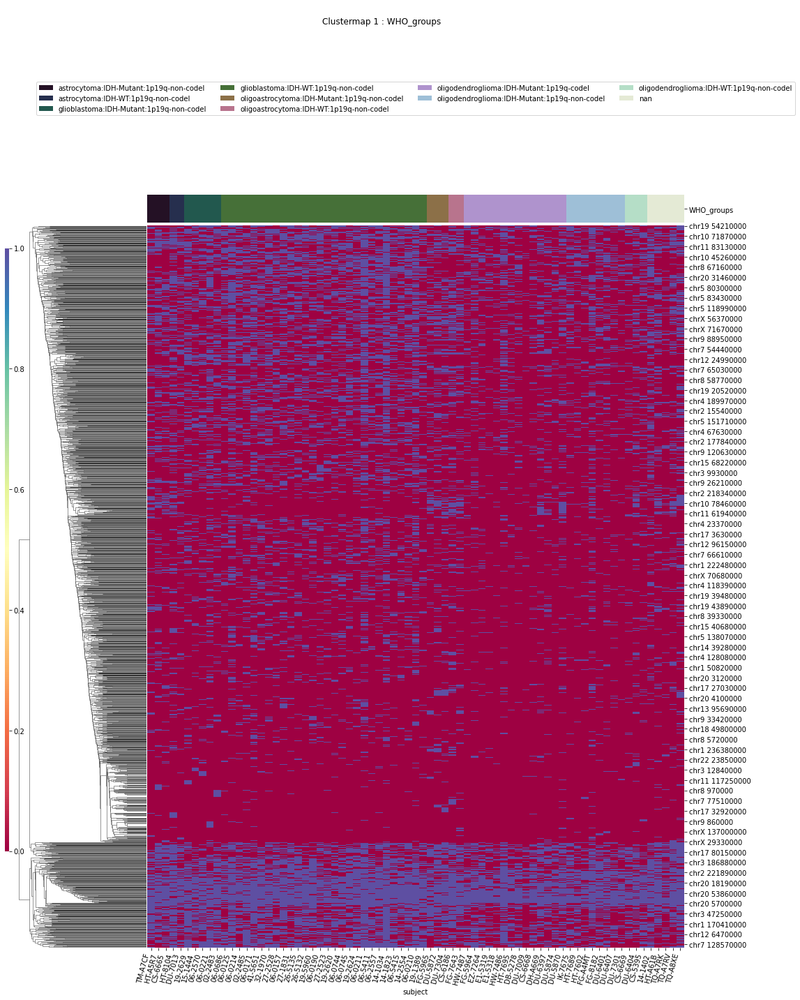

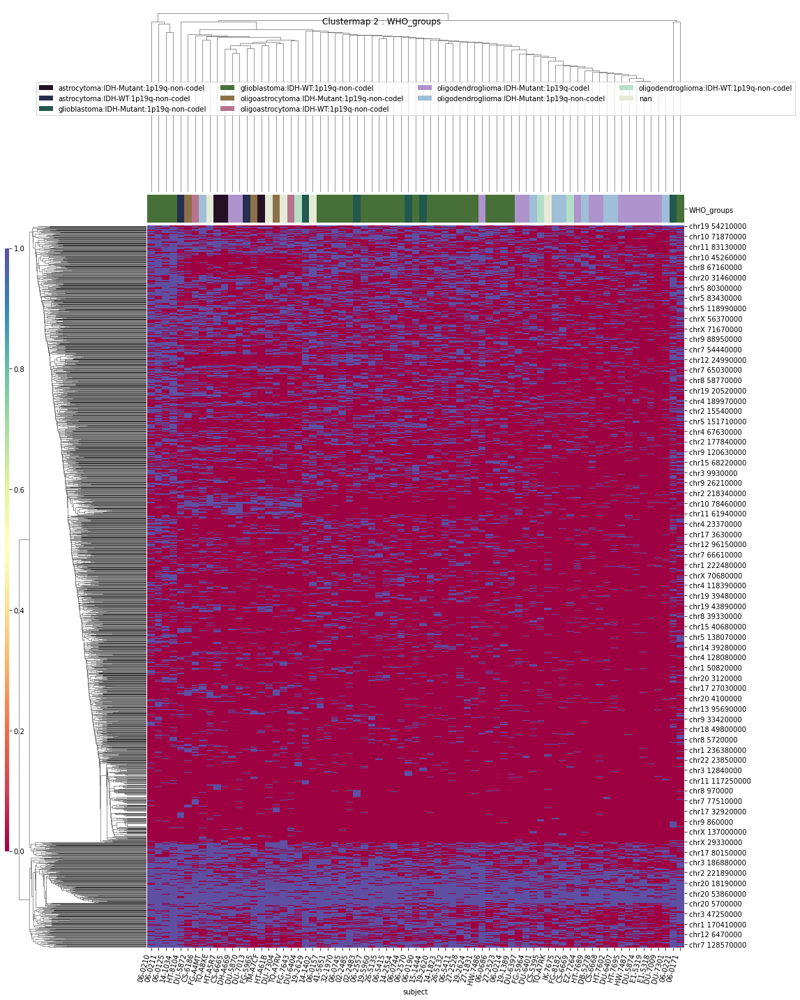

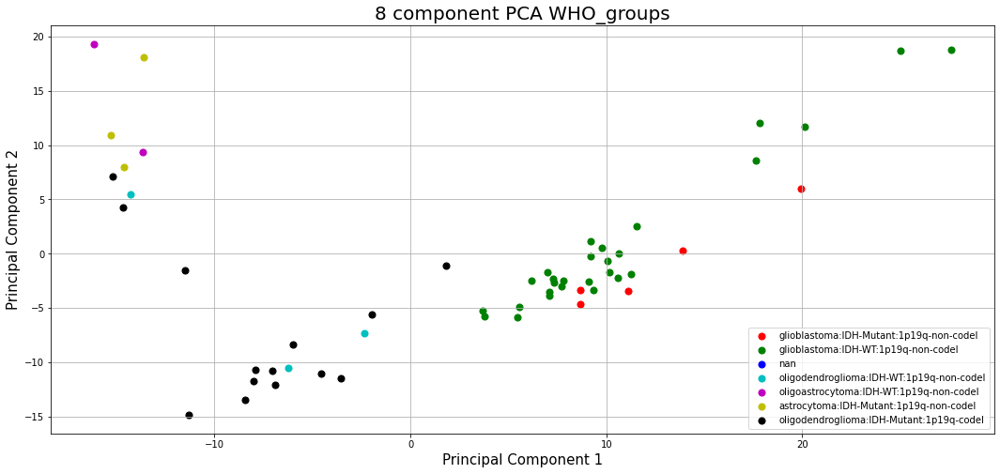

Triple_group
T-Testing


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['Triple_group' 'chr1 10020000' 'chr1 108490000' 'chr1 108510000'
 'chr1 108530000' 'chr1 108670000' 'chr1 109170000' 'chr1 111230000'
 'chr1 111520000' 'chr1 11240000' 'chr1 112640000' 'chr1 112720000'
 'chr1 11300000' 'chr1 113060000' 'chr1 114050000' 'chr1 114790000'
 'chr1 114800000' 'chr1 117300000' 'chr1 12000000' 'chr1 12040000'
 'chr1 12900000' 'chr1 13390000' 'chr1 145760000' 'chr1 147230000'
 'chr1 15130000' 'chr1 151650000' 'chr1 151760000' 'chr1 152140000'
 'chr1 152190000' 'chr1 153570000' 'chr1 153580000' 'chr1 154280000'
 'chr1 160530000' 'chr1 160930000' 'chr1 161030000' 'chr1 161280000'
 'chr1 161420000' 'chr1 161610000' 'chr1 162450000' 'chr1 163540000'
 'chr1 167030000' 'chr1 170410000' 'chr1 179030000' 'chr1 179040000'
 'chr1 189130000' 'chr1 189220000' 'chr1 192850000' 'chr1 202190000'
 'chr1 202730000' 'chr1 203840000' 'chr1 209120000' 'chr1 213150000'
 'chr1 21380000' 'chr1 217520000' 'chr1 219540000' 'chr1 220460000'
 'chr1 22150000' '

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


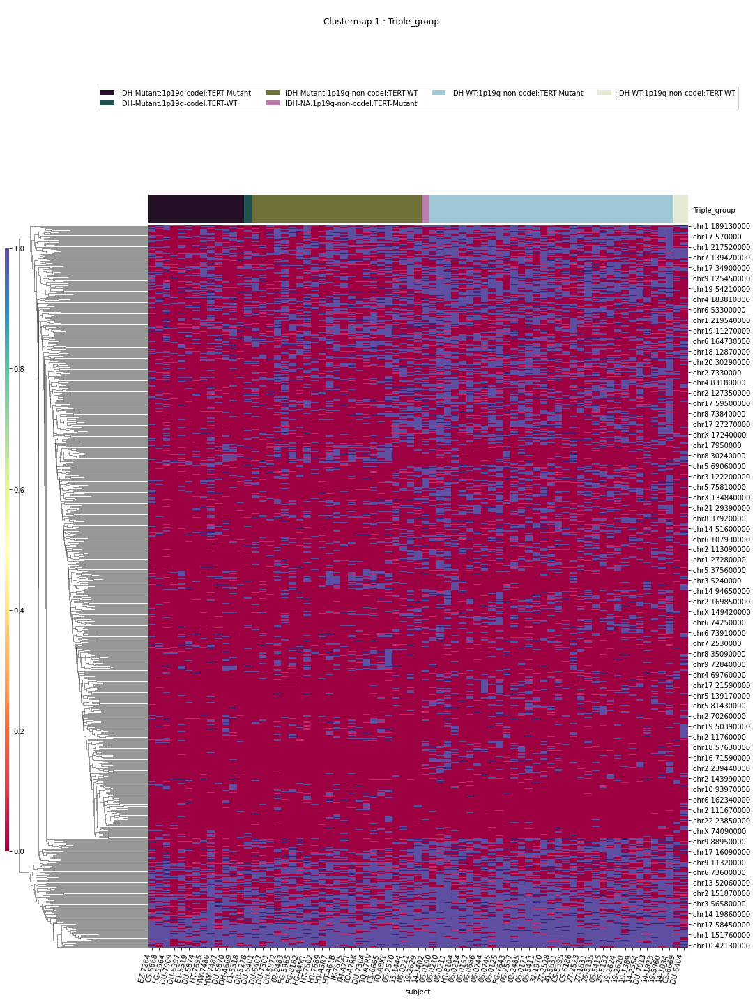

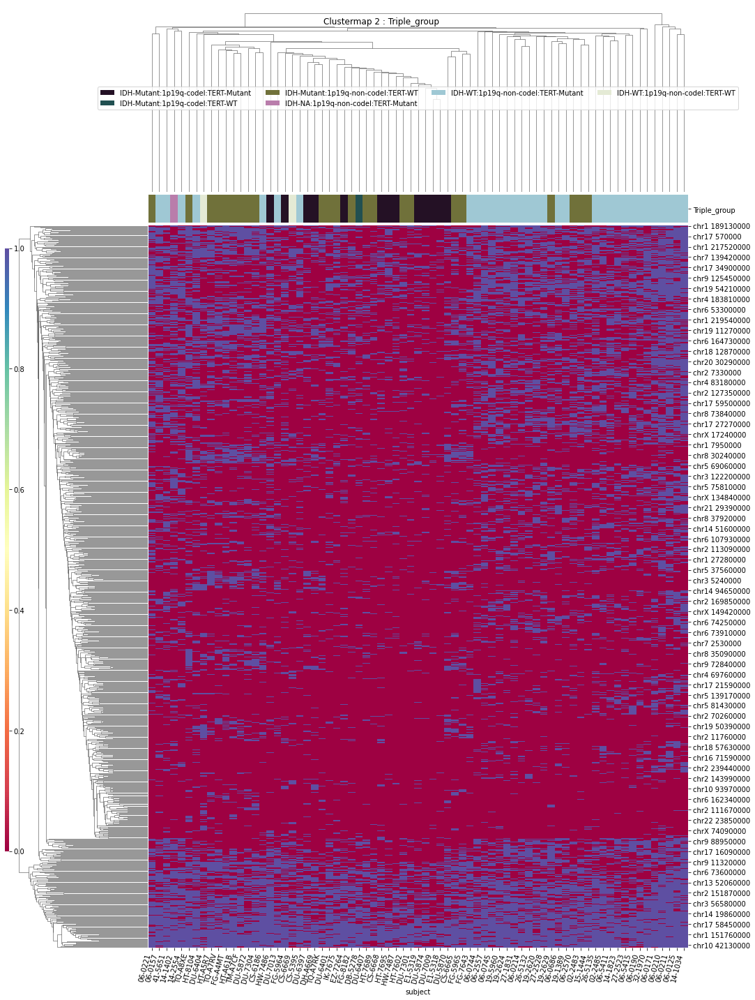

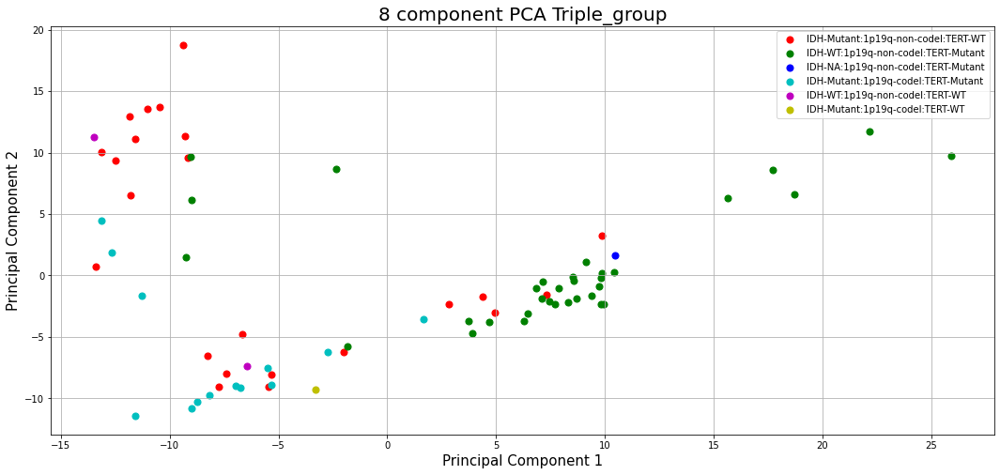

MGMT
T-Testing
Boxplotting
Clustermapping
['MGMT' 'chr1 11300000' 'chr1 113060000' 'chr1 114790000' 'chr1 13390000'
 'chr1 145760000' 'chr1 151760000' 'chr1 152140000' 'chr1 161280000'
 'chr1 173610000' 'chr1 179030000' 'chr1 182440000' 'chr1 182740000'
 'chr1 189220000' 'chr1 192850000' 'chr1 202730000' 'chr1 224350000'
 'chr1 231120000' 'chr1 27280000' 'chr1 39910000' 'chr1 45720000'
 'chr1 50820000' 'chr1 96460000' 'chr10 100090000' 'chr10 12510000'
 'chr10 2800000' 'chr10 43440000' 'chr10 45260000' 'chr10 45390000'
 'chr10 65050000' 'chr10 67690000' 'chr10 69990000' 'chr10 75740000'
 'chr10 99890000' 'chr11 106310000' 'chr11 124700000' 'chr11 56140000'
 'chr11 60510000' 'chr11 65760000' 'chr11 6690000' 'chr11 68860000'
 'chr11 73890000' 'chr11 75400000' 'chr11 89860000' 'chr12 100290000'
 'chr12 110170000' 'chr12 122350000' 'chr12 124100000' 'chr12 12560000'
 'chr12 15910000' 'chr12 28200000' 'chr12 40350000' 'chr12 4680000'
 'chr12 56780000' 'chr13 23970000' 'chr13 87560000' 'chr1

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


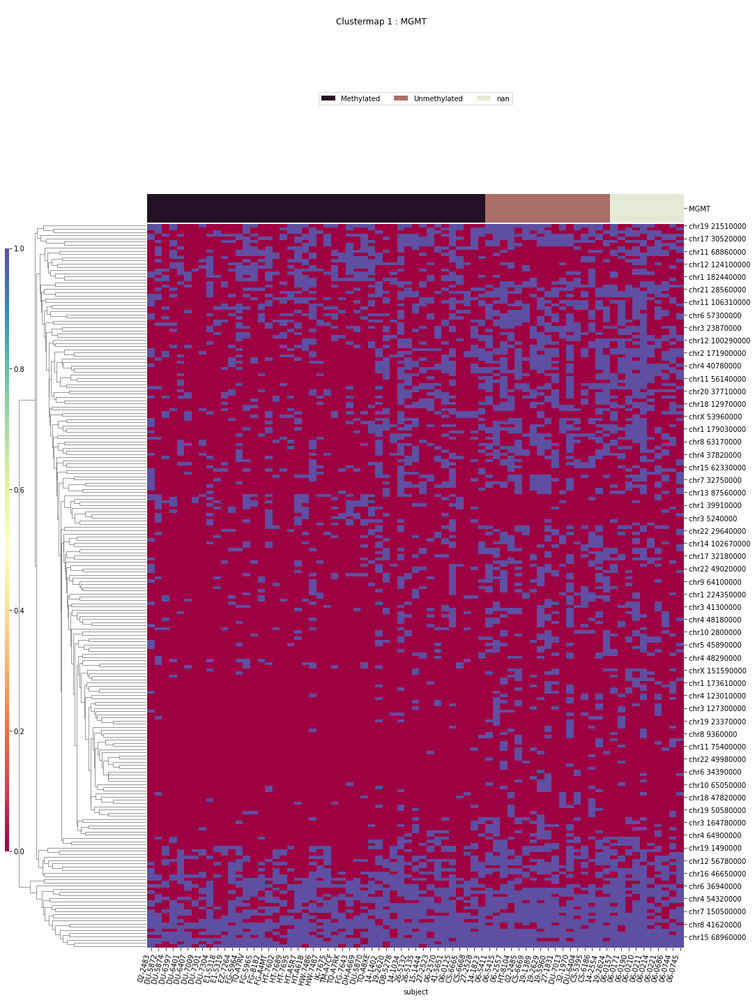

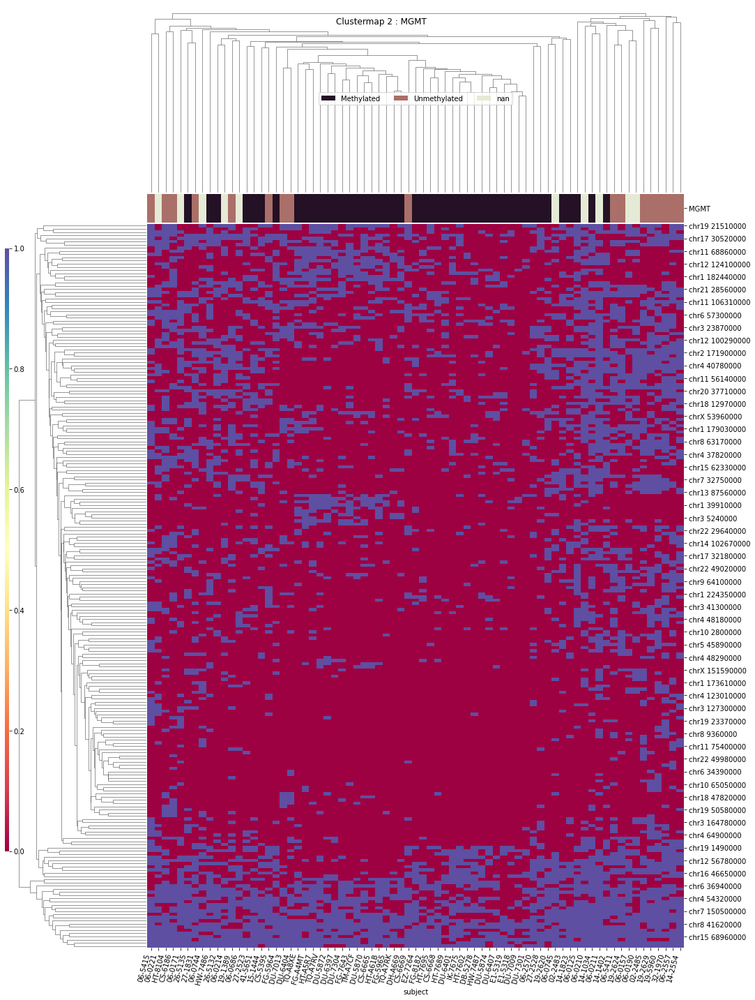

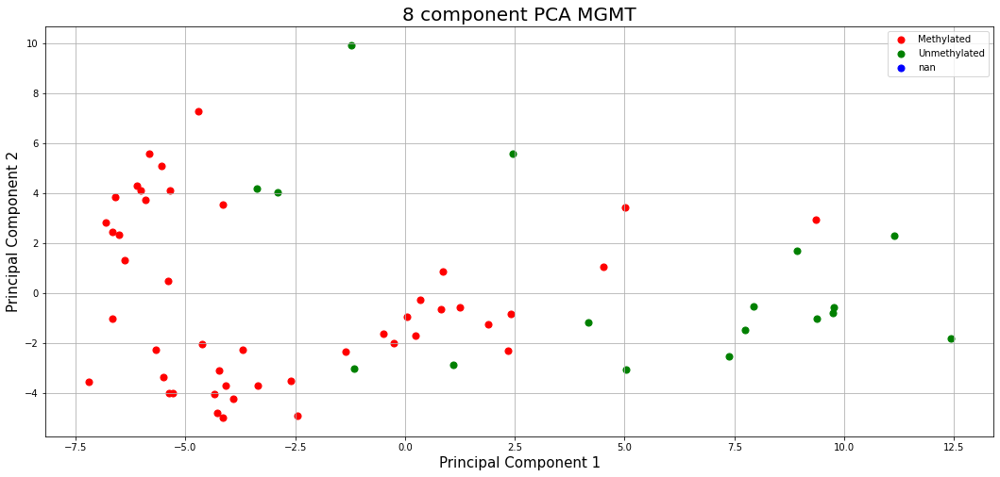

In [110]:
for column in ['primary_diagnosis','IDH','x1p19q','TERT','disease_type',
               'IDH_1p19q_status','WHO_groups','Triple_group','MGMT']:
    print(column)
    ttests_boxplots_and_heatmaps(compdf[compdf['hkle']==hkle],
        compdf.columns[compdf.columns.str.contains("^chr")],column,box_p=1e-10,heat_p=0.1)
    

In [111]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210601 18:01:25'

primary_diagnosis
T-Testing
Boxplotting
Clustermapping
['chr1 108160000' 'chr1 108490000' 'chr1 108670000' 'chr1 109070000'
 'chr1 111230000' 'chr1 111520000' 'chr1 11240000' 'chr1 112720000'
 'chr1 11300000' 'chr1 113060000' 'chr1 114790000' 'chr1 12000000'
 'chr1 12900000' 'chr1 147060000' 'chr1 150780000' 'chr1 150850000'
 'chr1 151650000' 'chr1 152140000' 'chr1 152190000' 'chr1 152250000'
 'chr1 153570000' 'chr1 159440000' 'chr1 160930000' 'chr1 161610000'
 'chr1 167030000' 'chr1 168200000' 'chr1 179030000' 'chr1 179040000'
 'chr1 179410000' 'chr1 182740000' 'chr1 202190000' 'chr1 202730000'
 'chr1 203260000' 'chr1 20810000' 'chr1 208650000' 'chr1 209120000'
 'chr1 21020000' 'chr1 211460000' 'chr1 212320000' 'chr1 213150000'
 'chr1 22150000' 'chr1 227130000' 'chr1 231120000' 'chr1 236380000'
 'chr1 237670000' 'chr1 247210000' 'chr1 24790000' 'chr1 27060000'
 'chr1 27280000' 'chr1 33310000' 'chr1 33510000' 'chr1 36240000'
 'chr1 37070000' 'chr1 37890000' 'chr1 38640000' 'chr1 399100

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


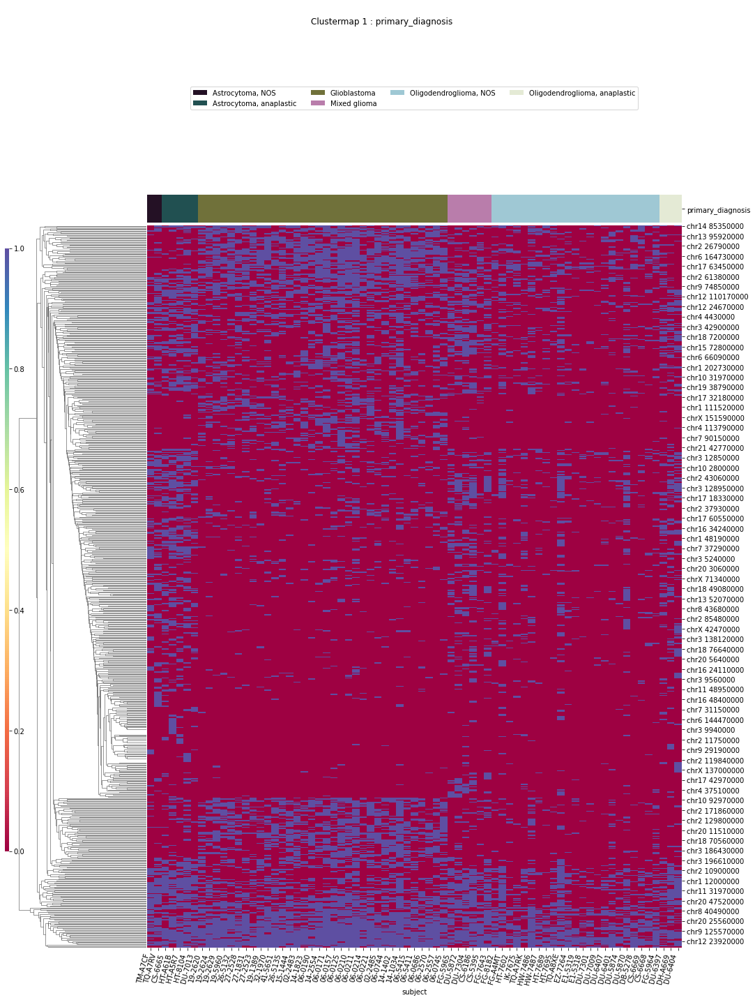

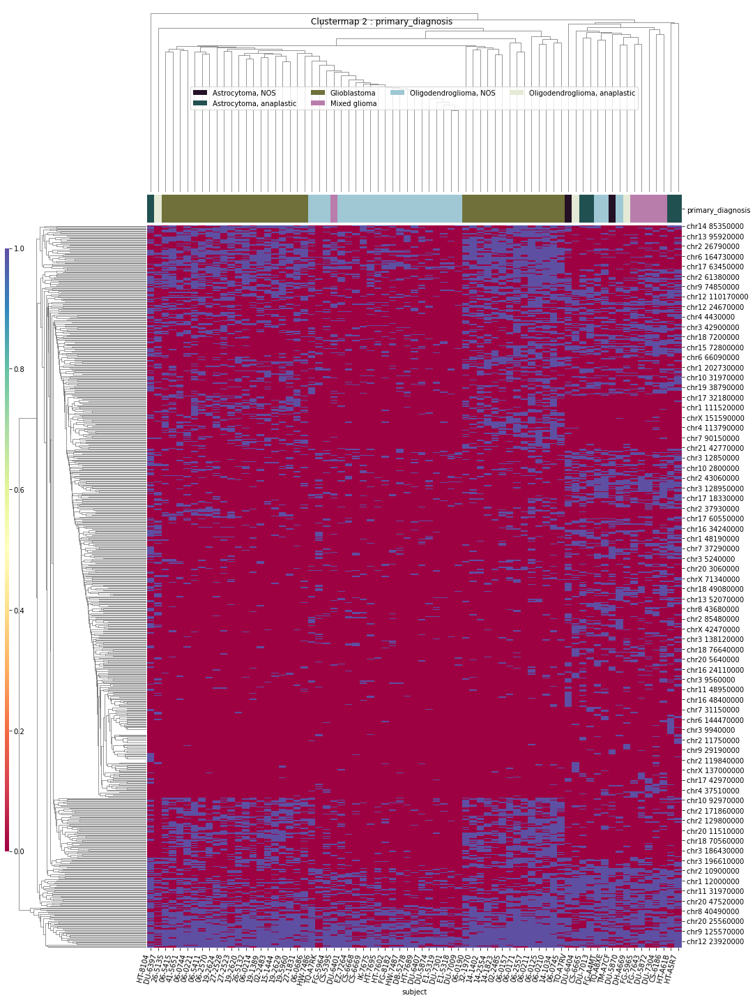

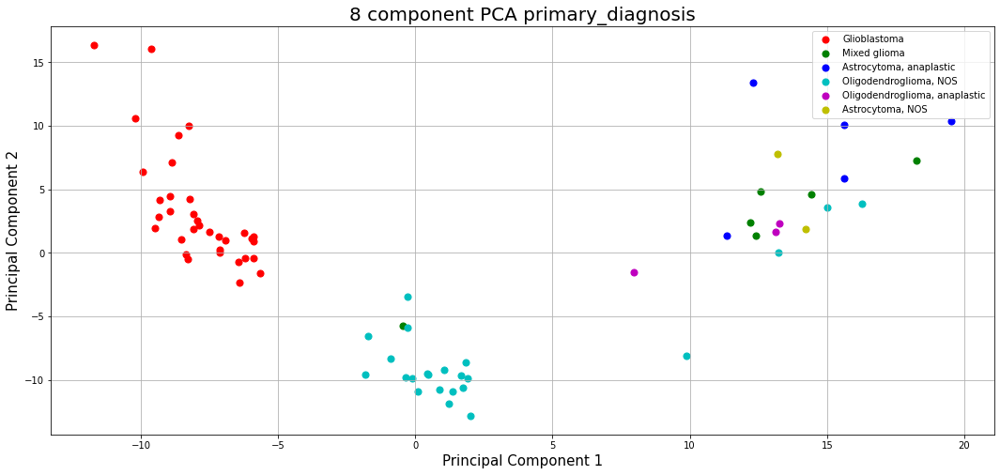

IDH
T-Testing
Boxplotting
Clustermapping
['IDH' 'chr1 109170000' 'chr1 111230000' 'chr1 112720000' 'chr1 11300000'
 'chr1 114790000' 'chr1 152140000' 'chr1 153570000' 'chr1 153580000'
 'chr1 161420000' 'chr1 161610000' 'chr1 162450000' 'chr1 179030000'
 'chr1 202730000' 'chr1 22150000' 'chr1 231120000' 'chr1 27060000'
 'chr1 77860000' 'chr1 92020000' 'chr10 102030000' 'chr10 119180000'
 'chr10 2800000' 'chr10 43440000' 'chr10 59740000' 'chr10 92970000'
 'chr11 56140000' 'chr11 5960000' 'chr11 65760000' 'chr11 68470000'
 'chr11 73890000' 'chr11 8520000' 'chr12 100290000' 'chr12 103640000'
 'chr12 121070000' 'chr12 123370000' 'chr12 15910000' 'chr12 28200000'
 'chr12 31180000' 'chr12 40350000' 'chr12 43680000' 'chr12 48720000'
 'chr12 56780000' 'chr12 7580000' 'chr13 100610000' 'chr13 22850000'
 'chr13 95680000' 'chr14 102170000' 'chr14 102670000' 'chr14 23730000'
 'chr14 39280000' 'chr14 55450000' 'chr14 63160000' 'chr14 64030000'
 'chr14 94650000' 'chr15 43070000' 'chr15 50150000' 'chr

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


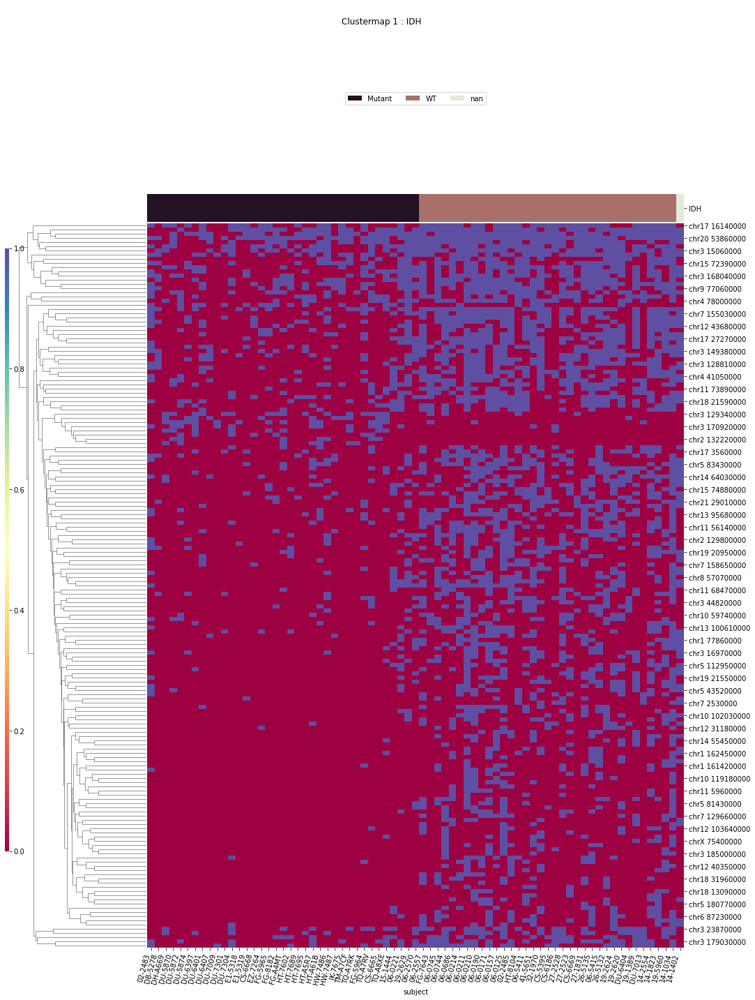

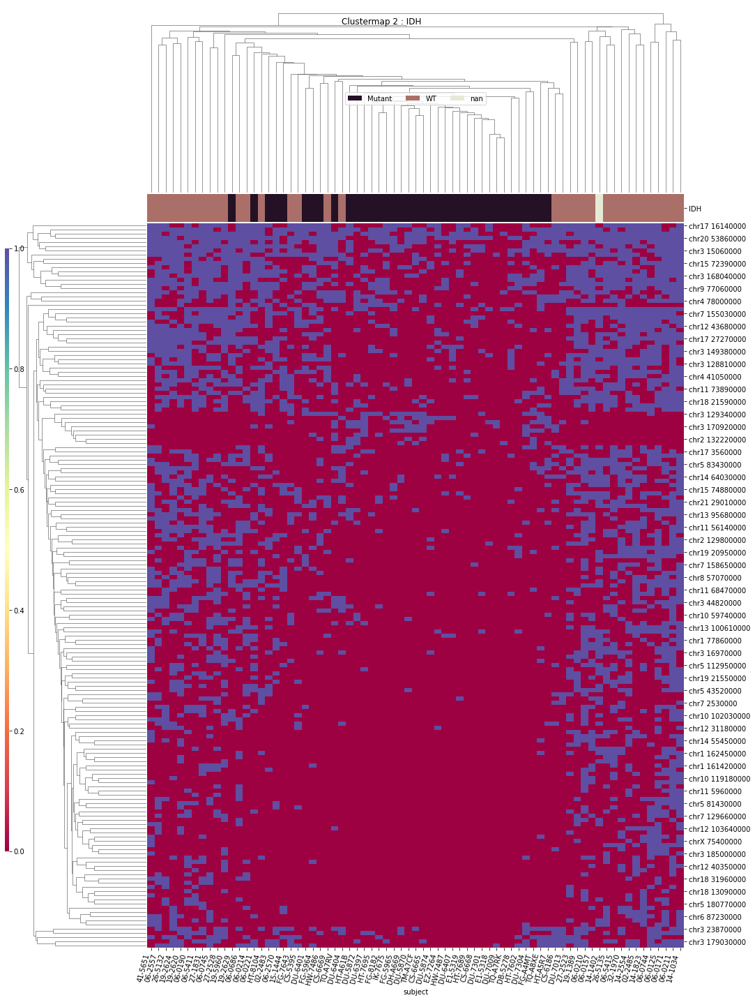

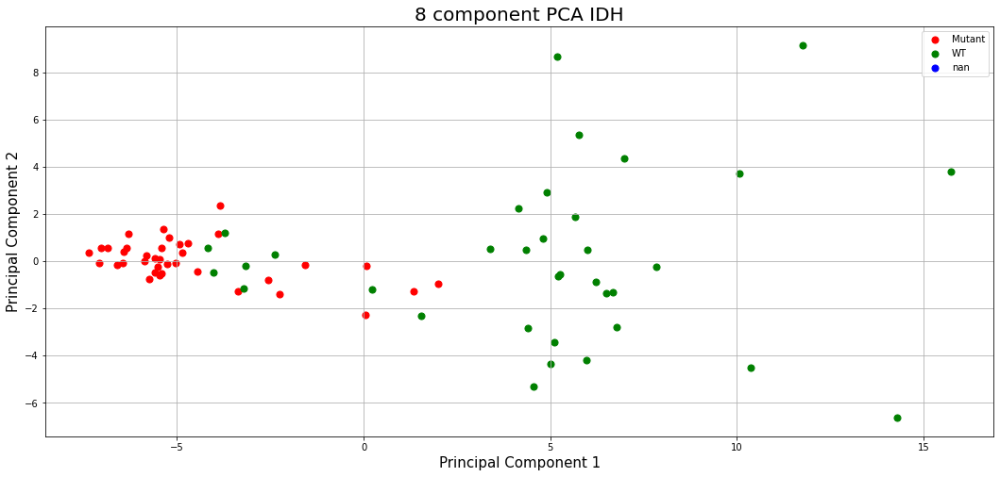

x1p19q
T-Testing
Boxplotting
Clustermapping
['chr1 11300000' 'chr1 12040000' 'chr1 145760000' 'chr1 179030000'
 'chr1 189220000' 'chr1 52180000' 'chr10 119790000' 'chr10 42130000'
 'chr10 45510000' 'chr11 112020000' 'chr11 73890000' 'chr11 79190000'
 'chr12 43680000' 'chr12 48720000' 'chr12 63680000' 'chr12 7580000'
 'chr13 22850000' 'chr13 95840000' 'chr14 31430000' 'chr14 34470000'
 'chr14 44600000' 'chr14 63160000' 'chr17 46250000' 'chr18 12870000'
 'chr18 21590000' 'chr18 59250000' 'chr18 70560000' 'chr2 15610000'
 'chr2 208370000' 'chr2 41990000' 'chr2 9120000' 'chr20 47520000'
 'chr22 24310000' 'chr3 15060000' 'chr3 179030000' 'chr3 186880000'
 'chr4 41050000' 'chr5 56250000' 'chr6 15410000' 'chr7 153310000'
 'chr7 83120000' 'chr9 129660000' 'chrX 55740000' 'subject' 'x1p19q']


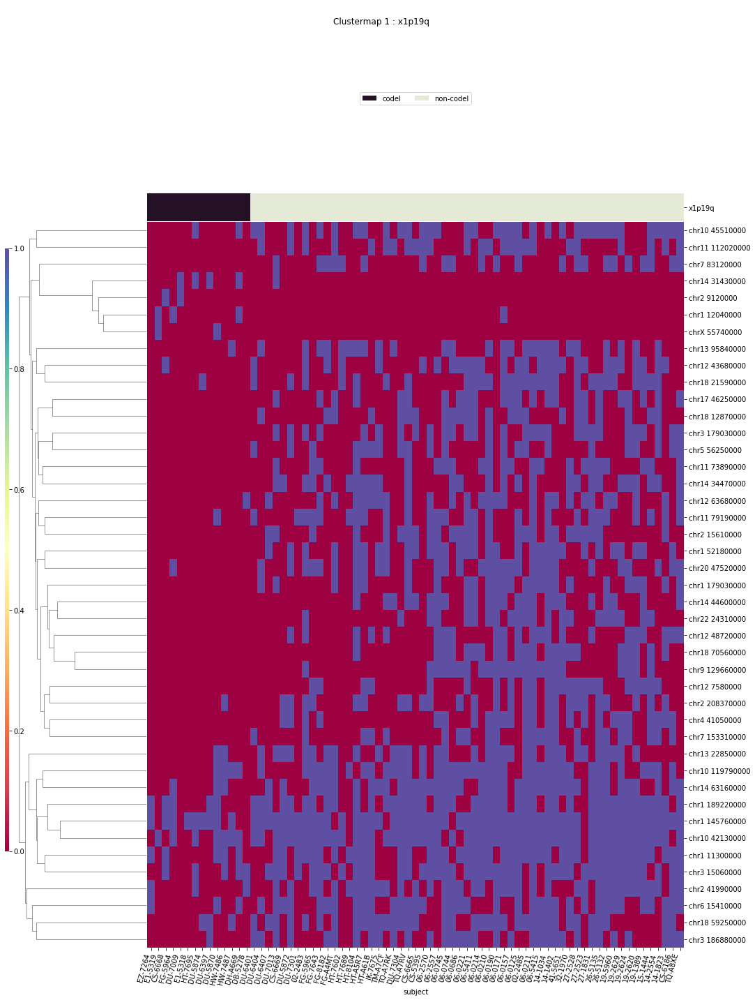

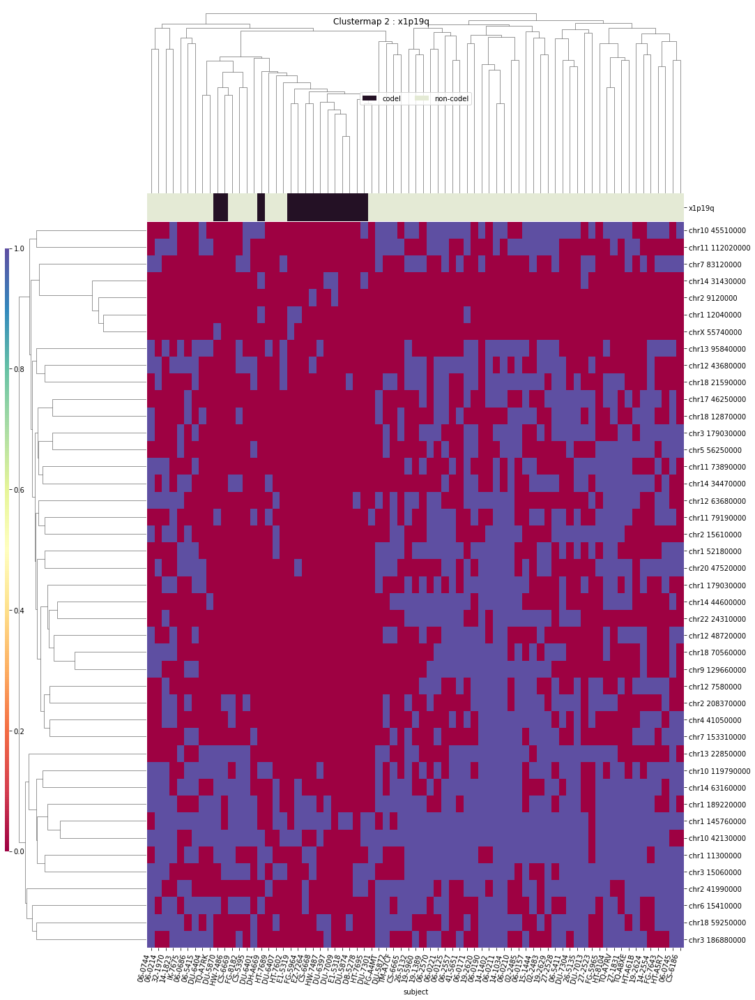

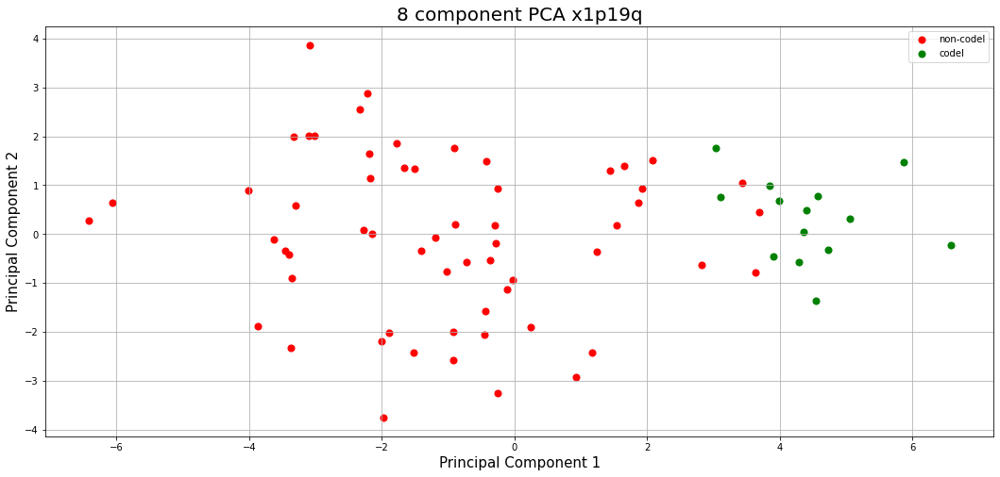

TERT
T-Testing
Boxplotting
Clustermapping
['TERT' 'chr1 112720000' 'chr1 161420000' 'chr1 213150000'
 'chr11 112020000' 'chr11 131080000' 'chr11 28420000' 'chr11 56140000'
 'chr11 65760000' 'chr12 123370000' 'chr12 26780000' 'chr12 56780000'
 'chr12 69760000' 'chr15 75480000' 'chr16 4770000' 'chr17 1240000'
 'chr17 16140000' 'chr17 26630000' 'chr17 27270000' 'chr17 3560000'
 'chr17 47410000' 'chr18 12970000' 'chr18 31950000' 'chr18 70560000'
 'chr19 1490000' 'chr2 171900000' 'chr2 179310000' 'chr2 50820000'
 'chr2 61380000' 'chr2 71540000' 'chr20 30840000' 'chr20 31470000'
 'chr21 45260000' 'chr22 31590000' 'chr22 34680000' 'chr22 38800000'
 'chr3 48480000' 'chr3 5240000' 'chr3 61390000' 'chr4 174290000'
 'chr4 40780000' 'chr4 540000' 'chr4 550000' 'chr4 6750000'
 'chr5 83430000' 'chr6 99650000' 'chr7 129660000' 'chr7 155030000'
 'chr8 51530000' 'chr9 125570000' 'chr9 97490000' 'subject']


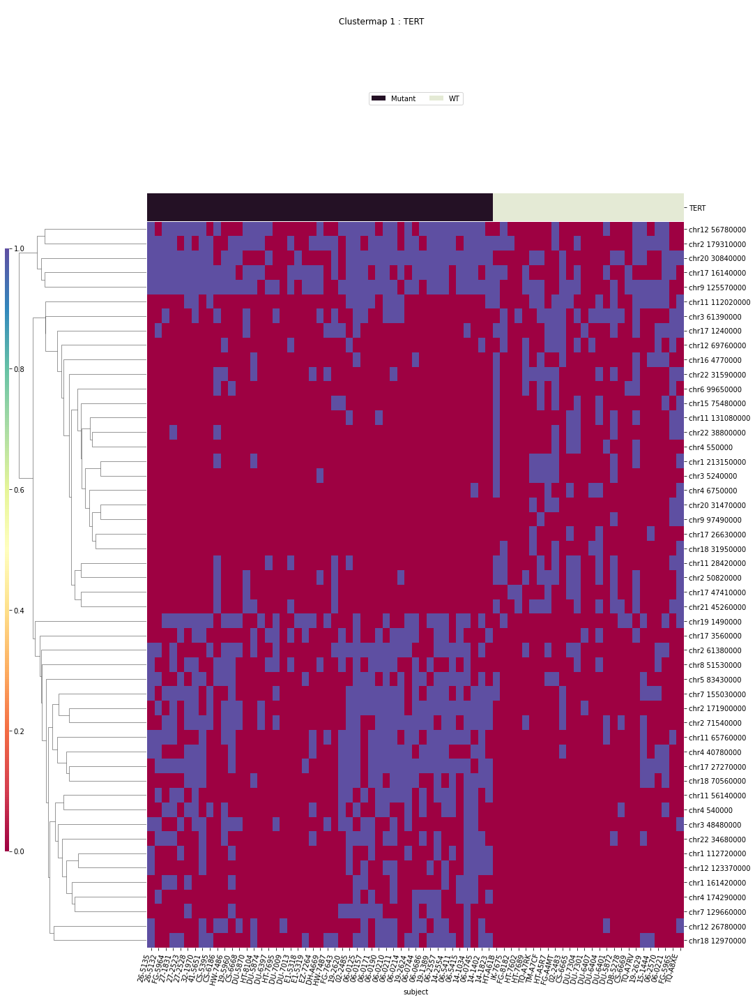

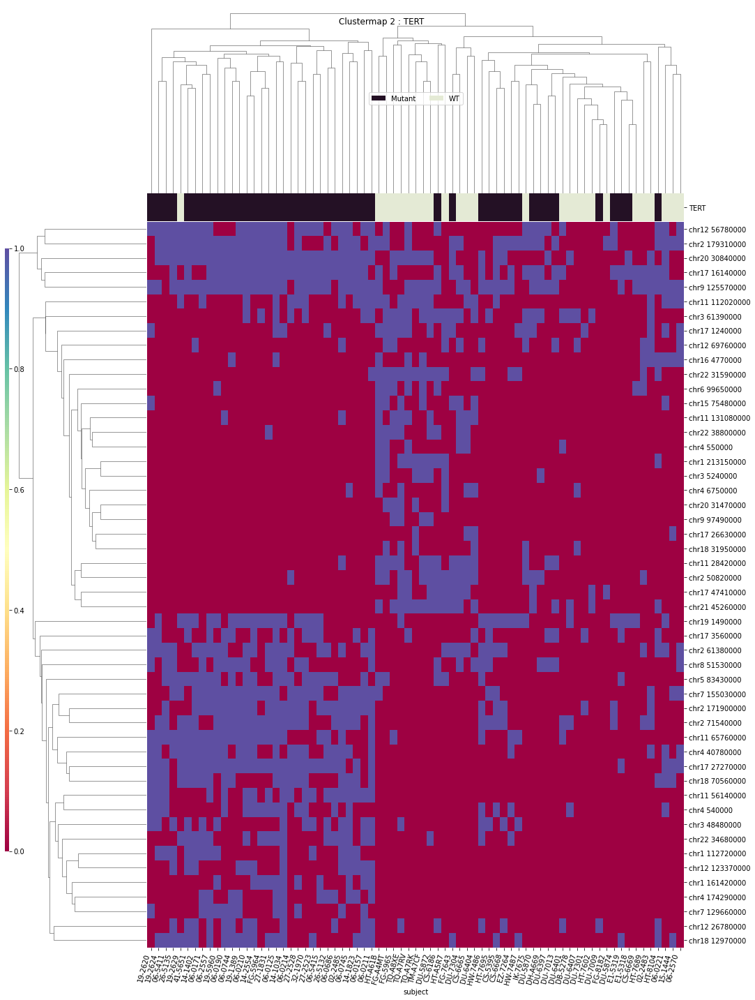

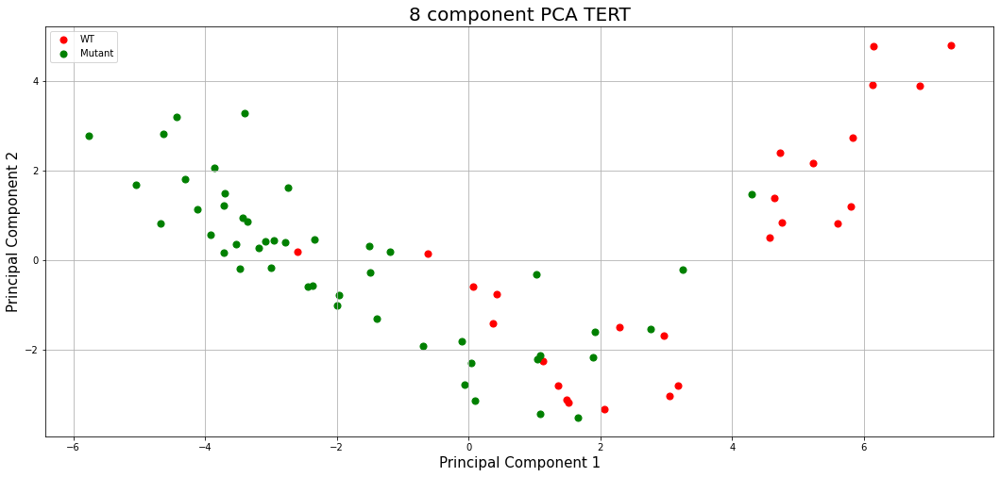

disease_type
T-Testing
Boxplotting
 p : 3.873045396608156e-20  ( t : 12.811611525258288 ) :  chr17 27270000


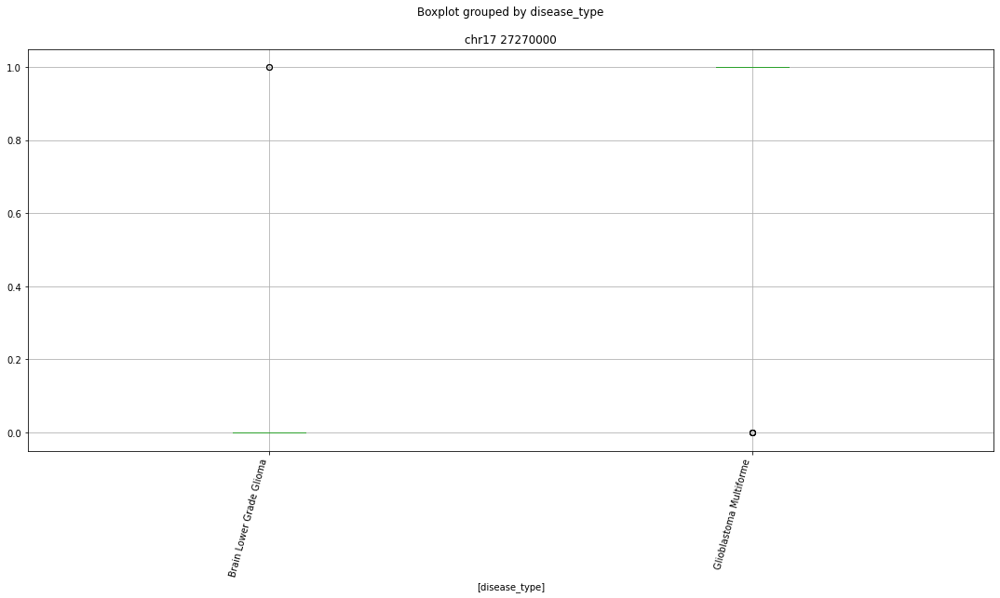

Clustermapping
['chr1 109170000' 'chr1 111230000' 'chr1 111520000' 'chr1 11240000'
 'chr1 112720000' 'chr1 11300000' 'chr1 114790000' 'chr1 13390000'
 'chr1 152140000' 'chr1 152190000' 'chr1 153570000' 'chr1 153580000'
 'chr1 161420000' 'chr1 161610000' 'chr1 163540000' 'chr1 167030000'
 'chr1 173610000' 'chr1 176050000' 'chr1 179030000' 'chr1 179040000'
 'chr1 202190000' 'chr1 202730000' 'chr1 213150000' 'chr1 22150000'
 'chr1 225610000' 'chr1 227130000' 'chr1 227710000' 'chr1 229930000'
 'chr1 231120000' 'chr1 23250000' 'chr1 237670000' 'chr1 247210000'
 'chr1 247220000' 'chr1 25600000' 'chr1 26800000' 'chr1 27060000'
 'chr1 27280000' 'chr1 33510000' 'chr1 36240000' 'chr1 39990000'
 'chr1 52180000' 'chr1 52860000' 'chr1 65630000' 'chr1 77860000'
 'chr1 7950000' 'chr1 86900000' 'chr1 86960000' 'chr1 92020000'
 'chr1 99850000' 'chr10 102030000' 'chr10 118790000' 'chr10 119180000'
 'chr10 120790000' 'chr10 28650000' 'chr10 45260000' 'chr10 6820000'
 'chr10 68280000' 'chr10 6990000' 'chr

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


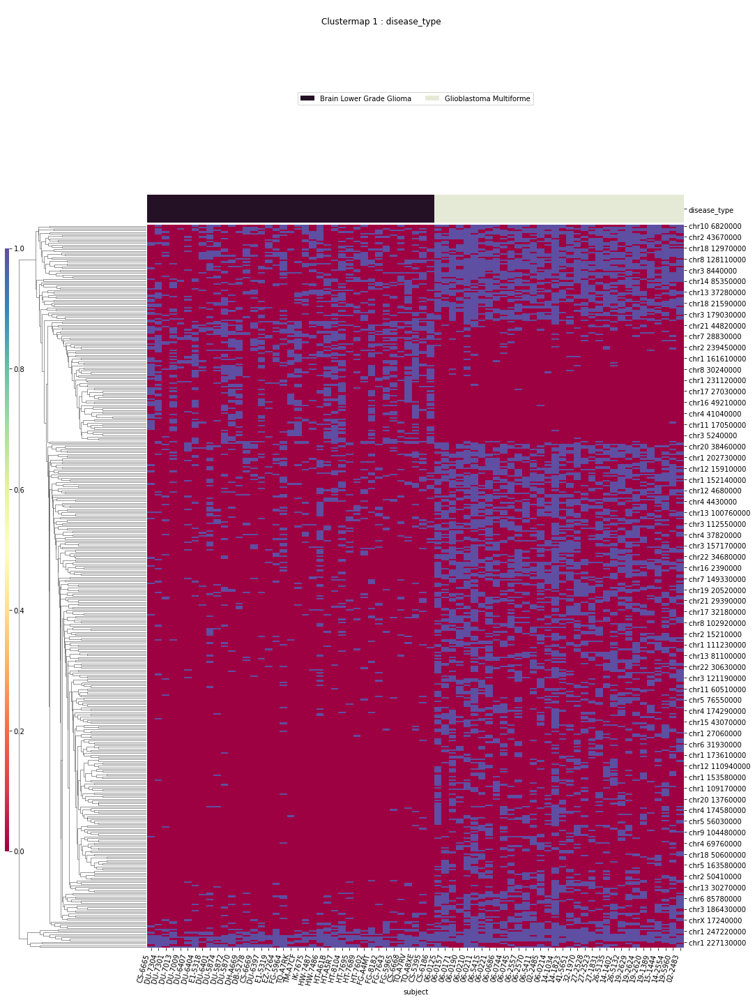

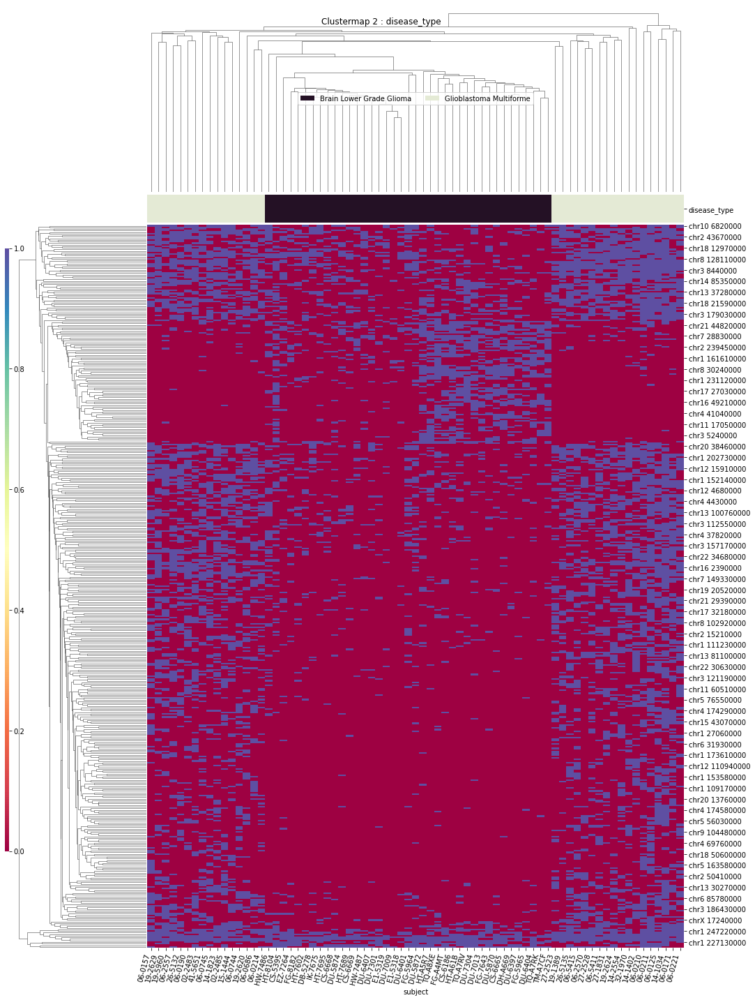

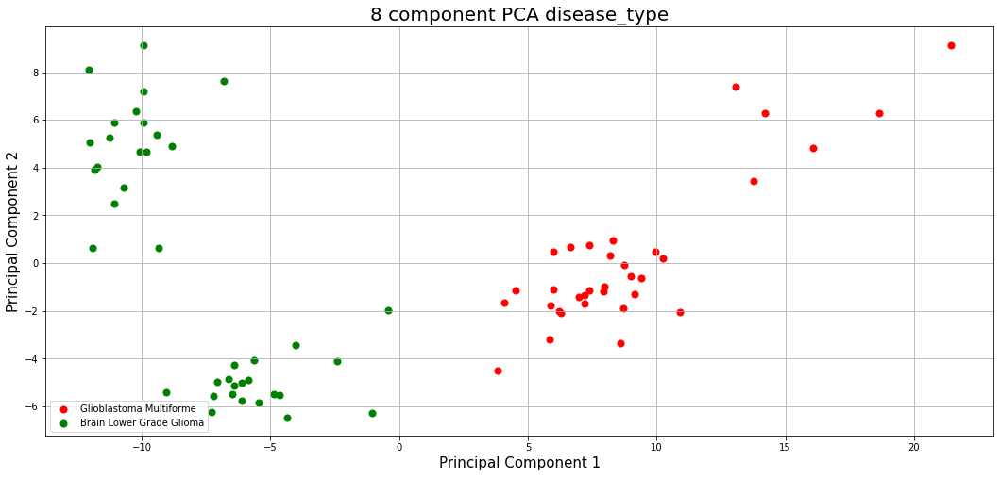

IDH_1p19q_status
T-Testing


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['IDH_1p19q_status' 'chr1 112720000' 'chr1 11300000' 'chr1 114790000'
 'chr1 145760000' 'chr1 151650000' 'chr1 152140000' 'chr1 153570000'
 'chr1 160930000' 'chr1 161420000' 'chr1 161610000' 'chr1 179030000'
 'chr1 213150000' 'chr1 22150000' 'chr1 231120000' 'chr1 237670000'
 'chr1 247220000' 'chr1 50380000' 'chr1 52180000' 'chr1 86210000'
 'chr10 119790000' 'chr10 42130000' 'chr10 43440000' 'chr10 45510000'
 'chr11 106310000' 'chr11 112020000' 'chr11 56140000' 'chr11 65760000'
 'chr11 73890000' 'chr11 79190000' 'chr12 110090000' 'chr12 121070000'
 'chr12 123370000' 'chr12 15910000' 'chr12 31180000' 'chr12 43680000'
 'chr12 4680000' 'chr12 48720000' 'chr12 56780000' 'chr12 63680000'
 'chr12 69760000' 'chr12 7580000' 'chr13 100610000' 'chr13 22850000'
 'chr13 52070000' 'chr13 95680000' 'chr13 95840000' 'chr14 102670000'
 'chr14 31430000' 'chr14 34470000' 'chr14 39280000' 'chr14 44600000'
 'chr14 63160000' 'chr14 64030000' 'chr14 76730000' 'chr15 41320000'
 'ch

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


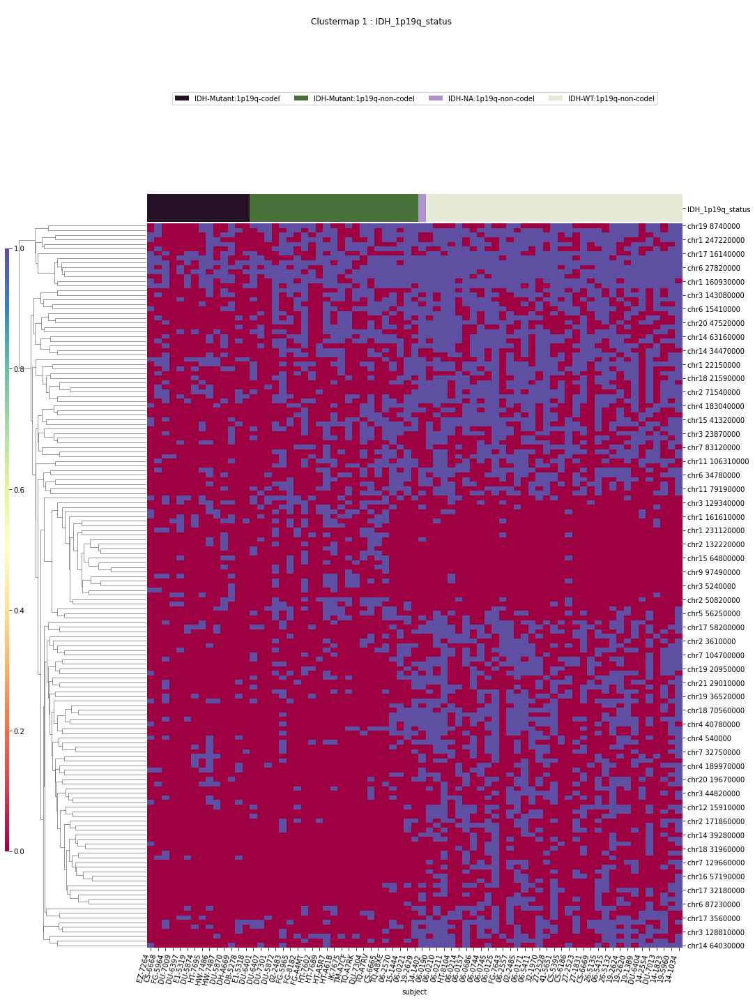

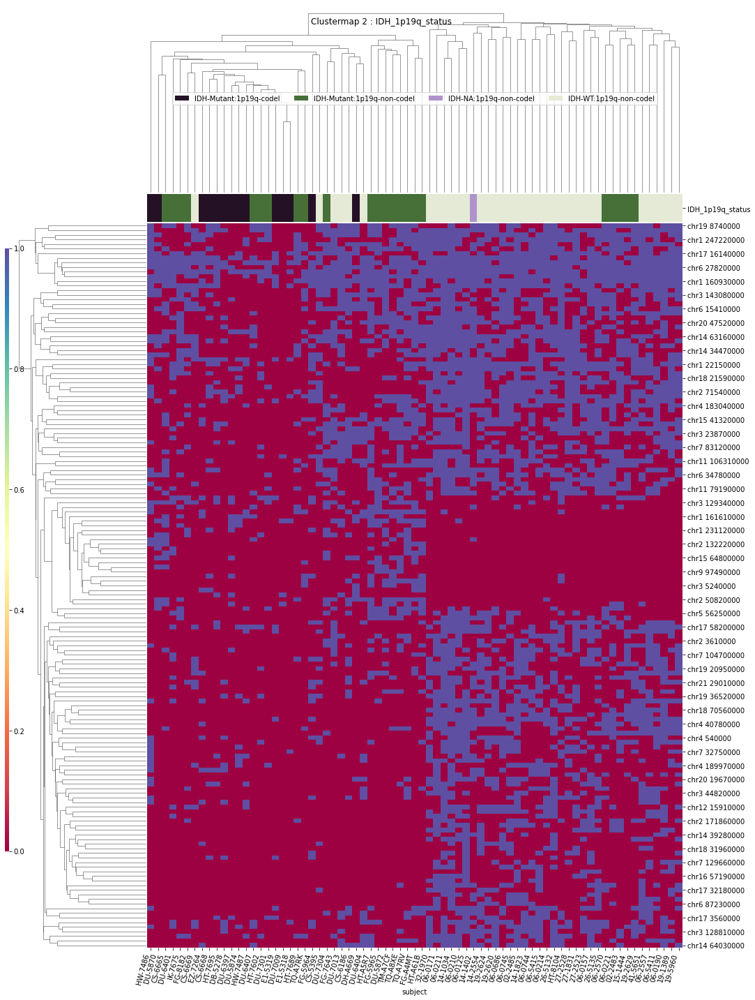

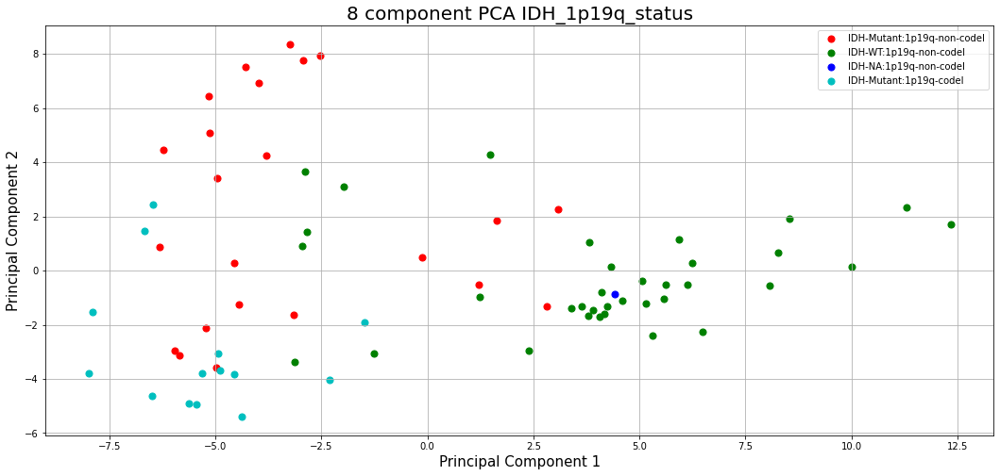

WHO_groups
T-Testing
Boxplotting
 p : 6.278055973426837e-16  ( t : 14.282856857085699 ) :  chr20 30840000


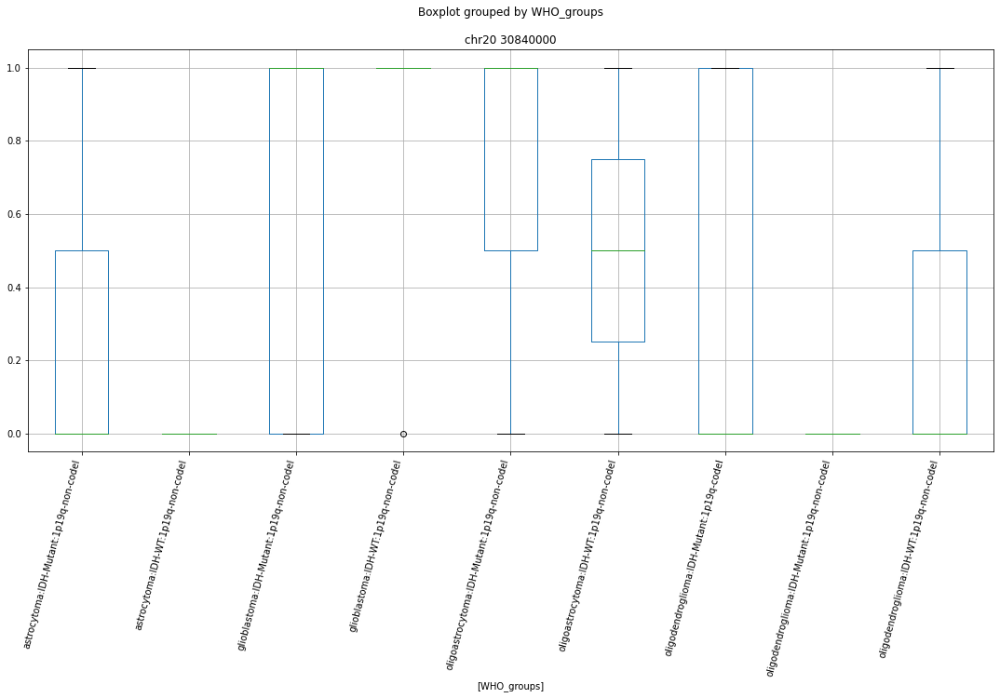

Clustermapping
['WHO_groups' 'chr1 10020000' 'chr1 108490000' 'chr1 108530000'
 'chr1 108670000' 'chr1 109070000' 'chr1 111520000' 'chr1 112720000'
 'chr1 11300000' 'chr1 114790000' 'chr1 114800000' 'chr1 12900000'
 'chr1 143700000' 'chr1 147730000' 'chr1 150780000' 'chr1 150850000'
 'chr1 15130000' 'chr1 151650000' 'chr1 151760000' 'chr1 151770000'
 'chr1 152140000' 'chr1 153570000' 'chr1 161610000' 'chr1 162450000'
 'chr1 167030000' 'chr1 179030000' 'chr1 179040000' 'chr1 182440000'
 'chr1 182740000' 'chr1 189130000' 'chr1 189220000' 'chr1 20810000'
 'chr1 208650000' 'chr1 209120000' 'chr1 212320000' 'chr1 213150000'
 'chr1 219540000' 'chr1 220460000' 'chr1 22150000' 'chr1 222480000'
 'chr1 224350000' 'chr1 226110000' 'chr1 231120000' 'chr1 235310000'
 'chr1 236380000' 'chr1 237660000' 'chr1 237670000' 'chr1 245770000'
 'chr1 247210000' 'chr1 247220000' 'chr1 24790000' 'chr1 248670000'
 'chr1 27280000' 'chr1 33310000' 'chr1 33510000' 'chr1 34960000'
 'chr1 36240000' 'chr1 37070000' '

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


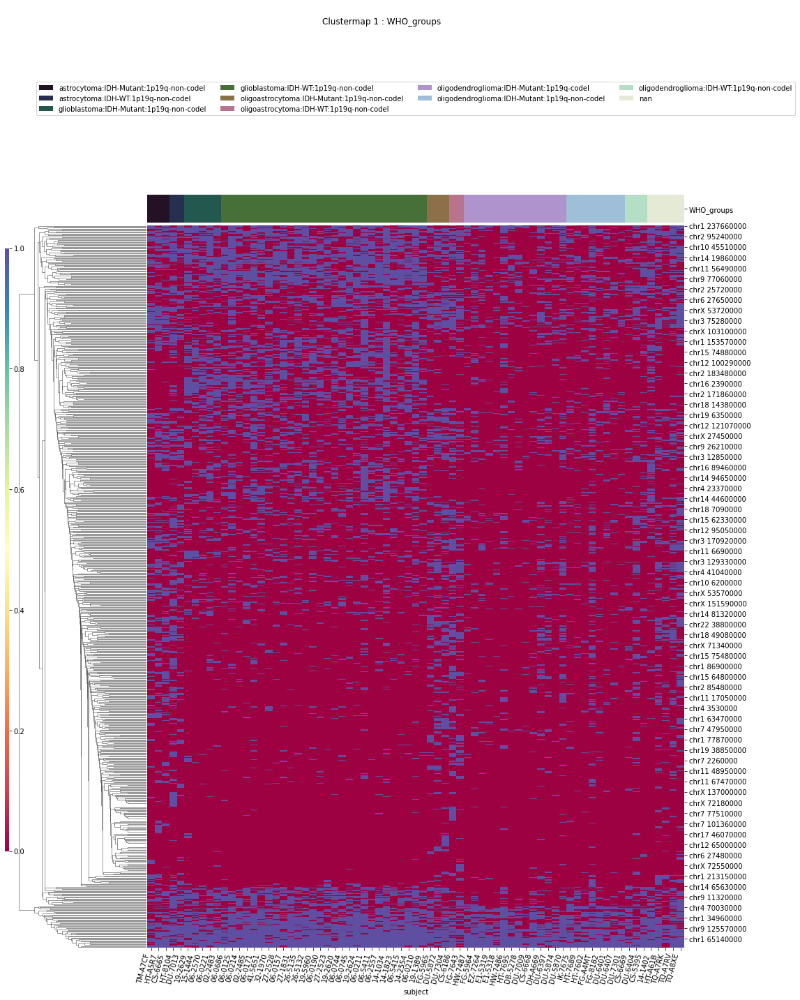

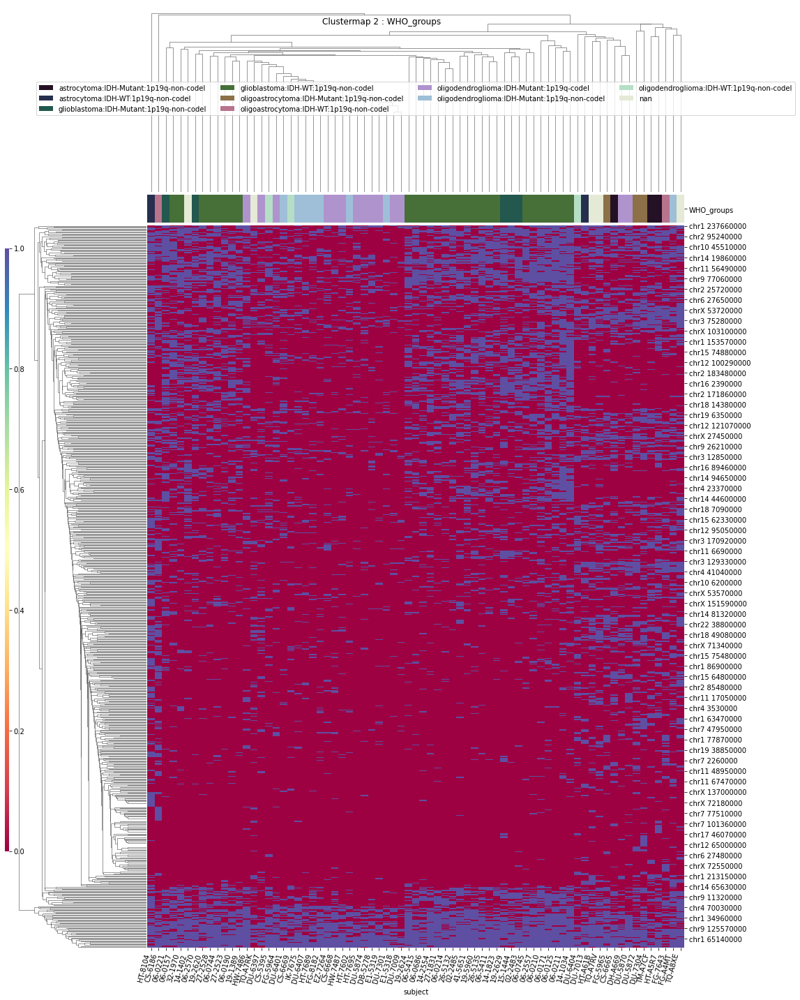

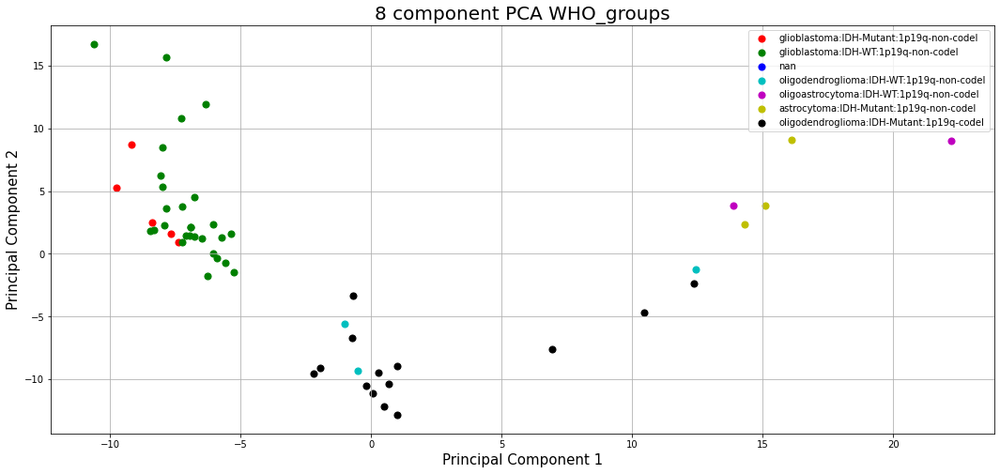

Triple_group
T-Testing


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['Triple_group' 'chr1 10020000' 'chr1 108490000' 'chr1 111230000'
 'chr1 112720000' 'chr1 11300000' 'chr1 114050000' 'chr1 114790000'
 'chr1 114800000' 'chr1 15130000' 'chr1 152140000' 'chr1 153570000'
 'chr1 161420000' 'chr1 161610000' 'chr1 167030000' 'chr1 179030000'
 'chr1 209120000' 'chr1 213150000' 'chr1 21380000' 'chr1 22150000'
 'chr1 224350000' 'chr1 231120000' 'chr1 237670000' 'chr1 245770000'
 'chr1 247220000' 'chr1 39990000' 'chr1 43500000' 'chr1 50380000'
 'chr1 52180000' 'chr1 65140000' 'chr1 77870000' 'chr1 99850000'
 'chr10 130620000' 'chr10 2800000' 'chr10 43440000' 'chr10 45250000'
 'chr10 45510000' 'chr11 112020000' 'chr11 131080000' 'chr11 133060000'
 'chr11 17050000' 'chr11 19860000' 'chr11 44660000' 'chr11 56140000'
 'chr11 60490000' 'chr11 62270000' 'chr11 65760000' 'chr11 73890000'
 'chr11 73930000' 'chr11 79190000' 'chr11 83310000' 'chr11 89860000'
 'chr12 110090000' 'chr12 110170000' 'chr12 121070000' 'chr12 123370000'
 'chr12 159100

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


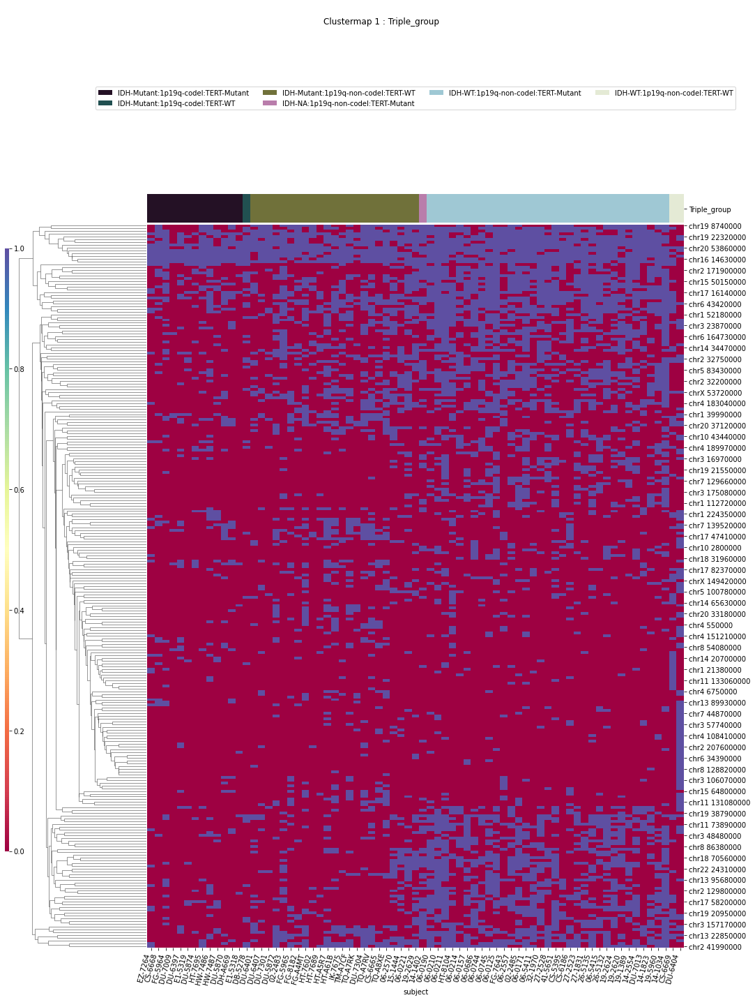

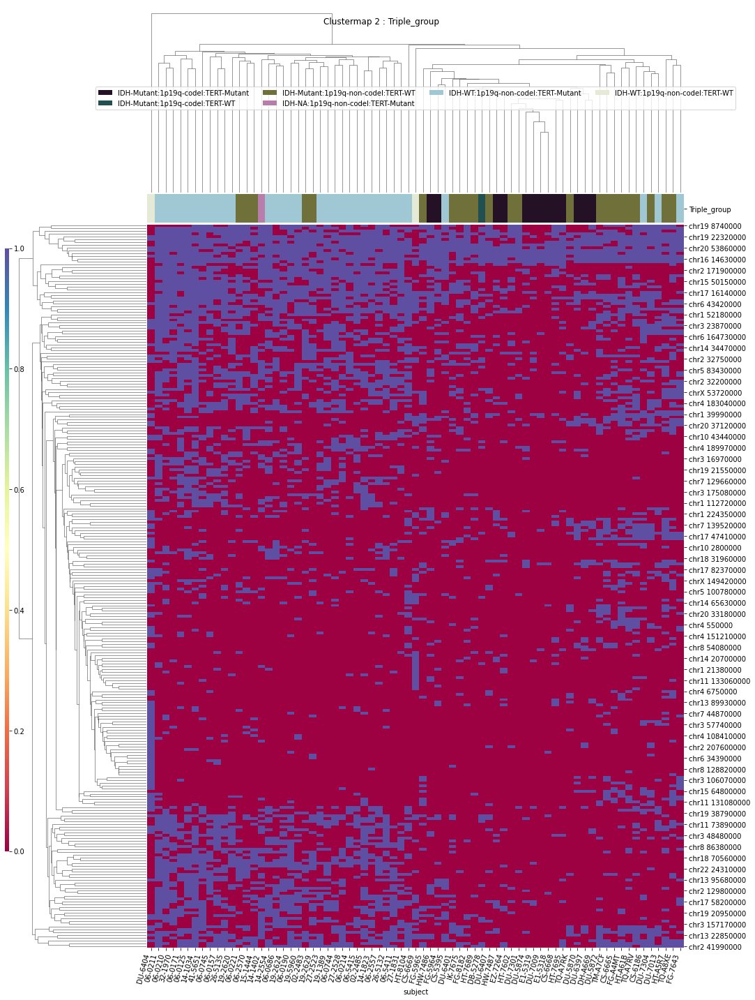

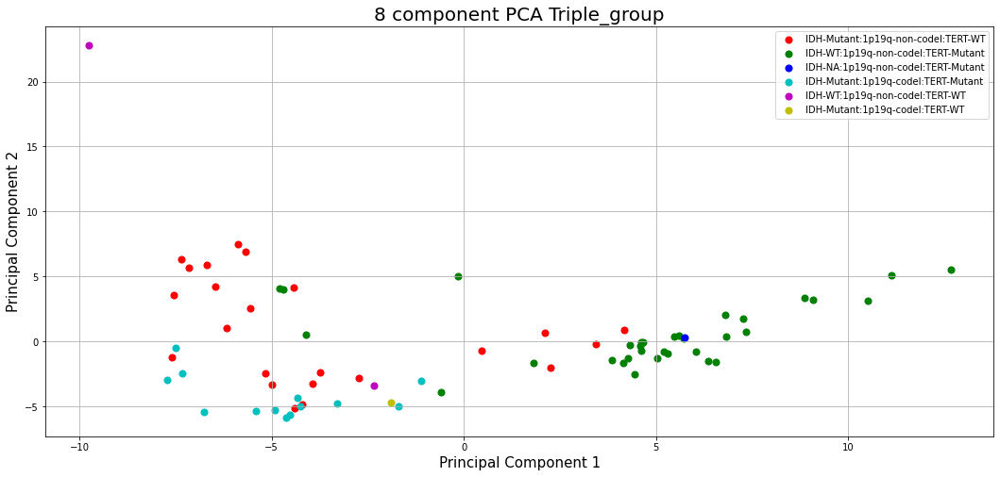

MGMT
T-Testing
Boxplotting
Clustermapping
['MGMT' 'chr1 152140000' 'chr1 179030000' 'chr1 27280000' 'chr1 50820000'
 'chr10 2800000' 'chr11 56140000' 'chr12 122350000' 'chr13 23970000'
 'chr14 51600000' 'chr15 68960000' 'chr17 1240000' 'chr17 27270000'
 'chr17 32180000' 'chr17 42240000' 'chr17 82370000' 'chr18 50600000'
 'chr19 21510000' 'chr19 38790000' 'chr2 171900000' 'chr2 32200000'
 'chr2 7330000' 'chr20 32120000' 'chr20 37710000' 'chr21 29010000'
 'chr22 38400000' 'chr3 127300000' 'chr3 157170000' 'chr4 41050000'
 'chr4 48180000' 'chr5 112950000' 'chr6 36940000' 'chr6 73850000'
 'chr6 74250000' 'chr7 158650000' 'chr8 41620000' 'chr8 9360000'
 'chr9 33420000' 'chr9 92220000' 'chrX 30750000' 'subject']


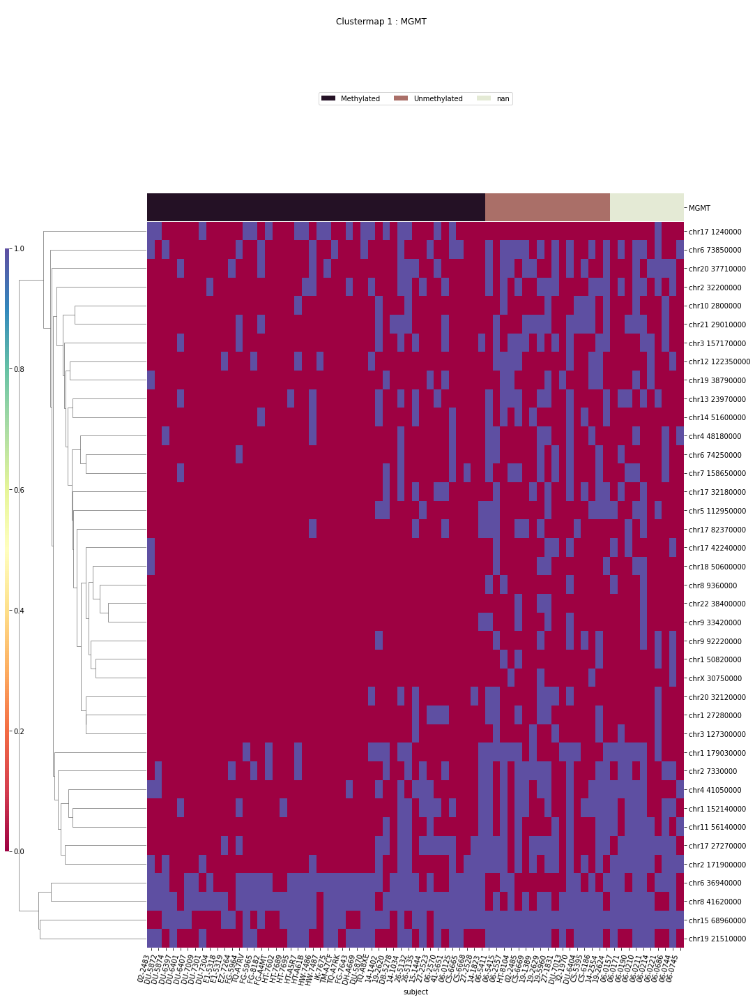

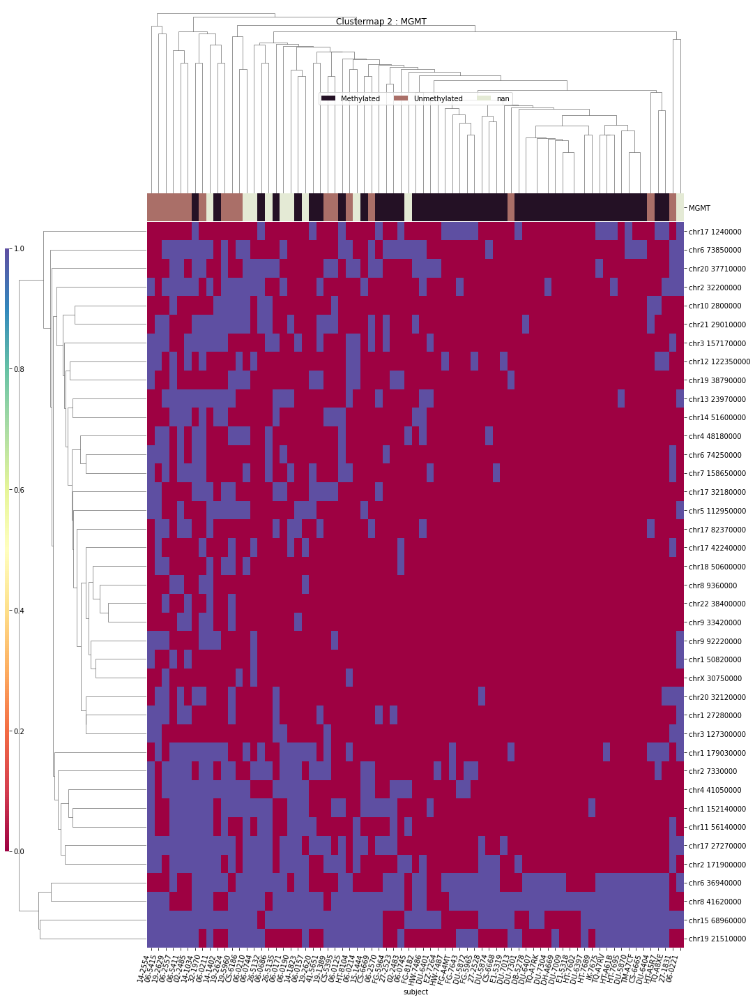

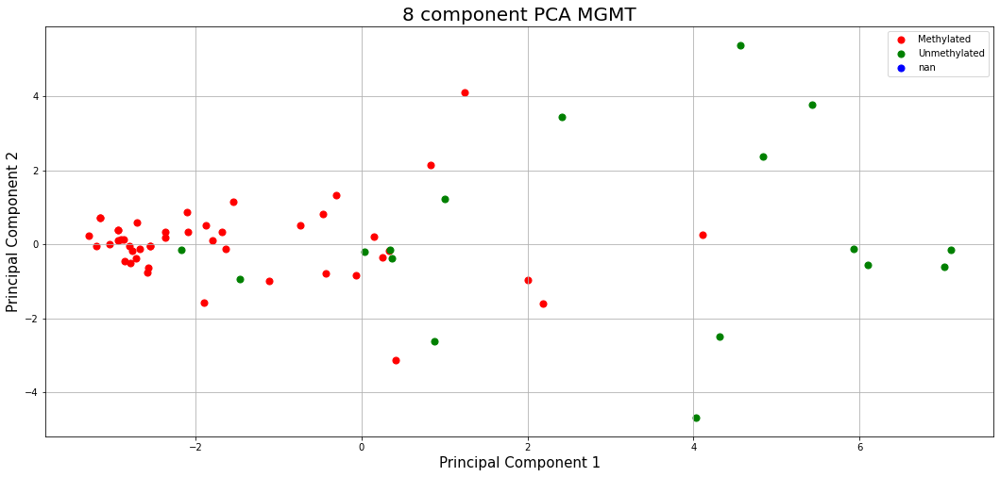

In [112]:
for column in ['primary_diagnosis','IDH','x1p19q','TERT','disease_type',
               'IDH_1p19q_status','WHO_groups','Triple_group','MGMT']:
    print(column)
    ttests_boxplots_and_heatmaps(compdf[compdf['hkle']==hkle],
        compdf.columns[compdf.columns.str.contains("^chr")],column,box_p=1e-15,heat_p=0.01)

In [113]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210601 18:34:17'

primary_diagnosis
T-Testing
Boxplotting
Clustermapping
['chr1 108490000' 'chr1 109070000' 'chr1 11240000' 'chr1 112720000'
 'chr1 11300000' 'chr1 114790000' 'chr1 12900000' 'chr1 147060000'
 'chr1 150780000' 'chr1 151650000' 'chr1 152250000' 'chr1 153570000'
 'chr1 159440000' 'chr1 160930000' 'chr1 161610000' 'chr1 167030000'
 'chr1 179030000' 'chr1 179040000' 'chr1 202730000' 'chr1 208650000'
 'chr1 21020000' 'chr1 212320000' 'chr1 213150000' 'chr1 22150000'
 'chr1 231120000' 'chr1 236380000' 'chr1 237670000' 'chr1 33310000'
 'chr1 33510000' 'chr1 36240000' 'chr1 37890000' 'chr1 39910000'
 'chr1 39990000' 'chr1 43500000' 'chr1 48190000' 'chr1 52180000'
 'chr1 52870000' 'chr1 77860000' 'chr1 77870000' 'chr1 7950000'
 'chr1 86210000' 'chr1 86900000' 'chr1 92020000' 'chr1 99850000'
 'chr10 100090000' 'chr10 104780000' 'chr10 119790000' 'chr10 122200000'
 'chr10 12520000' 'chr10 31970000' 'chr10 45250000' 'chr10 45330000'
 'chr10 45510000' 'chr10 59690000' 'chr10 69910000' 'chr10 78070000

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


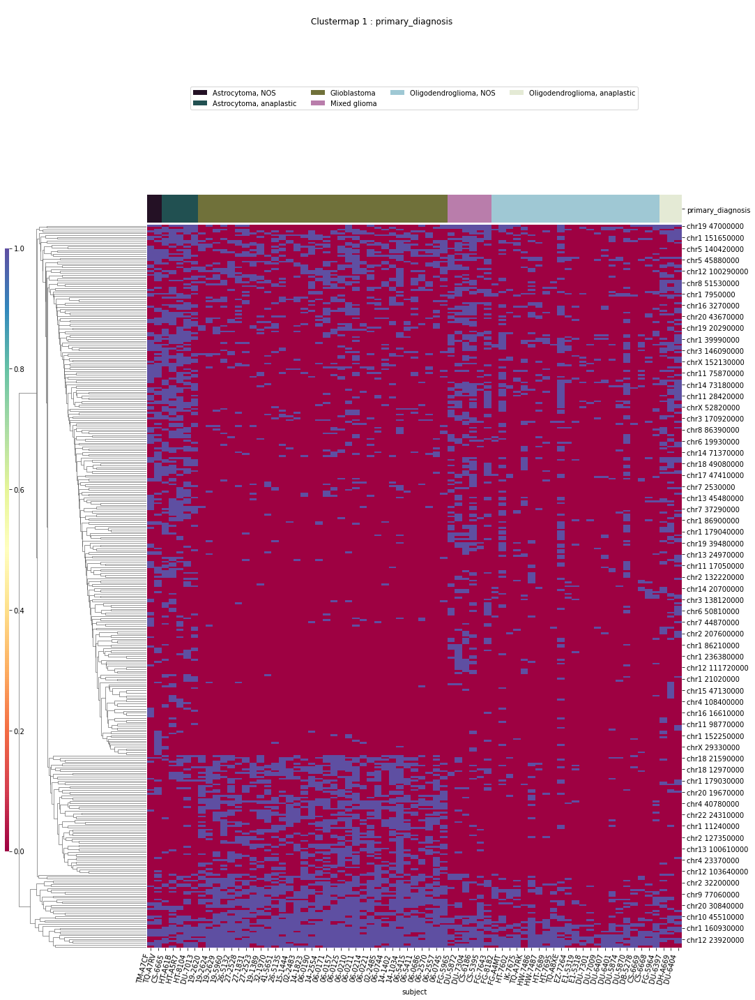

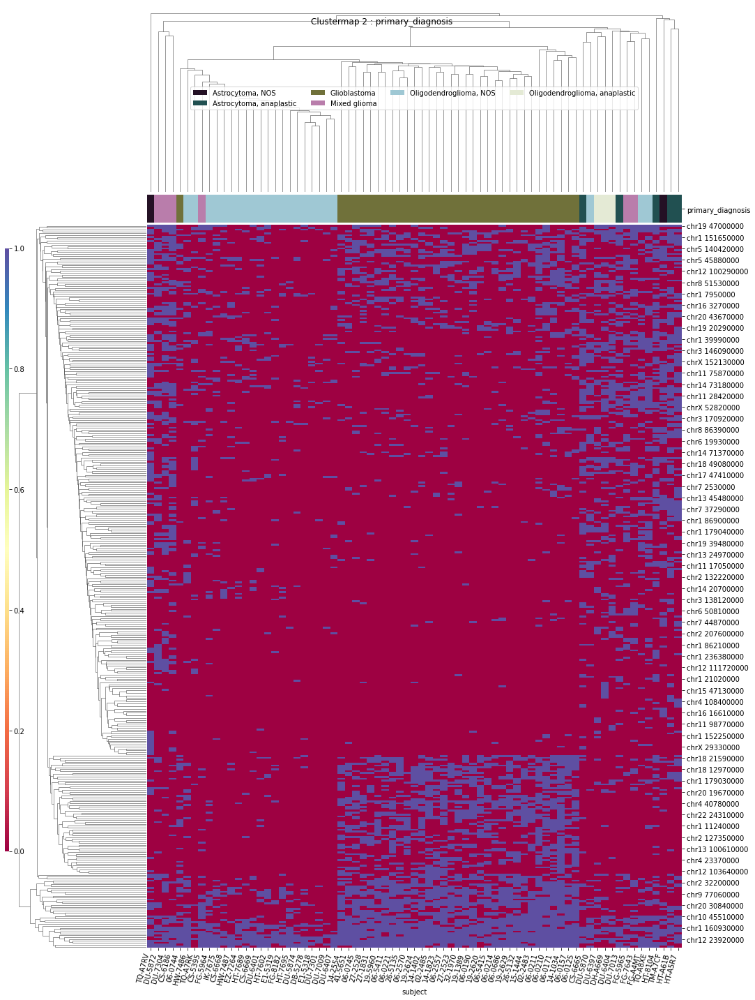

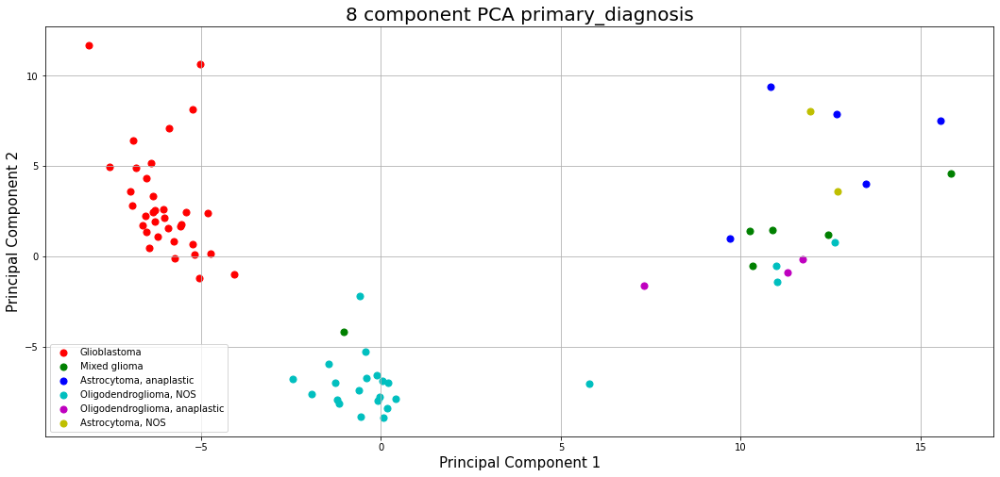

IDH
T-Testing
Boxplotting
Clustermapping
['IDH' 'chr1 112720000' 'chr1 152140000' 'chr1 179030000' 'chr11 56140000'
 'chr11 65760000' 'chr11 73890000' 'chr12 123370000' 'chr12 15910000'
 'chr12 48720000' 'chr13 100610000' 'chr13 95680000' 'chr14 39280000'
 'chr14 64030000' 'chr16 57190000' 'chr17 16140000' 'chr17 2250000'
 'chr17 27270000' 'chr17 32180000' 'chr17 3560000' 'chr18 12970000'
 'chr18 31960000' 'chr18 70560000' 'chr19 20950000' 'chr19 21550000'
 'chr19 38790000' 'chr2 171900000' 'chr2 61380000' 'chr20 30840000'
 'chr21 29010000' 'chr3 128810000' 'chr3 157170000' 'chr3 175080000'
 'chr3 186430000' 'chr3 195590000' 'chr3 44820000' 'chr4 174290000'
 'chr4 23370000' 'chr4 40780000' 'chr4 41050000' 'chr5 139170000'
 'chr5 83430000' 'chr6 87230000' 'chr7 129660000' 'chr7 155030000'
 'chr8 67160000' 'chr8 86380000' 'chr9 11320000' 'chr9 129660000'
 'subject']


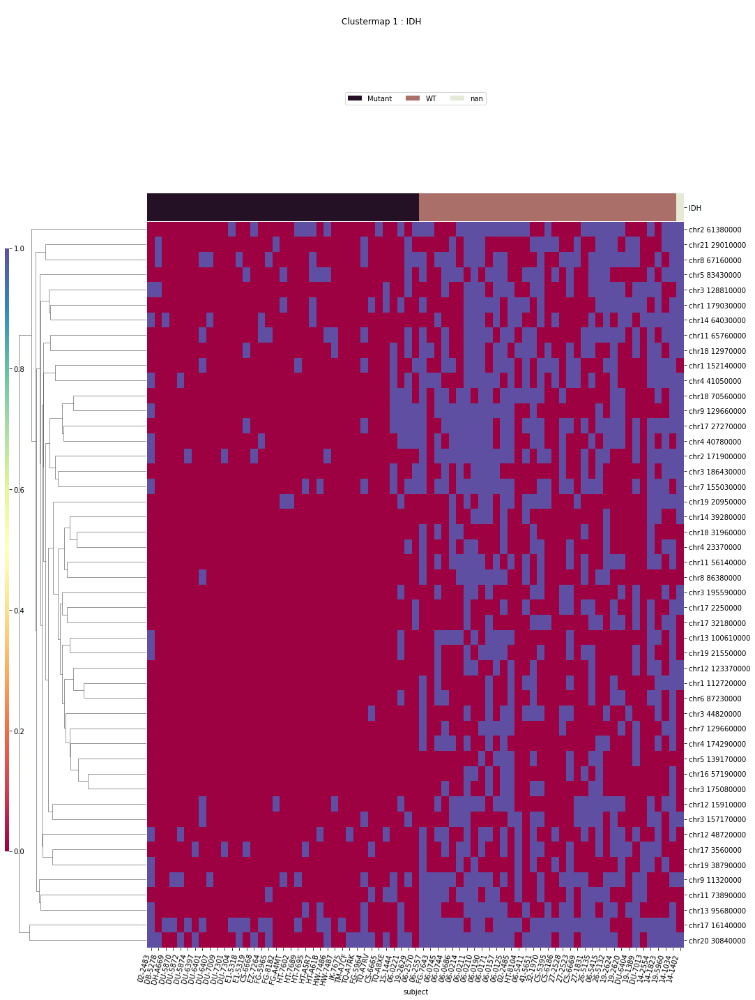

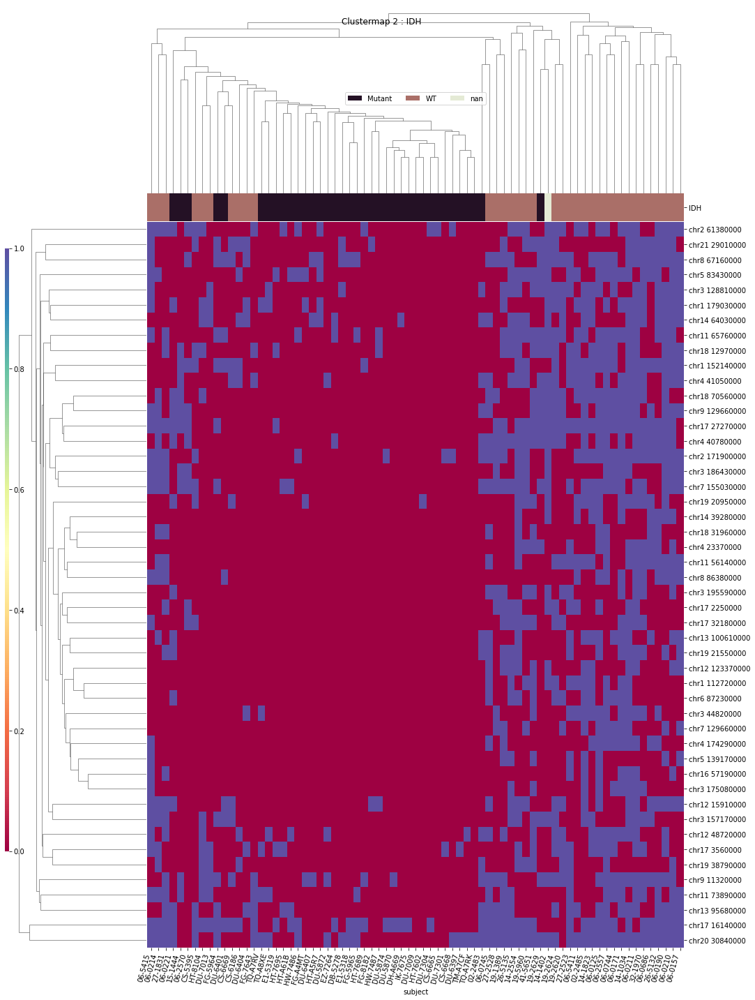

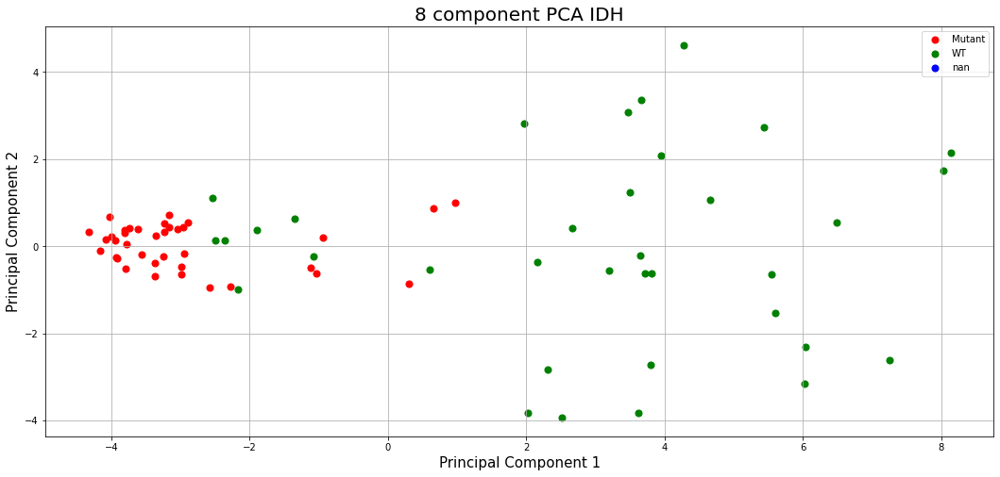

x1p19q
T-Testing
Boxplotting
Clustermapping
['chr1 52180000' 'chr10 42130000' 'chr14 31430000' 'chr14 63160000'
 'chr3 179030000' 'subject' 'x1p19q']


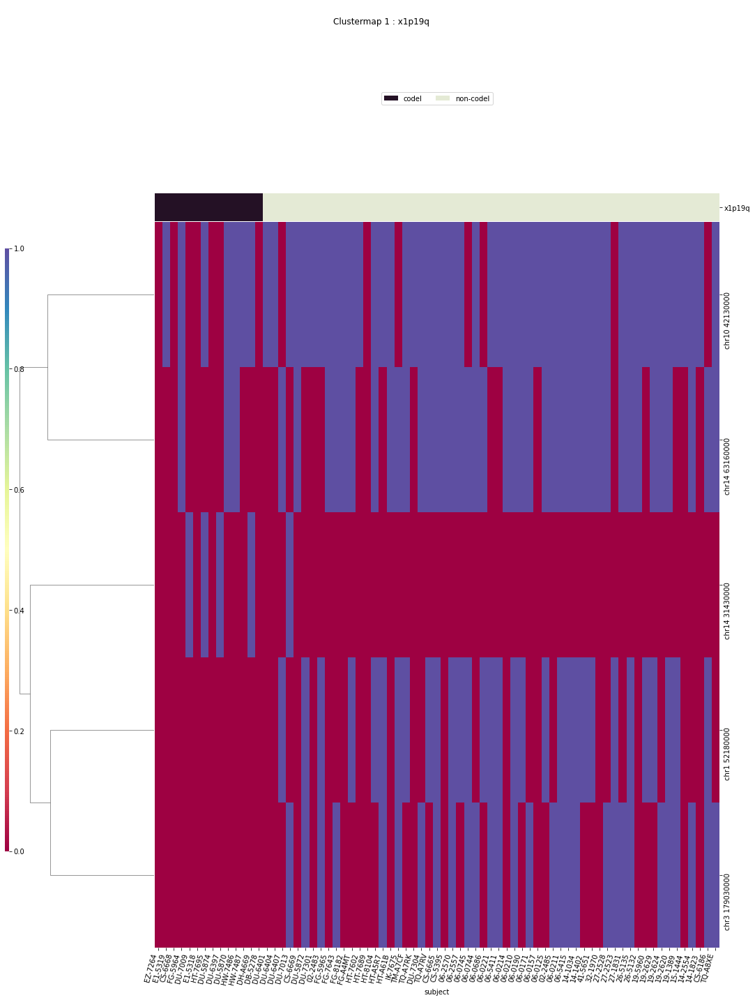

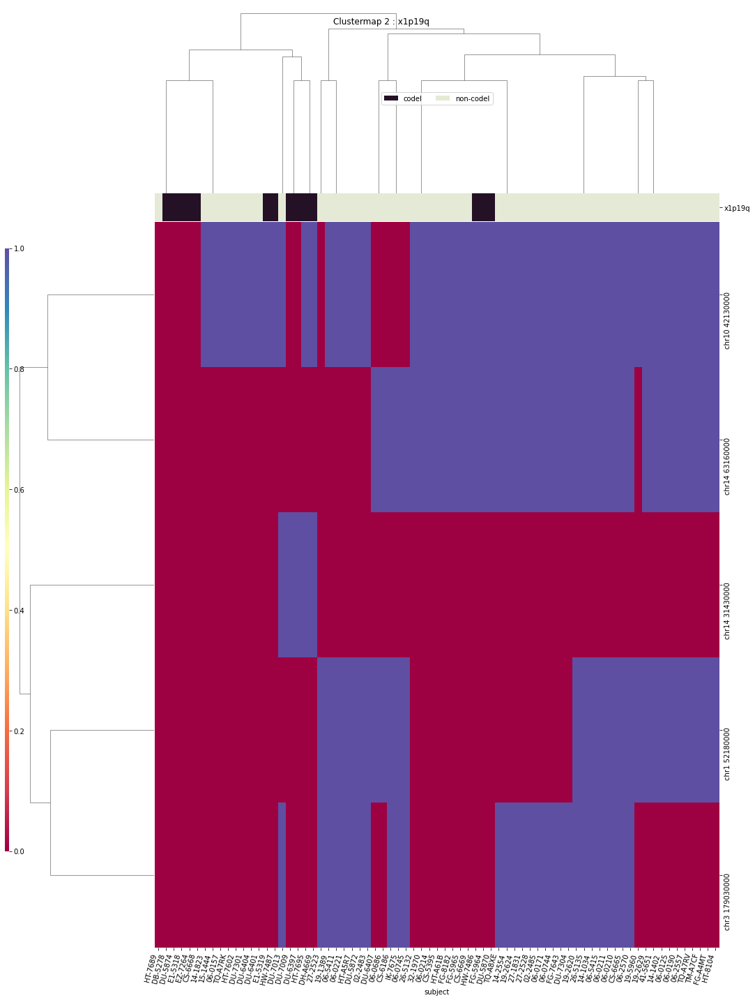

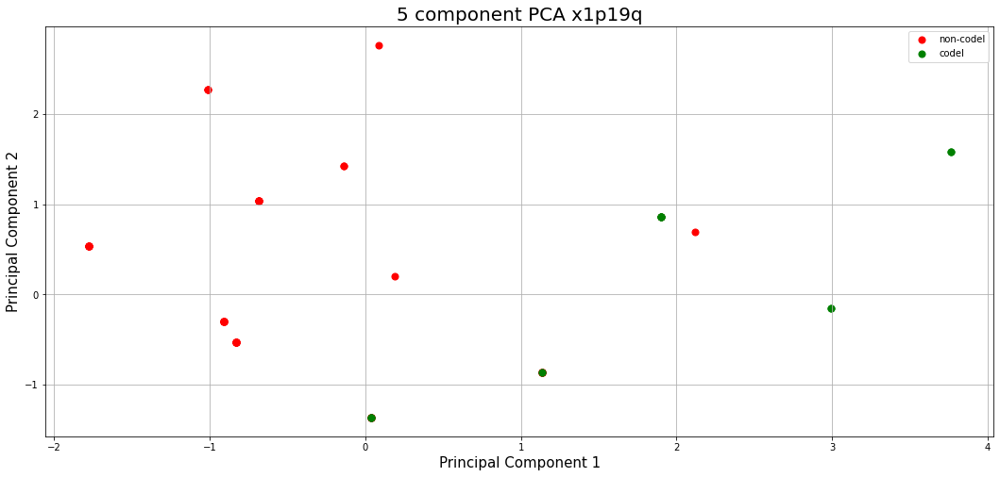

TERT
T-Testing
Boxplotting
Clustermapping
['TERT' 'chr11 56140000' 'chr11 65760000' 'chr17 16140000'
 'chr17 27270000' 'chr18 12970000' 'chr18 31950000' 'chr2 171900000'
 'chr2 50820000' 'chr21 45260000' 'chr4 550000' 'subject']


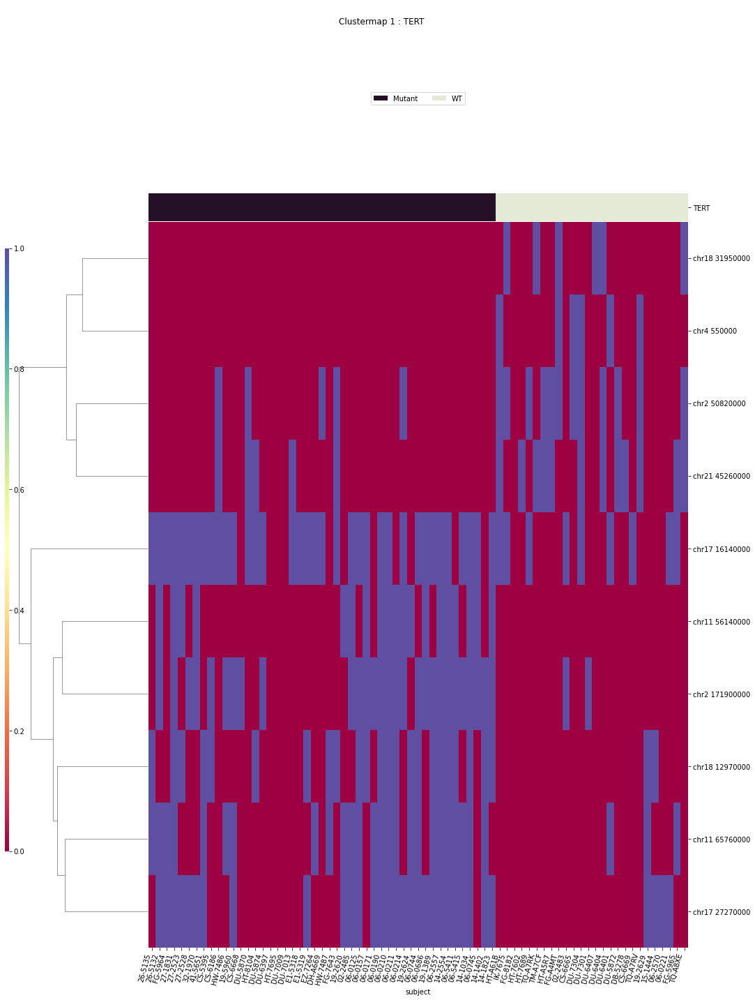

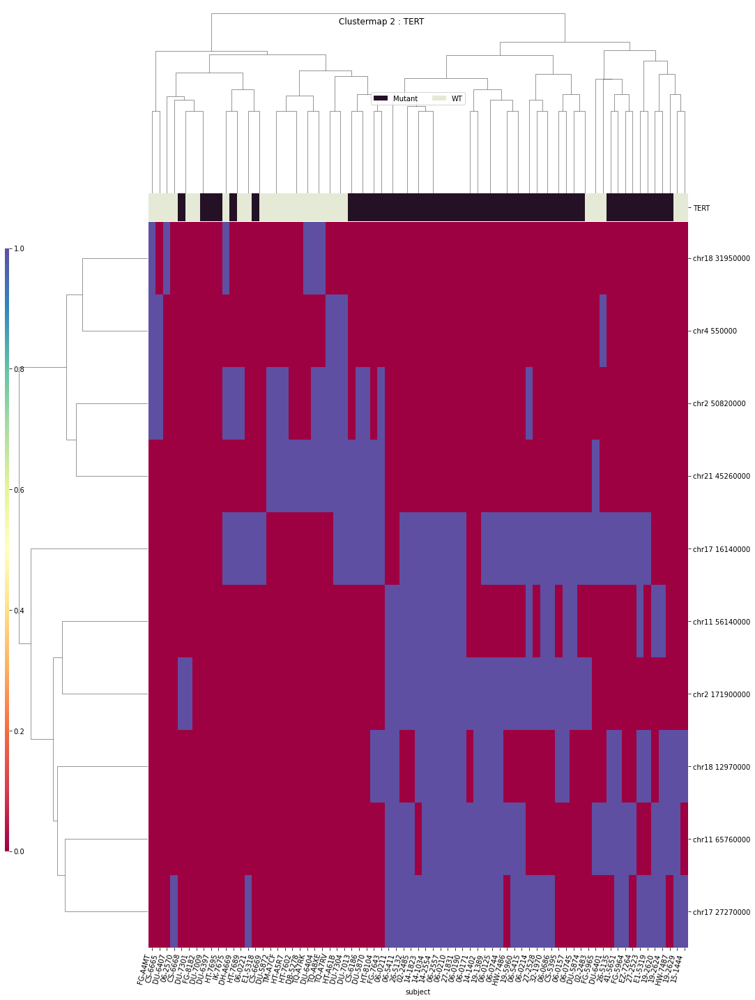

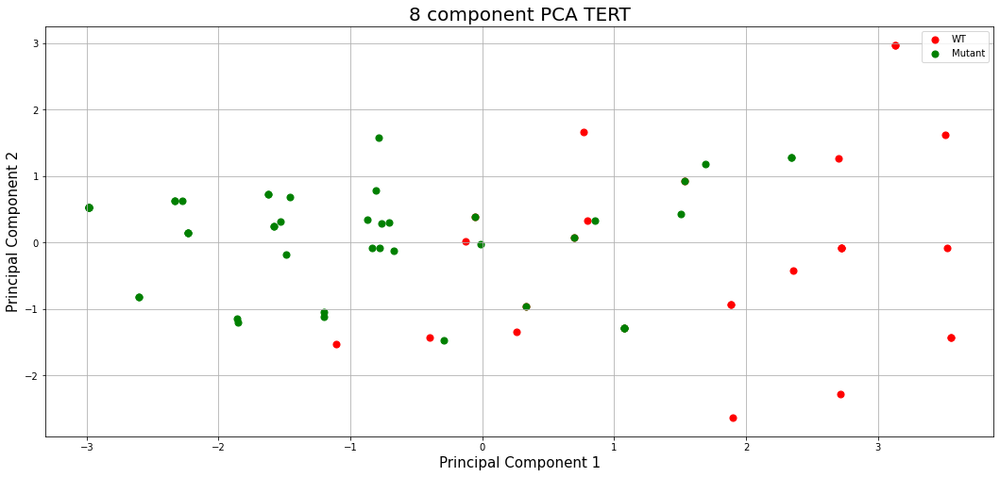

disease_type
T-Testing
Boxplotting
 p : 3.873045396608156e-20  ( t : 12.811611525258288 ) :  chr17 27270000


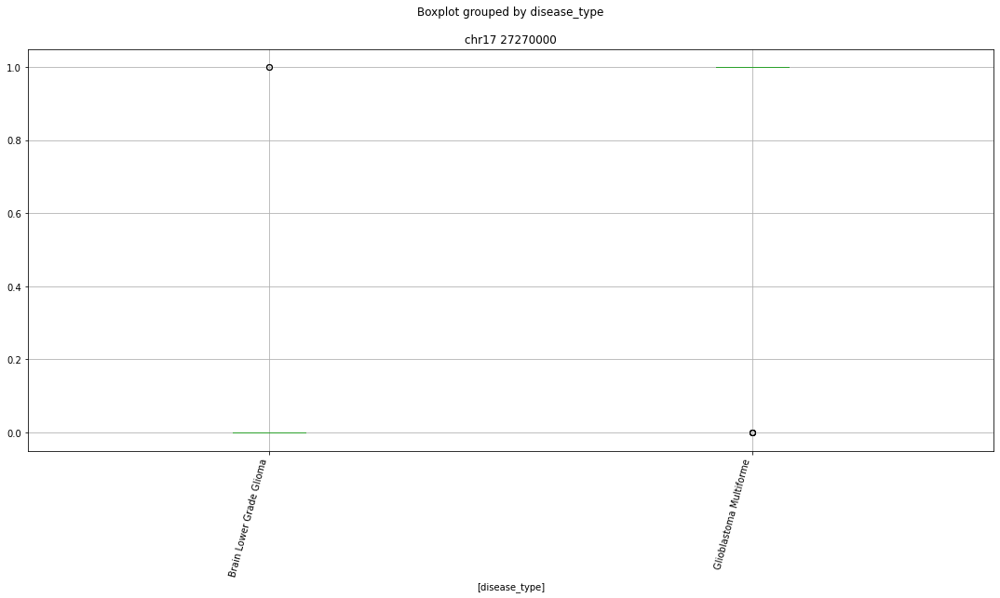

Clustermapping
['chr1 111230000' 'chr1 111520000' 'chr1 11240000' 'chr1 112720000'
 'chr1 11300000' 'chr1 114790000' 'chr1 152140000' 'chr1 153570000'
 'chr1 161610000' 'chr1 202730000' 'chr1 22150000' 'chr1 225610000'
 'chr1 27060000' 'chr1 27280000' 'chr1 36240000' 'chr1 39990000'
 'chr1 65630000' 'chr1 77860000' 'chr1 7950000' 'chr1 86960000'
 'chr1 92020000' 'chr10 102030000' 'chr10 45260000' 'chr10 6990000'
 'chr11 28420000' 'chr11 56140000' 'chr11 60510000' 'chr11 65760000'
 'chr11 6690000' 'chr11 8520000' 'chr11 86730000' 'chr11 95480000'
 'chr12 119350000' 'chr12 123370000' 'chr12 15910000' 'chr12 24990000'
 'chr12 43680000' 'chr12 4680000' 'chr12 56780000' 'chr12 69370000'
 'chr12 69750000' 'chr12 7580000' 'chr12 80300000' 'chr12 89500000'
 'chr13 100610000' 'chr13 23970000' 'chr13 25480000' 'chr13 30270000'
 'chr13 34530000' 'chr13 37280000' 'chr13 81100000' 'chr13 95680000'
 'chr13 95920000' 'chr14 39280000' 'chr14 44600000' 'chr14 70470000'
 'chr14 75920000' 'chr14 94650000

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


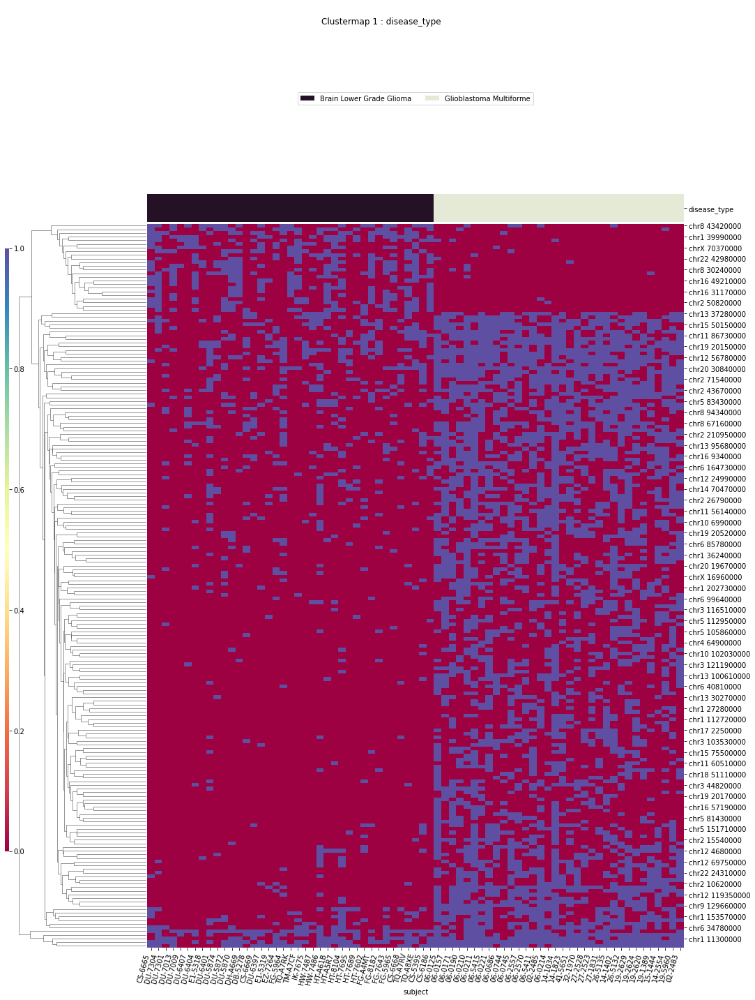

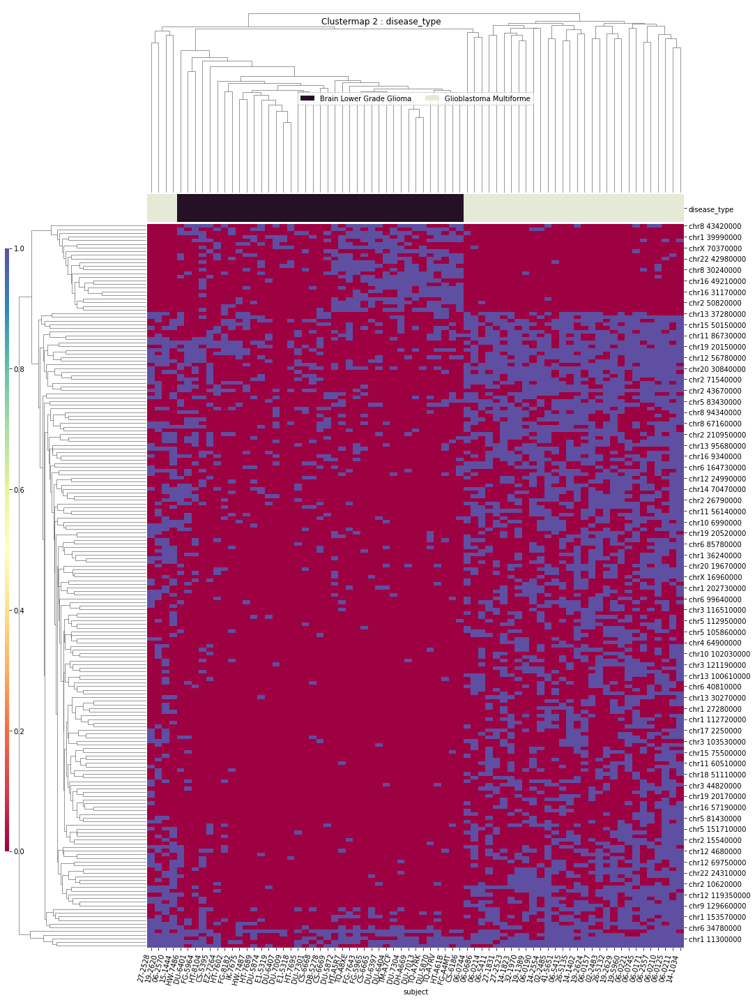

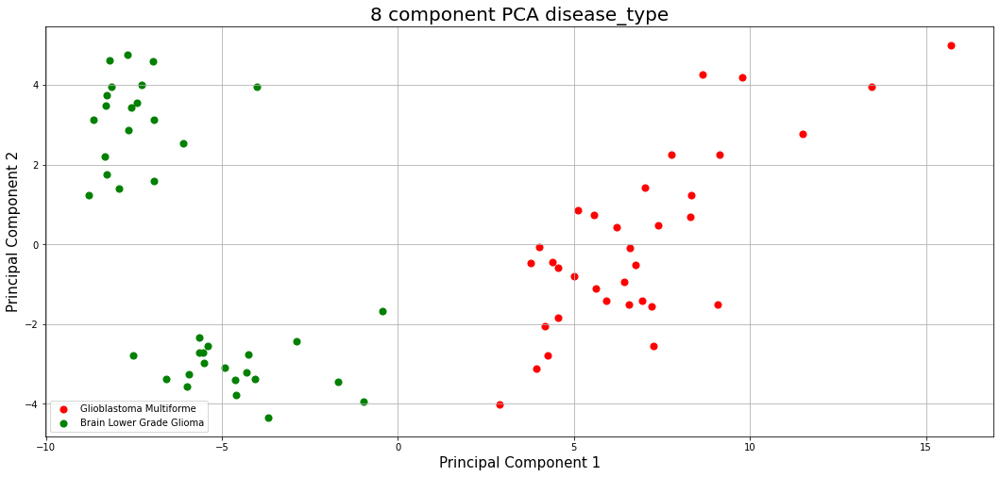

IDH_1p19q_status
T-Testing


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['IDH_1p19q_status' 'chr1 11300000' 'chr1 152140000' 'chr1 179030000'
 'chr1 52180000' 'chr11 112020000' 'chr11 56140000' 'chr11 65760000'
 'chr11 73890000' 'chr12 43680000' 'chr12 48720000' 'chr13 95680000'
 'chr14 63160000' 'chr17 16140000' 'chr17 27270000' 'chr17 46250000'
 'chr18 12970000' 'chr18 70560000' 'chr19 1490000' 'chr2 15610000'
 'chr2 171900000' 'chr20 30840000' 'chr3 15060000' 'chr3 179030000'
 'chr3 186880000' 'chr4 40780000' 'chr4 41050000' 'chr8 51530000'
 'chr9 129660000' 'subject']


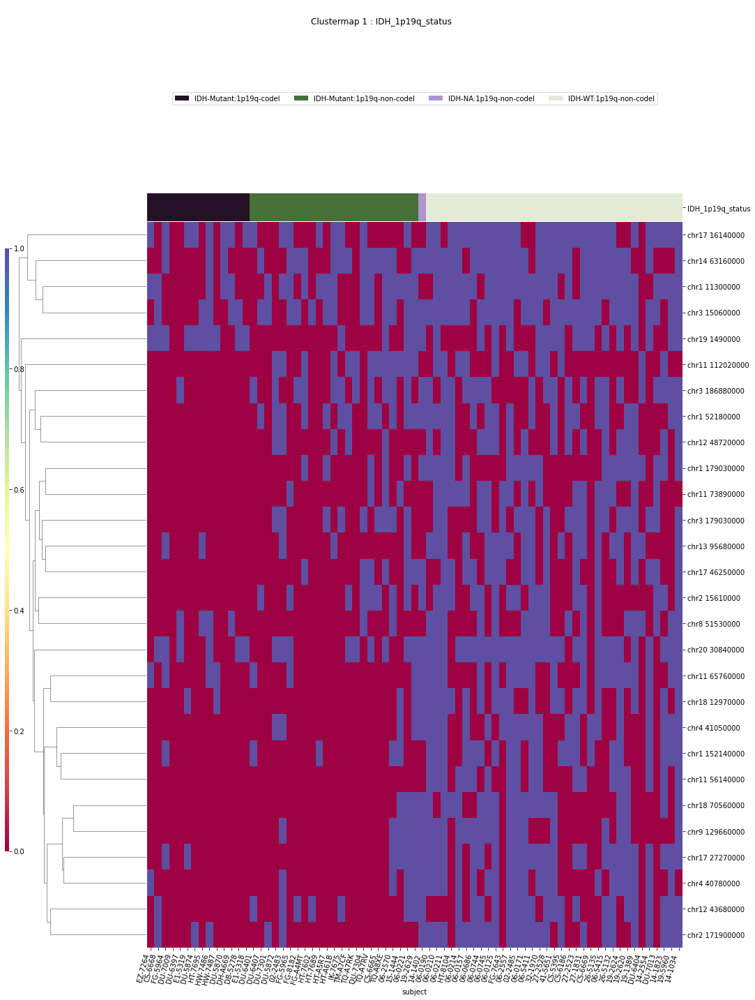

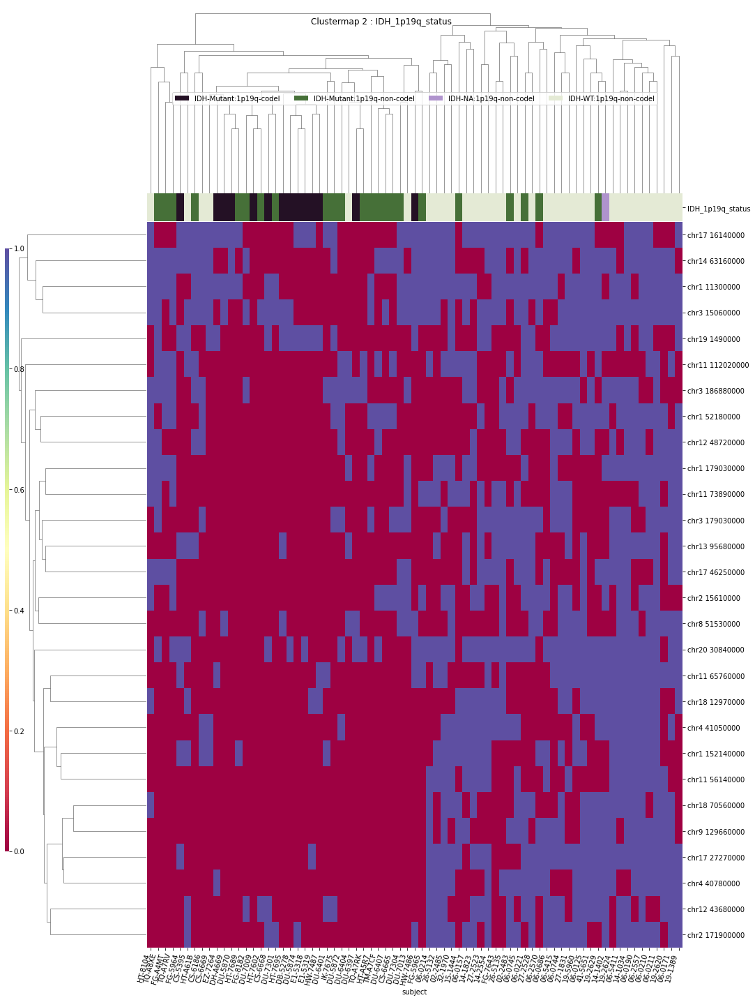

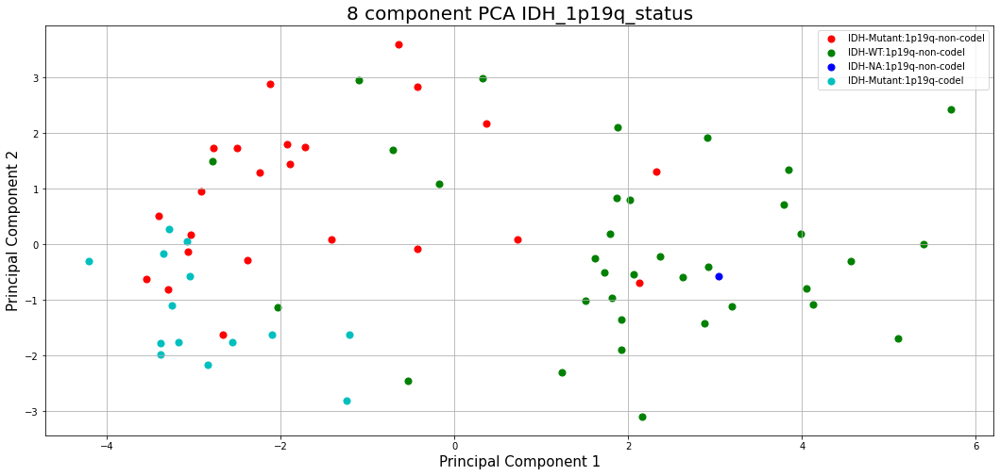

WHO_groups
T-Testing
Boxplotting
 p : 6.278055973426837e-16  ( t : 14.282856857085699 ) :  chr20 30840000


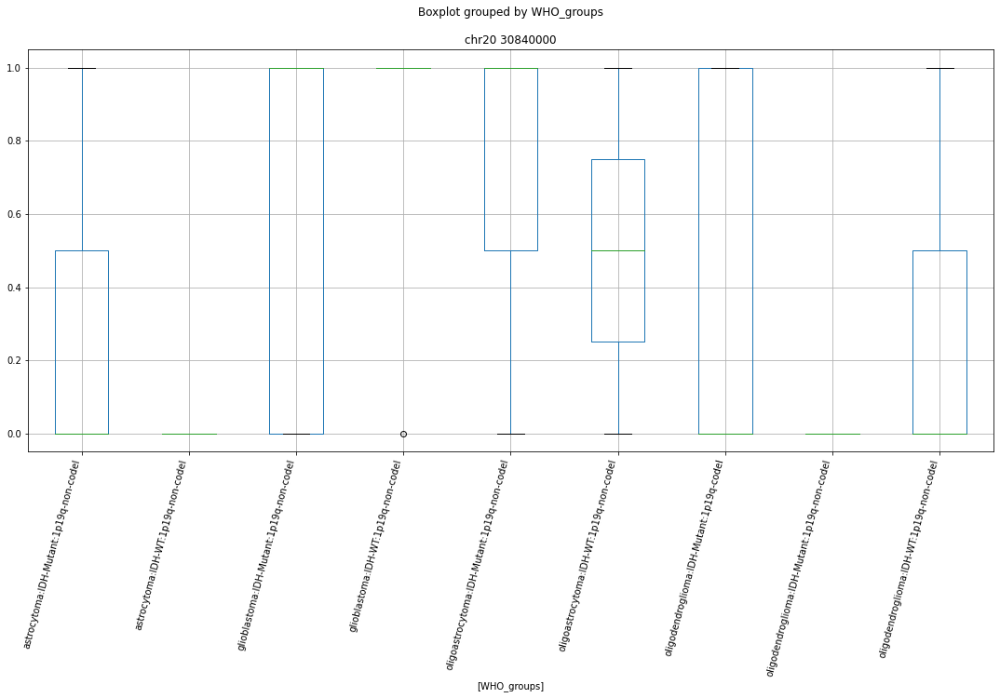

Clustermapping
['WHO_groups' 'chr1 108490000' 'chr1 108530000' 'chr1 11300000'
 'chr1 114790000' 'chr1 12900000' 'chr1 151650000' 'chr1 152140000'
 'chr1 153570000' 'chr1 161610000' 'chr1 167030000' 'chr1 179030000'
 'chr1 179040000' 'chr1 20810000' 'chr1 208650000' 'chr1 209120000'
 'chr1 213150000' 'chr1 22150000' 'chr1 224350000' 'chr1 231120000'
 'chr1 236380000' 'chr1 237670000' 'chr1 247210000' 'chr1 24790000'
 'chr1 27280000' 'chr1 33310000' 'chr1 33510000' 'chr1 36240000'
 'chr1 37890000' 'chr1 39910000' 'chr1 39990000' 'chr1 43500000'
 'chr1 52180000' 'chr1 52870000' 'chr1 6300000' 'chr1 63470000'
 'chr1 77870000' 'chr1 7950000' 'chr1 86210000' 'chr1 86900000'
 'chr1 99850000' 'chr10 122200000' 'chr10 130620000' 'chr10 2800000'
 'chr10 31970000' 'chr10 34970000' 'chr10 45250000' 'chr10 45510000'
 'chr10 6200000' 'chr10 78070000' 'chr10 78460000' 'chr10 84340000'
 'chr10 87070000' 'chr10 98150000' 'chr11 112020000' 'chr11 131080000'
 'chr11 17050000' 'chr11 20540000' 'chr11 284

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


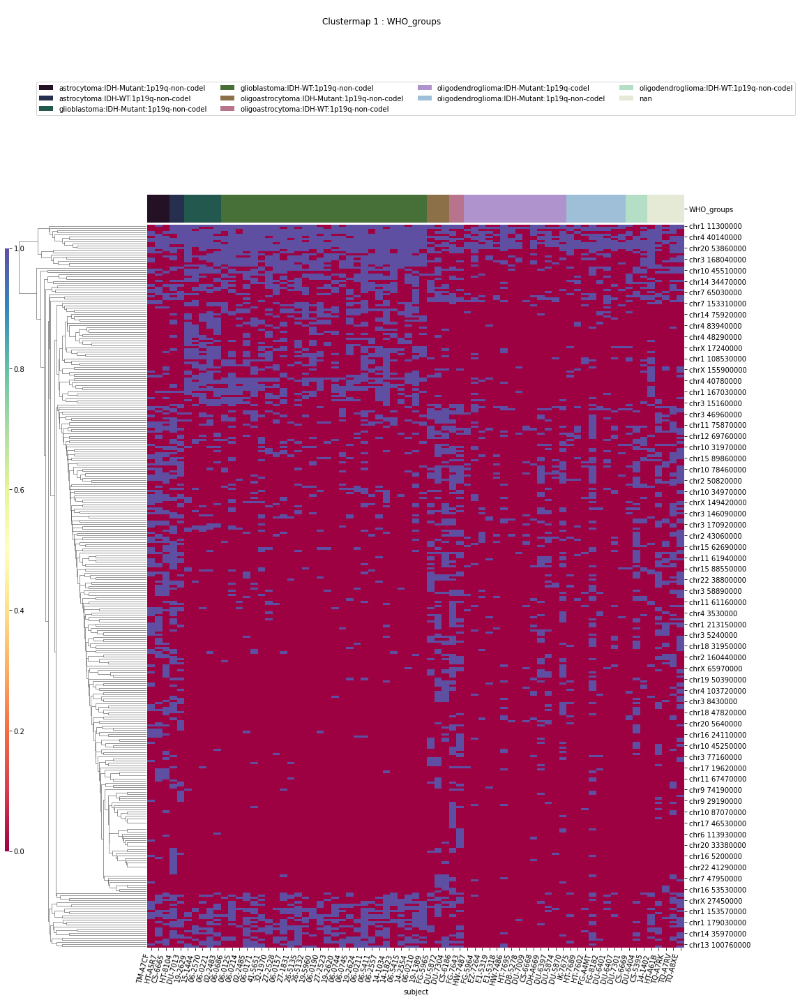

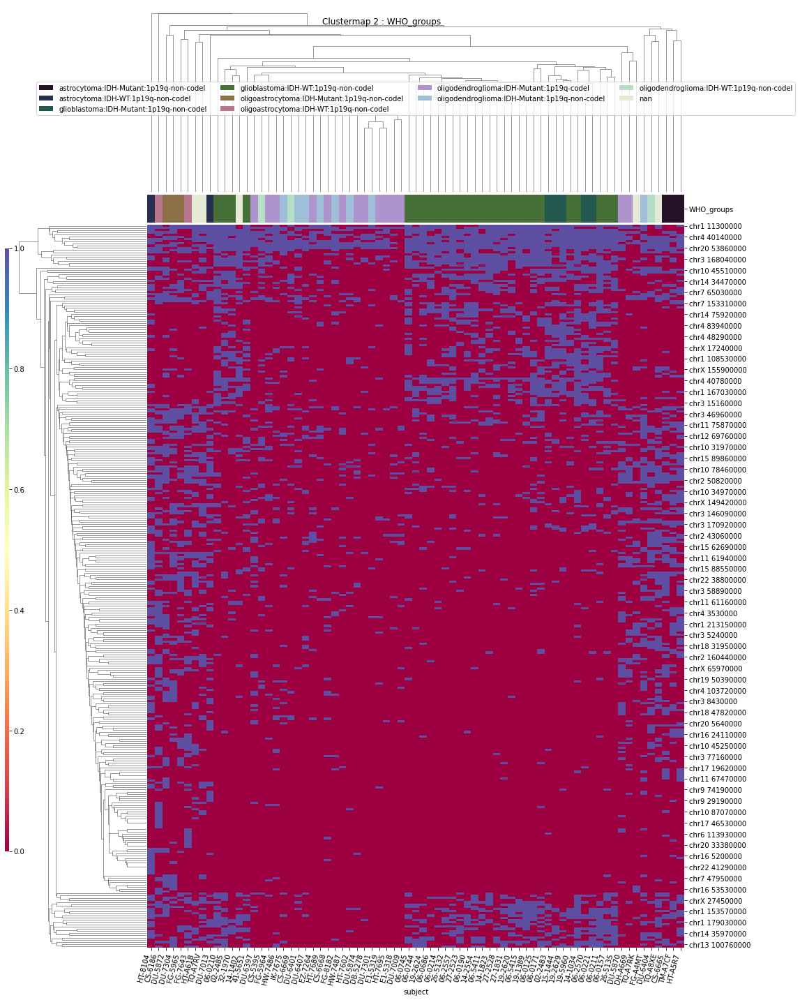

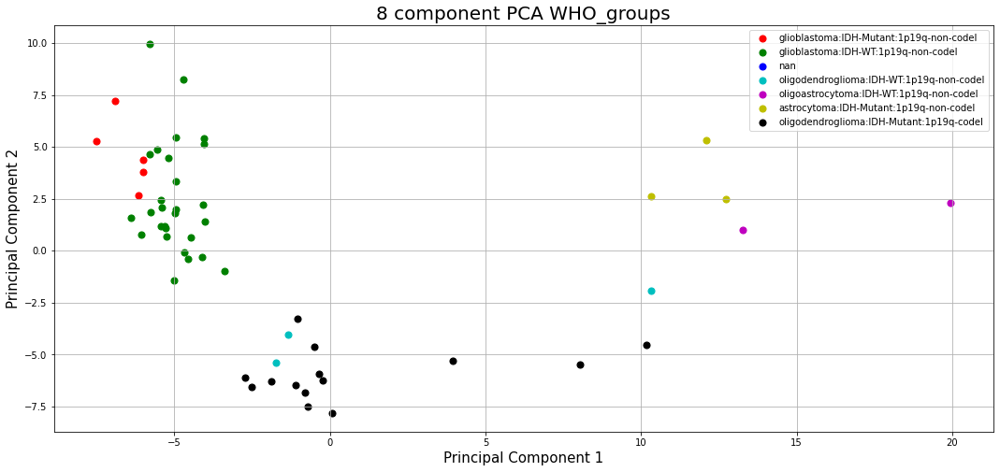

Triple_group
T-Testing


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['Triple_group' 'chr1 108490000' 'chr1 112720000' 'chr1 15130000'
 'chr1 152140000' 'chr1 161610000' 'chr1 179030000' 'chr1 21380000'
 'chr1 224350000' 'chr1 52180000' 'chr10 130620000' 'chr11 112020000'
 'chr11 19860000' 'chr11 56140000' 'chr11 62270000' 'chr11 65760000'
 'chr11 73890000' 'chr11 89860000' 'chr12 43680000' 'chr12 48720000'
 'chr12 7200000' 'chr13 89930000' 'chr13 95680000' 'chr14 20700000'
 'chr14 63160000' 'chr14 76730000' 'chr17 15860000' 'chr17 16140000'
 'chr17 26630000' 'chr17 27270000' 'chr17 46070000' 'chr17 46250000'
 'chr17 47420000' 'chr17 82370000' 'chr18 12970000' 'chr18 31950000'
 'chr18 70560000' 'chr2 138870000' 'chr2 15610000' 'chr2 171900000'
 'chr2 203200000' 'chr2 207600000' 'chr2 41990000' 'chr2 47720000'
 'chr2 50820000' 'chr2 71540000' 'chr20 30840000' 'chr20 36990000'
 'chr20 37120000' 'chr21 29010000' 'chr22 17560000' 'chr22 29850000'
 'chr22 42980000' 'chr3 122720000' 'chr3 128810000' 'chr3 15060000'
 'chr3 168040000'

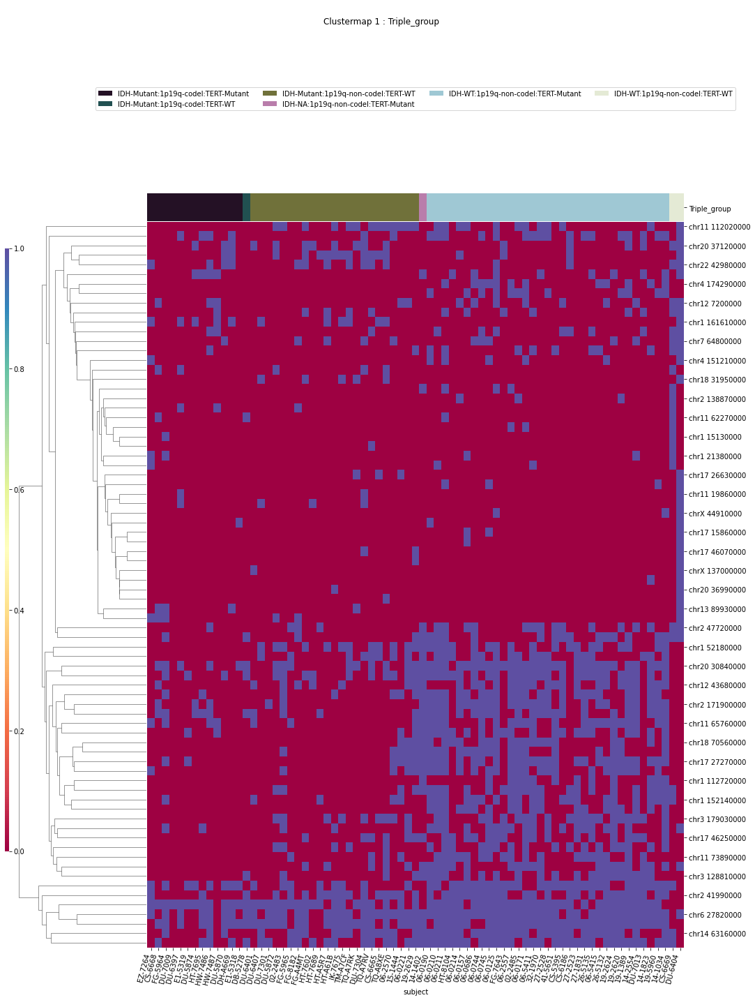

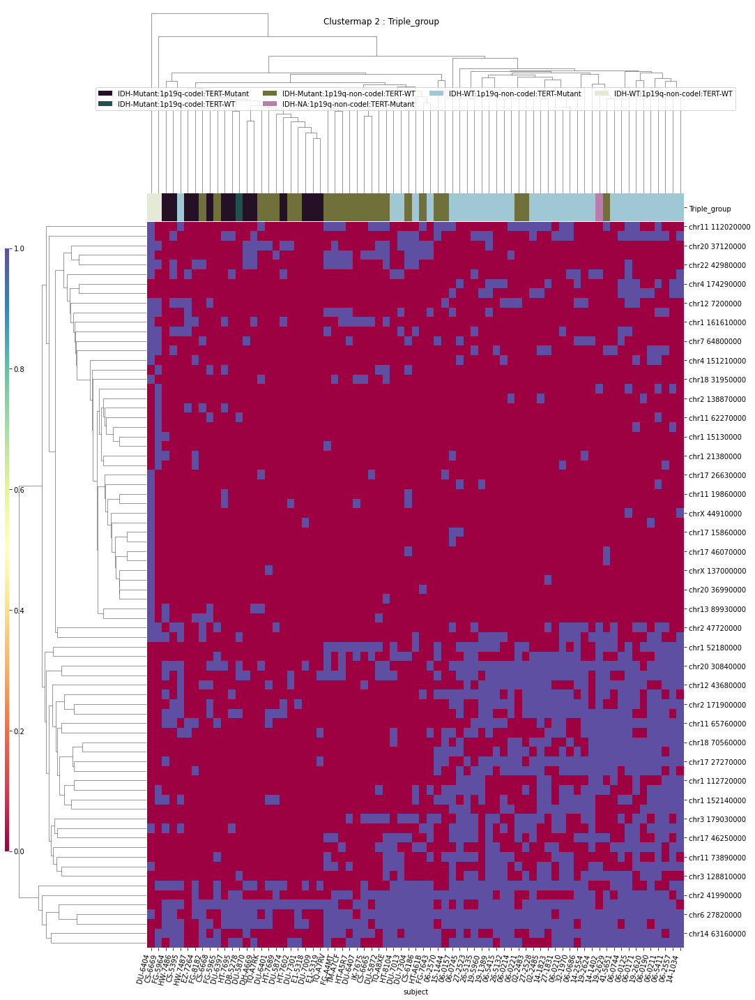

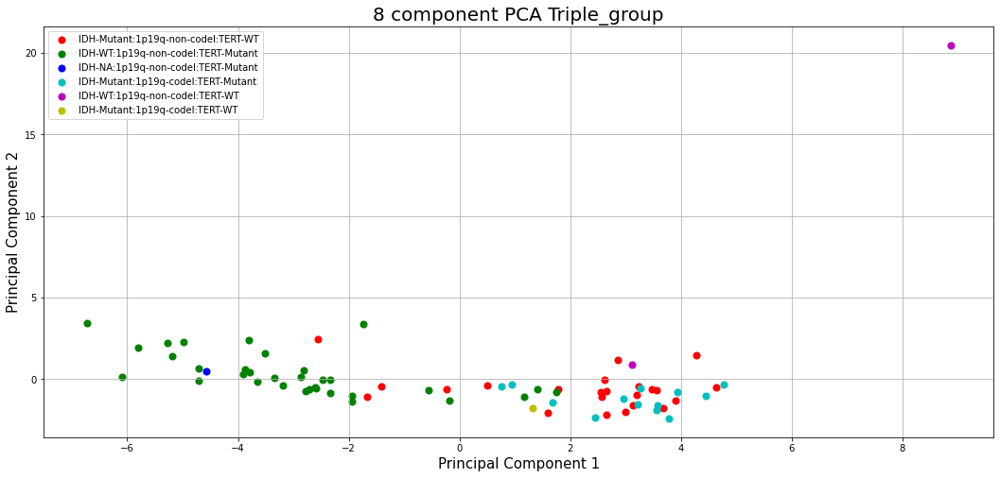

MGMT
T-Testing
Boxplotting
Clustermapping
['MGMT' 'chr21 29010000' 'chr9 92220000' 'subject']


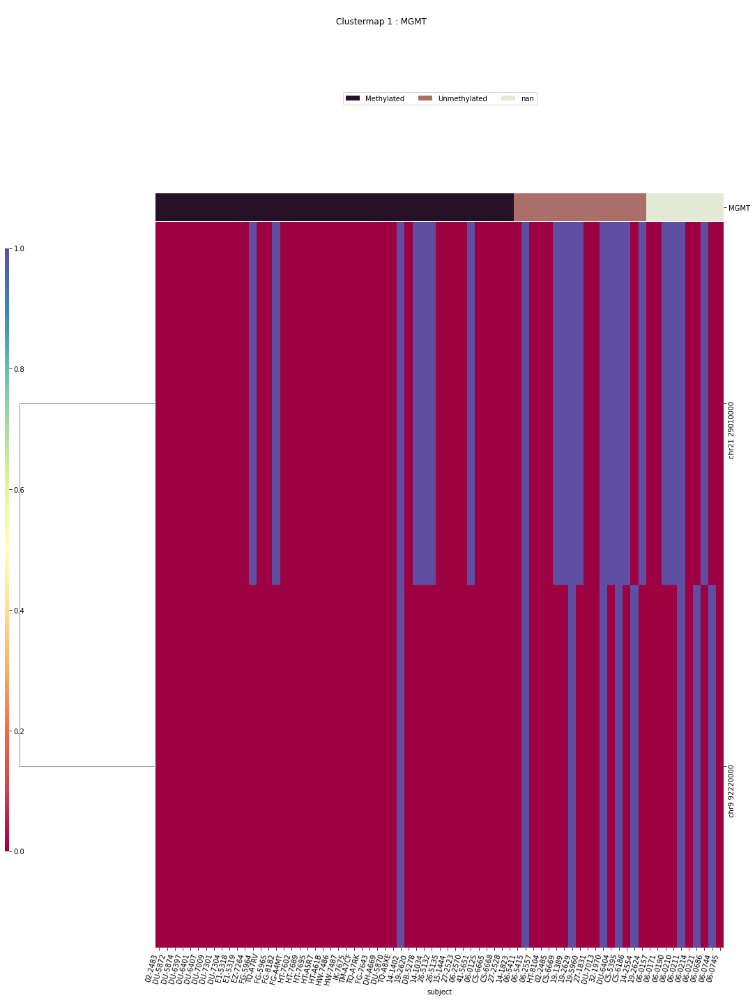

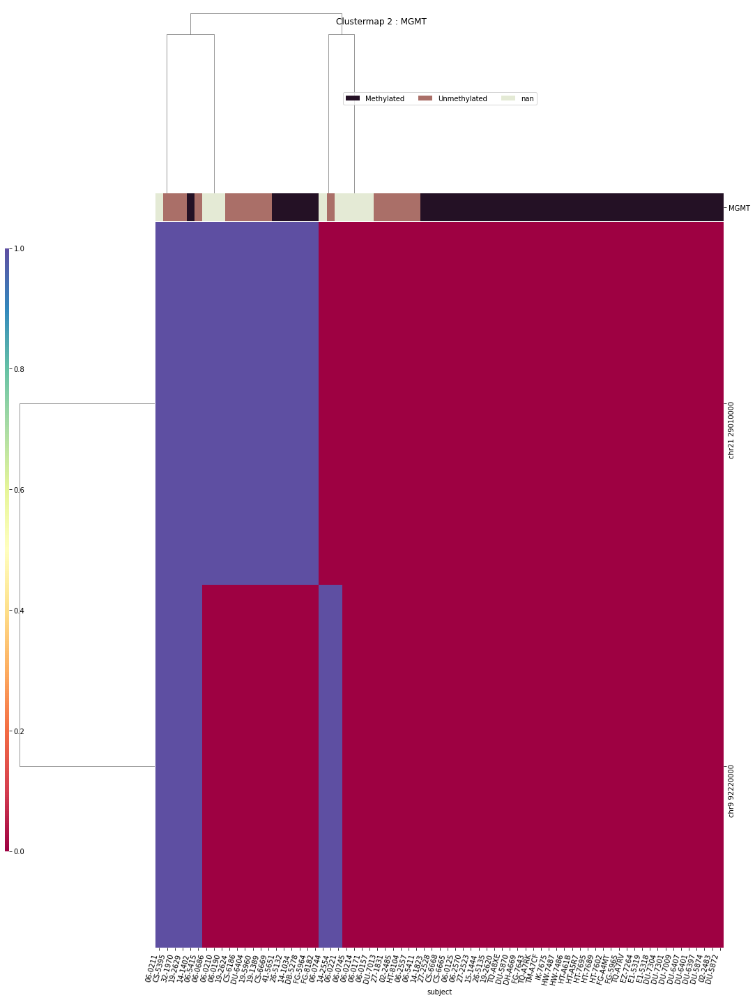

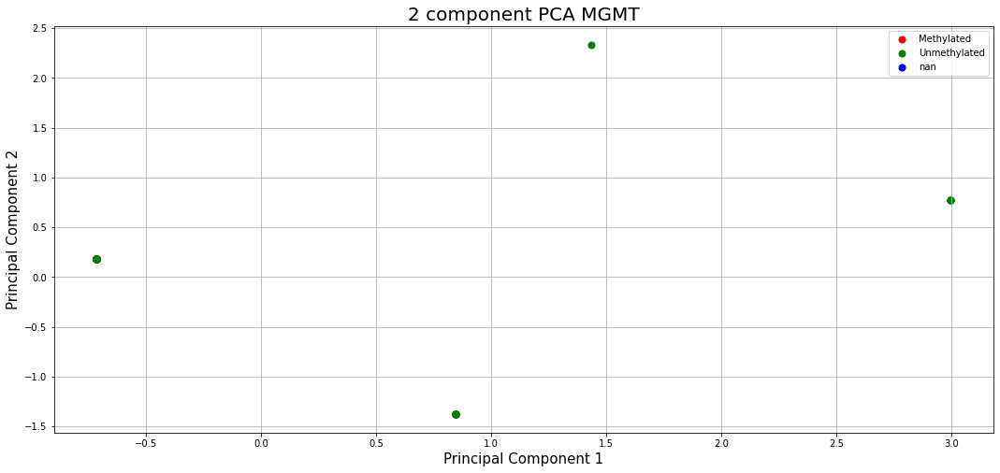

In [114]:
for column in ['primary_diagnosis','IDH','x1p19q','TERT','disease_type',
               'IDH_1p19q_status','WHO_groups','Triple_group','MGMT']:
    print(column)
    ttests_boxplots_and_heatmaps(compdf[compdf['hkle']==hkle],
        compdf.columns[compdf.columns.str.contains("^chr")],column,box_p=1e-15,heat_p=0.001)

In [115]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210601 19:08:26'

---

In [116]:
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [117]:
pd.set_option('display.max_columns', default_max_columns)

In [118]:
pd.set_option('display.max_rows',default_max_rows)

In [119]:
pd.set_option('display.precision', default_precision)